In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno


In [2]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")


In [3]:
data=pd.read_csv('latest_delhi.csv')

#### DATA PREPROCESSING

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43824 entries, 0 to 43823
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Timestamp         43824 non-null  object 
 1   PM2.5 (µg/m³)     41918 non-null  float64
 2   PM10 (µg/m³)      41795 non-null  float64
 3   NO (µg/m³)        41434 non-null  float64
 4   NO2 (µg/m³)       41670 non-null  float64
 5   NOx (ppb)         41627 non-null  float64
 6   NH3 (µg/m³)       41583 non-null  float64
 7   SO2 (µg/m³)       40083 non-null  float64
 8   CO (mg/m³)        40544 non-null  float64
 9   Ozone (µg/m³)     41719 non-null  float64
 10  temp              43824 non-null  float64
 11  feelslike         43824 non-null  float64
 12  dew               43824 non-null  float64
 13  humidity          43824 non-null  float64
 14  precip            43824 non-null  float64
 15  precipprob        43824 non-null  int64  
 16  snow              38216 non-null  float6

##### CHECKING FOR MISSING VALUES AND HANDLING IT

In [5]:
data.isnull().sum()

Timestamp              0
PM2.5 (µg/m³)       1906
PM10 (µg/m³)        2029
NO (µg/m³)          2390
NO2 (µg/m³)         2154
NOx (ppb)           2197
NH3 (µg/m³)         2241
SO2 (µg/m³)         3741
CO (mg/m³)          3280
Ozone (µg/m³)       2105
temp                   0
feelslike              0
dew                    0
humidity               0
precip                 0
precipprob             0
snow                5608
snowdepth              0
windgust               3
windspeed              0
winddir                0
sealevelpressure       0
cloudcover             0
visibility           348
solarradiation        60
solarenergy           60
uvindex               60
conditions             0
icon                   0
dtype: int64

In [6]:
### CHECKING THE PERCENTAGE OF MISSING VALUES IN EACH VARIABLE

data.isnull().sum().sort_values(ascending=False)/data.shape[0]

snow                0.127966
SO2 (µg/m³)         0.085364
CO (mg/m³)          0.074845
NO (µg/m³)          0.054536
NH3 (µg/m³)         0.051136
NOx (ppb)           0.050132
NO2 (µg/m³)         0.049151
Ozone (µg/m³)       0.048033
PM10 (µg/m³)        0.046299
PM2.5 (µg/m³)       0.043492
visibility          0.007941
uvindex             0.001369
solarenergy         0.001369
solarradiation      0.001369
windgust            0.000068
cloudcover          0.000000
Timestamp           0.000000
conditions          0.000000
winddir             0.000000
sealevelpressure    0.000000
precip              0.000000
windspeed           0.000000
snowdepth           0.000000
precipprob          0.000000
humidity            0.000000
dew                 0.000000
feelslike           0.000000
temp                0.000000
icon                0.000000
dtype: float64

<Axes: >

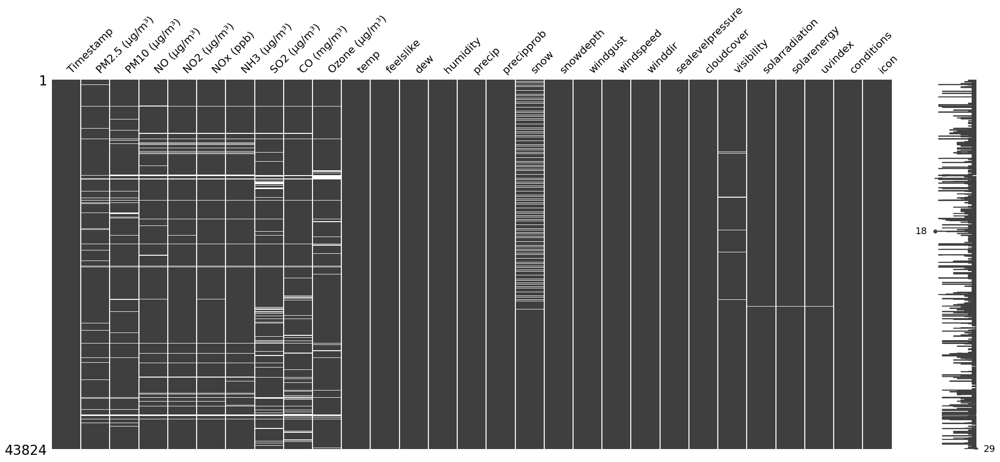

In [7]:
msno.matrix(data)


<Axes: >

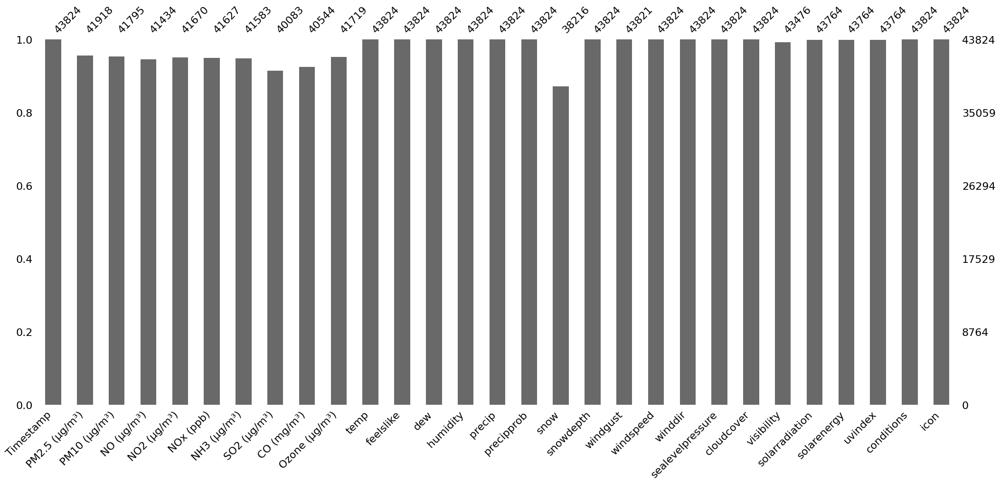

In [8]:
msno.bar(data)

In [9]:
# Converting the 'Timestamp' column to datetime
data['Timestamp'] = pd.to_datetime(data['Timestamp'], format='%d/%m/%Y %H:%M')

# Set the 'Timestamp' column as the index as it is a time series data
data.set_index('Timestamp', inplace=True)

# Inspect the first few rows to understand the dataset structure
data.head()

,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),temp,...,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,conditions,icon
Timestamp,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,501.25,676.50,46.60,74.92,77.85,45.67,18.33,5.60,8.23,9.0,...,0.0,0.0,1020.0,0.0,1.0,0.0,0.0,0.0,Clear,clear-night
2019-01-01 01:00:00,521.25,647.50,45.90,70.80,75.10,46.33,21.43,5.73,8.40,8.6,...,7.6,302.7,1021.0,0.0,NaN,0.0,0.0,0.0,Clear,clear-night
2019-01-01 02:00:00,538.50,684.75,32.15,56.85,56.35,42.30,18.80,3.25,9.45,6.9,...,0.0,305.1,1021.3,0.0,1.0,0.0,0.0,0.0,Clear,clear-night
2019-01-01 03:00:00,465.25,644.50,19.08,46.40,40.22,44.65,18.73,2.05,7.23,8.1,...,7.2,307.0,1021.0,0.0,NaN,0.0,0.0,0.0,Clear,clear-night
2019-01-01 04:00:00,361.00,490.75,10.92,38.00,29.12,44.35,18.60,1.65,7.57,6.1,...,6.8,312.7,1021.0,0.0,NaN,0.0,0.0,0.0,Clear,clear-night


In [10]:
### Description of the dataframe before handling the missing values
data.describe()

,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),temp,...,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex
count,41918.000000,41795.000000,41434.000000,41670.000000,41627.00000,41583.000000,40083.000000,40544.000000,41719.000000,43824.000000,...,43824.0,43821.000000,43824.000000,43824.000000,43824.000000,43824.000000,43476.000000,43764.000000,43764.000000,43764.000000
mean,111.910998,209.827344,26.512055,50.890299,48.69862,28.822179,16.663972,1.316679,26.717426,25.078699,...,0.0,16.949326,7.152387,161.055595,1008.865756,36.363089,2.734456,214.858985,0.773202,2.125514
std,106.331133,145.255792,55.621836,31.130660,55.44162,15.790050,13.519640,1.104992,30.985414,8.175858,...,0.0,8.893328,5.465817,117.615486,7.024897,32.869027,1.840019,291.732047,1.050531,2.939307
min,0.250000,1.000000,0.100000,0.100000,0.10000,0.100000,0.100000,0.000000,0.100000,3.000000,...,0.0,0.400000,0.000000,0.000000,989.400000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,105.250000,2.600000,29.150000,19.00000,17.600000,9.450000,0.620000,7.880000,19.000000,...,0.0,10.400000,2.200000,50.000000,1003.000000,0.000000,2.000000,0.000000,0.000000,0.000000
50%,73.500000,170.250000,5.600000,44.600000,30.30000,26.750000,14.570000,1.000000,14.100000,26.800000,...,0.0,15.100000,7.600000,150.000000,1009.000000,31.800000,2.600000,9.000000,0.000000,0.000000
75%,147.750000,278.750000,22.595000,64.728750,54.75000,36.790000,20.400000,1.650000,32.000000,31.000000,...,0.0,22.000000,10.900000,270.000000,1015.000000,60.000000,3.700000,431.000000,1.600000,4.000000
max,992.000000,997.000000,498.100000,375.000000,499.70000,138.900000,200.000000,9.750000,199.700000,47.000000,...,0.0,85.300000,63.400000,360.000000,1027.000000,100.000000,24.100000,1012.000000,3.600000,10.000000


In [11]:
# Interpolating using a linear method
data_1 = data.interpolate(method='linear')

# Check for missing values after interpolation
missing_values_after = data_1.isnull().sum()

missing_values_after


PM2.5 (µg/m³)       0
PM10 (µg/m³)        0
NO (µg/m³)          0
NO2 (µg/m³)         0
NOx (ppb)           0
NH3 (µg/m³)         0
SO2 (µg/m³)         0
CO (mg/m³)          0
Ozone (µg/m³)       0
temp                0
feelslike           0
dew                 0
humidity            0
precip              0
precipprob          0
snow                0
snowdepth           0
windgust            0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
visibility          0
solarradiation      0
solarenergy         0
uvindex             0
conditions          0
icon                0
dtype: int64

In [12]:
### Description of the dataframe after handling the missing values
data_1.describe()

,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),temp,...,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex
count,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,...,43824.0,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000
mean,110.749796,209.770194,26.897840,50.800747,49.086356,28.855449,17.136706,1.316988,27.823245,25.078699,...,0.0,16.948810,7.152387,161.055595,1008.865756,36.363089,2.728225,215.062000,0.773929,2.127544
std,105.791746,147.077128,57.582030,31.922426,57.333925,16.135388,15.066512,1.104279,32.227708,8.175858,...,0.0,8.893269,5.465817,117.615486,7.024897,32.869027,1.836202,291.597225,1.050044,2.937965
min,0.250000,1.000000,0.100000,0.100000,0.100000,0.100000,0.100000,0.000000,0.100000,3.000000,...,0.0,0.400000,0.000000,0.000000,989.400000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,40.750000,104.750000,2.550000,28.750000,18.750000,17.350000,9.350000,0.620000,8.000000,19.000000,...,0.0,10.400000,2.200000,50.000000,1003.000000,0.000000,2.000000,0.000000,0.000000,0.000000
50%,72.750000,168.750000,5.500000,44.320000,30.080000,26.700000,14.580000,1.000000,14.650000,26.800000,...,0.0,15.100000,7.600000,150.000000,1009.000000,31.800000,2.600000,9.650000,0.000000,0.000000
75%,145.000000,277.750000,22.340625,64.500000,54.800000,36.850000,20.550000,1.655000,33.550000,31.000000,...,0.0,22.000000,10.900000,270.000000,1015.000000,60.000000,3.700000,431.000000,1.600000,4.000000
max,992.000000,997.000000,498.100000,375.000000,499.700000,138.900000,200.000000,9.750000,199.700000,47.000000,...,0.0,85.300000,63.400000,360.000000,1027.000000,100.000000,24.100000,1012.000000,3.600000,10.000000


In [13]:
data_1.columns

Index(['PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'NO (µg/m³)', 'NO2 (µg/m³)',
       'NOx (ppb)', 'NH3 (µg/m³)', 'SO2 (µg/m³)', 'CO (mg/m³)',
       'Ozone (µg/m³)', 'temp', 'feelslike', 'dew', 'humidity', 'precip',
       'precipprob', 'snow', 'snowdepth', 'windgust', 'windspeed', 'winddir',
       'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation',
       'solarenergy', 'uvindex', 'conditions', 'icon'],
      dtype='object')

In [14]:
# Checking for duplicate rows
duplicate_rows = data_1[data_1.duplicated()]

# Print duplicate rows
print("Duplicate Rows:", duplicate_rows.shape)

Duplicate Rows: (0, 28)


###### DATA TRANSFORMATION

In [15]:
data_1['Date'] = data.index.date
data_1['Time'] = data.index.time
data_1['Day'] = data.index.day
data_1['Month'] = data.index.month
data_1['Year'] = data.index.year
data_1['DayOfWeek'] = data.index.dayofweek    
data_1['DayName'] = data.index.day_name()  
data_1.head()

,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),temp,...,uvindex,conditions,icon,Date,Time,Day,Month,Year,DayOfWeek,DayName
Timestamp,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,501.25,676.50,46.60,74.92,77.85,45.67,18.33,5.60,8.23,9.0,...,0.0,Clear,clear-night,2019-01-01,00:00:00,1,1,2019,1,Tuesday
2019-01-01 01:00:00,521.25,647.50,45.90,70.80,75.10,46.33,21.43,5.73,8.40,8.6,...,0.0,Clear,clear-night,2019-01-01,01:00:00,1,1,2019,1,Tuesday
2019-01-01 02:00:00,538.50,684.75,32.15,56.85,56.35,42.30,18.80,3.25,9.45,6.9,...,0.0,Clear,clear-night,2019-01-01,02:00:00,1,1,2019,1,Tuesday
2019-01-01 03:00:00,465.25,644.50,19.08,46.40,40.22,44.65,18.73,2.05,7.23,8.1,...,0.0,Clear,clear-night,2019-01-01,03:00:00,1,1,2019,1,Tuesday
2019-01-01 04:00:00,361.00,490.75,10.92,38.00,29.12,44.35,18.60,1.65,7.57,6.1,...,0.0,Clear,clear-night,2019-01-01,04:00:00,1,1,2019,1,Tuesday


In [16]:
def month_to_season(month):
    
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5, 6]:
        return 'Summer'
    elif month in [7, 8, 9]:
        return 'Monsoon'
    elif month in [10, 11]:
        return 'Autumn'

# Applying the function to the DataFrame to create a 'Season' column
data_1['Season'] = data_1['Month'].apply(month_to_season)

data_1.head()


,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),temp,...,conditions,icon,Date,Time,Day,Month,Year,DayOfWeek,DayName,Season
Timestamp,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,501.25,676.50,46.60,74.92,77.85,45.67,18.33,5.60,8.23,9.0,...,Clear,clear-night,2019-01-01,00:00:00,1,1,2019,1,Tuesday,Winter
2019-01-01 01:00:00,521.25,647.50,45.90,70.80,75.10,46.33,21.43,5.73,8.40,8.6,...,Clear,clear-night,2019-01-01,01:00:00,1,1,2019,1,Tuesday,Winter
2019-01-01 02:00:00,538.50,684.75,32.15,56.85,56.35,42.30,18.80,3.25,9.45,6.9,...,Clear,clear-night,2019-01-01,02:00:00,1,1,2019,1,Tuesday,Winter
2019-01-01 03:00:00,465.25,644.50,19.08,46.40,40.22,44.65,18.73,2.05,7.23,8.1,...,Clear,clear-night,2019-01-01,03:00:00,1,1,2019,1,Tuesday,Winter
2019-01-01 04:00:00,361.00,490.75,10.92,38.00,29.12,44.35,18.60,1.65,7.57,6.1,...,Clear,clear-night,2019-01-01,04:00:00,1,1,2019,1,Tuesday,Winter


In [17]:
unique_icons = data_1['icon'].unique()
unique_icons

array(['clear-night', 'clear-day', 'partly-cloudy-day',
       'partly-cloudy-night', 'fog', 'cloudy', 'rain', 'wind'],
      dtype=object)

In [18]:
# Apply one-hot encoding to the 'icon' column
icon_dummies = pd.get_dummies(data_1['icon'], prefix='icon')

# Joining the one-hot encoded columns back to the original DataFrame
data_transformed = pd.concat([data_1, icon_dummies], axis=1)

# Displaying the first few rows to verify changes
data_transformed_head = data_transformed.head()

data_transformed_head


,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),temp,...,DayName,Season,icon_clear-day,icon_clear-night,icon_cloudy,icon_fog,icon_partly-cloudy-day,icon_partly-cloudy-night,icon_rain,icon_wind
Timestamp,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,501.25,676.50,46.60,74.92,77.85,45.67,18.33,5.60,8.23,9.0,...,Tuesday,Winter,False,True,False,False,False,False,False,False
2019-01-01 01:00:00,521.25,647.50,45.90,70.80,75.10,46.33,21.43,5.73,8.40,8.6,...,Tuesday,Winter,False,True,False,False,False,False,False,False
2019-01-01 02:00:00,538.50,684.75,32.15,56.85,56.35,42.30,18.80,3.25,9.45,6.9,...,Tuesday,Winter,False,True,False,False,False,False,False,False
2019-01-01 03:00:00,465.25,644.50,19.08,46.40,40.22,44.65,18.73,2.05,7.23,8.1,...,Tuesday,Winter,False,True,False,False,False,False,False,False
2019-01-01 04:00:00,361.00,490.75,10.92,38.00,29.12,44.35,18.60,1.65,7.57,6.1,...,Tuesday,Winter,False,True,False,False,False,False,False,False


In [19]:
data_transformed.columns

Index(['PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'NO (µg/m³)', 'NO2 (µg/m³)',
       'NOx (ppb)', 'NH3 (µg/m³)', 'SO2 (µg/m³)', 'CO (mg/m³)',
       'Ozone (µg/m³)', 'temp', 'feelslike', 'dew', 'humidity', 'precip',
       'precipprob', 'snow', 'snowdepth', 'windgust', 'windspeed', 'winddir',
       'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation',
       'solarenergy', 'uvindex', 'conditions', 'icon', 'Date', 'Time', 'Day',
       'Month', 'Year', 'DayOfWeek', 'DayName', 'Season', 'icon_clear-day',
       'icon_clear-night', 'icon_cloudy', 'icon_fog', 'icon_partly-cloudy-day',
       'icon_partly-cloudy-night', 'icon_rain', 'icon_wind'],
      dtype='object')

In [20]:
data_transformed['conditions'].unique()

array(['Clear', 'Partially cloudy', 'Overcast', 'Rain, Partially cloudy',
       'Rain, Overcast', 'Rain'], dtype=object)

In [21]:
# Getting one-hot encoded variables for 'conditions'
conditions_dummies = pd.get_dummies(data_transformed['conditions'], prefix='condition')

# Joining the one-hot encoded columns back to the original DataFrame
data_transformed = pd.concat([data_transformed, conditions_dummies], axis=1)

# Displaying the first few rows to verify changes
data_transformed.head()


,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),temp,...,icon_partly-cloudy-day,icon_partly-cloudy-night,icon_rain,icon_wind,condition_Clear,condition_Overcast,condition_Partially cloudy,condition_Rain,"condition_Rain, Overcast","condition_Rain, Partially cloudy"
Timestamp,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,501.25,676.50,46.60,74.92,77.85,45.67,18.33,5.60,8.23,9.0,...,False,False,False,False,True,False,False,False,False,False
2019-01-01 01:00:00,521.25,647.50,45.90,70.80,75.10,46.33,21.43,5.73,8.40,8.6,...,False,False,False,False,True,False,False,False,False,False
2019-01-01 02:00:00,538.50,684.75,32.15,56.85,56.35,42.30,18.80,3.25,9.45,6.9,...,False,False,False,False,True,False,False,False,False,False
2019-01-01 03:00:00,465.25,644.50,19.08,46.40,40.22,44.65,18.73,2.05,7.23,8.1,...,False,False,False,False,True,False,False,False,False,False
2019-01-01 04:00:00,361.00,490.75,10.92,38.00,29.12,44.35,18.60,1.65,7.57,6.1,...,False,False,False,False,True,False,False,False,False,False


In [22]:
data_transformed.describe()

,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),temp,...,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,Day,Month,Year,DayOfWeek
count,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,...,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000
mean,110.749796,209.770194,26.897840,50.800747,49.086356,28.855449,17.136706,1.316988,27.823245,25.078699,...,1008.865756,36.363089,2.728225,215.062000,0.773929,2.127544,15.727820,6.523549,2020.999452,3.001643
std,105.791746,147.077128,57.582030,31.922426,57.333925,16.135388,15.066512,1.104279,32.227708,8.175858,...,7.024897,32.869027,1.836202,291.597225,1.050044,2.937965,8.799425,3.448572,1.414036,1.999337
min,0.250000,1.000000,0.100000,0.100000,0.100000,0.100000,0.100000,0.000000,0.100000,3.000000,...,989.400000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,2019.000000,0.000000
25%,40.750000,104.750000,2.550000,28.750000,18.750000,17.350000,9.350000,0.620000,8.000000,19.000000,...,1003.000000,0.000000,2.000000,0.000000,0.000000,0.000000,8.000000,4.000000,2020.000000,1.000000
50%,72.750000,168.750000,5.500000,44.320000,30.080000,26.700000,14.580000,1.000000,14.650000,26.800000,...,1009.000000,31.800000,2.600000,9.650000,0.000000,0.000000,16.000000,7.000000,2021.000000,3.000000
75%,145.000000,277.750000,22.340625,64.500000,54.800000,36.850000,20.550000,1.655000,33.550000,31.000000,...,1015.000000,60.000000,3.700000,431.000000,1.600000,4.000000,23.000000,10.000000,2022.000000,5.000000
max,992.000000,997.000000,498.100000,375.000000,499.700000,138.900000,200.000000,9.750000,199.700000,47.000000,...,1027.000000,100.000000,24.100000,1012.000000,3.600000,10.000000,31.000000,12.000000,2023.000000,6.000000


In [23]:
data_transformed['Time'].unique

<bound method Series.unique of Timestamp
2019-01-01 00:00:00    00:00:00
2019-01-01 01:00:00    01:00:00
2019-01-01 02:00:00    02:00:00
2019-01-01 03:00:00    03:00:00
2019-01-01 04:00:00    04:00:00
                         ...   
2023-12-31 19:00:00    19:00:00
2023-12-31 20:00:00    20:00:00
2023-12-31 21:00:00    21:00:00
2023-12-31 22:00:00    22:00:00
2023-12-31 23:00:00    23:00:00
Name: Time, Length: 43824, dtype: object>

In [24]:
data_transformed.dtypes

PM2.5 (µg/m³)                       float64
PM10 (µg/m³)                        float64
NO (µg/m³)                          float64
NO2 (µg/m³)                         float64
NOx (ppb)                           float64
NH3 (µg/m³)                         float64
SO2 (µg/m³)                         float64
CO (mg/m³)                          float64
Ozone (µg/m³)                       float64
temp                                float64
feelslike                           float64
dew                                 float64
humidity                            float64
precip                              float64
precipprob                            int64
snow                                float64
snowdepth                             int64
windgust                            float64
windspeed                           float64
winddir                             float64
sealevelpressure                    float64
cloudcover                          float64
visibility                      

In [25]:
## Using Cyclical Encoding for Time
import numpy as np

# Converting 'Time' to string and then extract the hour
data_transformed['Time'] = data_transformed['Time'].astype(str)
data_transformed['Hour'] = data_transformed['Time'].str.split(':').str[0].astype(int)

# Apply the sine and cosine transformations
data_transformed['Hour_sin'] = np.sin(2 * np.pi * data_transformed['Hour'] / 24)
data_transformed['Hour_cos'] = np.cos(2 * np.pi * data_transformed['Hour'] / 24)


In [26]:
data_transformed.head()

,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),temp,...,icon_wind,condition_Clear,condition_Overcast,condition_Partially cloudy,condition_Rain,"condition_Rain, Overcast","condition_Rain, Partially cloudy",Hour,Hour_sin,Hour_cos
Timestamp,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,501.25,676.50,46.60,74.92,77.85,45.67,18.33,5.60,8.23,9.0,...,False,True,False,False,False,False,False,0,0.000000,1.000000
2019-01-01 01:00:00,521.25,647.50,45.90,70.80,75.10,46.33,21.43,5.73,8.40,8.6,...,False,True,False,False,False,False,False,1,0.258819,0.965926
2019-01-01 02:00:00,538.50,684.75,32.15,56.85,56.35,42.30,18.80,3.25,9.45,6.9,...,False,True,False,False,False,False,False,2,0.500000,0.866025
2019-01-01 03:00:00,465.25,644.50,19.08,46.40,40.22,44.65,18.73,2.05,7.23,8.1,...,False,True,False,False,False,False,False,3,0.707107,0.707107
2019-01-01 04:00:00,361.00,490.75,10.92,38.00,29.12,44.35,18.60,1.65,7.57,6.1,...,False,True,False,False,False,False,False,4,0.866025,0.500000


In [27]:
data_transformed['Season'].unique()

array(['Winter', 'Summer', 'Monsoon', 'Autumn'], dtype=object)

In [28]:
# Defining a mapping from season to ordinal values
season_ordinal_mapping = {
    'Winter': 0,
    'Summer': 1,
    'Monsoon': 2,  
    'Autumn': 3
}

# Mapping seasons to ordinal values
data_transformed['Season_Ordinal'] = data_transformed['Season'].map(season_ordinal_mapping)


In [29]:
total_seasons = 4

data_transformed['Season_Sin'] = np.sin(2 * np.pi * data_transformed['Season_Ordinal'] / total_seasons)
data_transformed['Season_Cos'] = np.cos(2 * np.pi * data_transformed['Season_Ordinal'] / total_seasons)


In [30]:
data_transformed.shape

(43824, 56)

### FEATURE ENGINEERING WITH MOVING AVERAGE

In [31]:
# For Ozone 
data_transformed['Ozone_8hr_avg'] = data_transformed['Ozone (µg/m³)'].rolling(window=8, min_periods=1).mean()

# For CO 
data_transformed['CO_8hr_avg'] = data_transformed['CO (mg/m³)'].rolling(window=8, min_periods=1).mean()

#FOR PM10
data_transformed['PM10_24hr_avg'] = data_transformed['PM10 (µg/m³)'].rolling(window=24, min_periods=16).mean()

#FOR PM2.5
data_transformed['PM25_24hr_avg'] = data_transformed['PM2.5 (µg/m³)'].rolling(window=24, min_periods=16).mean()

#FOR SO2
data_transformed['SO2_24hr_avg'] = data_transformed['SO2 (µg/m³)'].rolling(window=24, min_periods=16).mean()

#FOR NO2
data_transformed['NO2_24hr_avg'] = data_transformed['NO2 (µg/m³)'].rolling(window=24, min_periods=16).mean()

#FOR NH3
data_transformed['NH3_24hr_avg'] = data_transformed['NH3 (µg/m³)'].rolling(window=24, min_periods=16).mean()


In [32]:
data_transformed.head(18)

,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),temp,...,Season_Ordinal,Season_Sin,Season_Cos,Ozone_8hr_avg,CO_8hr_avg,PM10_24hr_avg,PM25_24hr_avg,SO2_24hr_avg,NO2_24hr_avg,NH3_24hr_avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,501.25,676.50,46.60,74.92,77.85,45.67,18.33,5.60,8.23,9.0,...,0,0.0,1.0,8.230000,5.600000,NaN,NaN,NaN,NaN,NaN
2019-01-01 01:00:00,521.25,647.50,45.90,70.80,75.10,46.33,21.43,5.73,8.40,8.6,...,0,0.0,1.0,8.315000,5.665000,NaN,NaN,NaN,NaN,NaN
2019-01-01 02:00:00,538.50,684.75,32.15,56.85,56.35,42.30,18.80,3.25,9.45,6.9,...,0,0.0,1.0,8.693333,4.860000,NaN,NaN,NaN,NaN,NaN
2019-01-01 03:00:00,465.25,644.50,19.08,46.40,40.22,44.65,18.73,2.05,7.23,8.1,...,0,0.0,1.0,8.327500,4.157500,NaN,NaN,NaN,NaN,NaN
2019-01-01 04:00:00,361.00,490.75,10.92,38.00,29.12,44.35,18.60,1.65,7.57,6.1,...,0,0.0,1.0,8.176000,3.656000,NaN,NaN,NaN,NaN,NaN
2019-01-01 05:00:00,342.75,464.00,11.62,36.80,29.03,44.25,16.95,1.60,7.93,5.8,...,0,0.0,1.0,8.135000,3.313333,NaN,NaN,NaN,NaN,NaN
2019-01-01 06:00:00,336.00,450.25,10.60,34.43,26.93,44.05,17.20,1.75,7.80,6.0,...,0,0.0,1.0,8.087143,3.090000,NaN,NaN,NaN,NaN,NaN
2019-01-01 07:00:00,316.75,424.25,10.15,34.68,26.72,43.50,17.80,1.63,7.80,7.0,...,0,0.0,1.0,8.051250,2.907500,NaN,NaN,NaN,NaN,NaN
2019-01-01 08:00:00,325.25,440.75,11.25,38.65,29.72,43.83,18.47,2.07,8.18,6.8,...,0,0.0,1.0,8.045000,2.466250,NaN,NaN,NaN,NaN,NaN


In [33]:
data_transformed.isna().sum()

PM2.5 (µg/m³)     0
PM10 (µg/m³)      0
NO (µg/m³)        0
NO2 (µg/m³)       0
NOx (ppb)         0
                 ..
PM10_24hr_avg    15
PM25_24hr_avg    15
SO2_24hr_avg     15
NO2_24hr_avg     15
NH3_24hr_avg     15
Length: 63, dtype: int64

In [34]:
# Dropping rows with missing values a result of MA
data_transformed_1= data_transformed.dropna()


In [35]:
data_transformed_1.isnull().sum()

PM2.5 (µg/m³)    0
PM10 (µg/m³)     0
NO (µg/m³)       0
NO2 (µg/m³)      0
NOx (ppb)        0
                ..
PM10_24hr_avg    0
PM25_24hr_avg    0
SO2_24hr_avg     0
NO2_24hr_avg     0
NH3_24hr_avg     0
Length: 63, dtype: int64

In [36]:
## PM10 Sub-Index calculation
def get_PM10_subindex(x):
    if x <= 50:
        return x
    elif x <= 100:
        return x
    elif x <= 250:
        return 100 + (x - 100) * 100 / 150
    elif x <= 350:
        return 200 + (x - 250)
    elif x <= 430:
        return 300 + (x - 350) * 100 / 80
    elif x > 430:
        return 400 + (x - 430) * 100 / 80
    else:
        return 0

data_transformed_1['PM10_subindex'] = data_transformed_1['PM10_24hr_avg'].apply(lambda x: get_PM10_subindex(x))

In [37]:
## PM2.5 Sub-Index calculation
def get_PM25_subindex(x):
    if x <= 30:
        return x * 50 / 30
    elif x <= 60:
        return 50 + (x - 30) * 50 / 30
    elif x <= 90:
        return 100 + (x - 60) * 100 / 30
    elif x <= 120:
        return 200 + (x - 90) * 100 / 30
    elif x <= 250:
        return 300 + (x - 120) * 100 / 130
    elif x > 250:
        return 400 + (x - 250) * 100 / 130
    else:
        return 0

data_transformed_1['PM2.5_subindex'] = data_transformed_1['PM25_24hr_avg'].apply(lambda x: get_PM25_subindex(x))

In [38]:
## SO2 Sub-Index calculation
def get_SO2_subindex(x):
    if x <= 40:
        return x * 50 / 40
    elif x <= 80:
        return 50 + (x - 40) * 50 / 40
    elif x <= 380:
        return 100 + (x - 80) * 100 / 300
    elif x <= 800:
        return 200 + (x - 380) * 100 / 420
    elif x <= 1600:
        return 300 + (x - 800) * 100 / 800
    elif x > 1600:
        return 400 + (x - 1600) * 100 / 800
    else:
        return 0

data_transformed_1['SO2_subindex'] = data_transformed_1['SO2_24hr_avg'].apply(lambda x: get_SO2_subindex(x))

In [39]:
## NO2 Sub-Index calculation
def get_NO2_subindex(x):
    if x <= 40:
        return x * 50 / 40
    elif x <= 80:
        return 50 + (x - 40) * 50 / 40
    elif x <= 180:
        return 100 + (x - 80) * 100 / 100
    elif x <= 280:
        return 200 + (x - 180) * 100 / 100
    elif x <= 400:
        return 300 + (x - 280) * 100 / 120
    elif x > 400:
        return 400 + (x - 400) * 100 / 120
    else:
        return 0

data_transformed_1["NO2_SubIndex"] = data_transformed_1["NO2_24hr_avg"].apply(lambda x: get_NO2_subindex(x))

In [40]:
## NH3 Sub-Index calculation
def get_NH3_subindex(x):
    if x <= 200:
        return x * 50 / 200
    elif x <= 400:
        return 50 + (x - 200) * 50 / 200
    elif x <= 800:
        return 100 + (x - 400) * 100 / 400
    elif x <= 1200:
        return 200 + (x - 800) * 100 / 400
    elif x <= 1800:
        return 300 + (x - 1200) * 100 / 600
    elif x > 1800:
        return 400 + (x - 1800) * 100 / 600
    else:
        return 0

data_transformed_1["NH3_SubIndex"] = data_transformed_1["NH3_24hr_avg"].apply(lambda x: get_NH3_subindex(x))

In [41]:
## CO Sub-Index calculation
def get_CO_subindex(x):
    if x <= 1:
        return x * 50 / 1
    elif x <= 2:
        return 50 + (x - 1) * 50 / 1
    elif x <= 10:
        return 100 + (x - 2) * 100 / 8
    elif x <= 17:
        return 200 + (x - 10) * 100 / 7
    elif x <= 34:
        return 300 + (x - 17) * 100 / 17
    elif x > 34:
        return 400 + (x - 34) * 100 / 17
    else:
        return 0

data_transformed_1["CO_SubIndex"] = data_transformed_1["CO_8hr_avg"].apply(lambda x: get_CO_subindex(x))

In [42]:
## O3 Sub-Index calculation
def get_O3_subindex(x):
    if x <= 50:
        return x * 50 / 50
    elif x <= 100:
        return 50 + (x - 50) * 50 / 50
    elif x <= 168:
        return 100 + (x - 100) * 100 / 68
    elif x <= 208:
        return 200 + (x - 168) * 100 / 40
    elif x <= 748:
        return 300 + (x - 208) * 100 / 539
    elif x > 748:
        return 400 + (x - 400) * 100 / 539
    else:
        return 0

data_transformed_1["O3_SubIndex"] = data_transformed_1["Ozone_8hr_avg"].apply(lambda x: get_O3_subindex(x))

In [43]:
# Calculating the AQI as the maximum of the sub-indices
data_transformed_1['AQI'] = data_transformed_1[['PM2.5_subindex', 'PM10_subindex', 'SO2_subindex', 
                                                'NO2_SubIndex', 'NH3_SubIndex', 'CO_SubIndex', 'O3_SubIndex']].max(axis=1)



In [44]:
# Identifying the pollutant responsible for the AQI value and removing '_subindex' from the result
data_transformed_1['Dominant_Pollutant'] = data_transformed_1[['PM2.5_subindex', 'PM10_subindex', 'SO2_subindex', 
                                                               'NO2_SubIndex', 'NH3_SubIndex', 'CO_SubIndex', 'O3_SubIndex'
                                                              ]].idxmax(axis=1).str.replace('_subindex', '', case=False)


In [45]:
def categorize_aqi(aqi):
    if aqi <= 50:
        return 'Good'
    elif aqi <= 100:
        return 'Satisfactory'
    elif aqi <= 200:
        return 'Moderate'
    elif aqi <= 300:
        return 'Poor'
    elif aqi <= 400:
        return 'Very Poor'
    elif aqi <= 1200:
        return 'Severe'
    else:
        return 'Out of Range'

# Applying the categorize_aqi function to the 'AQI' column to create a new 'AQI_Category' column
data_transformed_1['AQI_Category'] = data_transformed_1['AQI'].apply(categorize_aqi)

# Displaying the first few rows to verify the new column
data_transformed_1.head()

,PM2.5 (µg/m³),PM10 (µg/m³),NO (µg/m³),NO2 (µg/m³),NOx (ppb),NH3 (µg/m³),SO2 (µg/m³),CO (mg/m³),Ozone (µg/m³),temp,...,PM10_subindex,PM2.5_subindex,SO2_subindex,NO2_SubIndex,NH3_SubIndex,CO_SubIndex,O3_SubIndex,AQI,Dominant_Pollutant,AQI_Category
Timestamp,,,,,,,,,,,,,,,,,,,,,
2019-01-01 15:00:00,98.75,213.50,0.28,30.75,16.58,35.88,23.00,0.80,62.65,21.0,...,439.160156,459.314904,26.054688,53.053125,10.499375,63.3125,36.81375,459.314904,PM2.5,Severe
2019-01-01 16:00:00,107.75,231.75,0.65,34.70,19.00,35.50,18.93,0.75,36.75,21.0,...,422.279412,449.389140,25.913971,52.483824,10.403824,55.0625,40.38500,449.389140,PM2.5,Severe
2019-01-01 17:00:00,104.75,229.75,2.05,41.60,23.82,36.57,18.93,1.22,9.72,19.8,...,407.135417,440.438034,25.788889,52.456944,10.333750,50.3750,40.57500,440.438034,PM2.5,Severe
2019-01-01 18:00:00,160.00,318.25,17.82,58.43,45.65,38.85,19.17,3.10,6.60,17.0,...,399.407895,434.665992,25.692763,53.540132,10.301053,60.0625,39.79375,434.665992,PM2.5,Severe
2019-01-01 19:00:00,235.50,439.25,58.22,94.20,97.57,41.57,21.98,5.33,6.35,15.0,...,400.015625,432.375000,25.781875,56.750625,10.305625,85.6875,36.47125,432.375000,PM2.5,Severe


In [46]:
data_transformed_1.columns

Index(['PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'NO (µg/m³)', 'NO2 (µg/m³)',
       'NOx (ppb)', 'NH3 (µg/m³)', 'SO2 (µg/m³)', 'CO (mg/m³)',
       'Ozone (µg/m³)', 'temp', 'feelslike', 'dew', 'humidity', 'precip',
       'precipprob', 'snow', 'snowdepth', 'windgust', 'windspeed', 'winddir',
       'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation',
       'solarenergy', 'uvindex', 'conditions', 'icon', 'Date', 'Time', 'Day',
       'Month', 'Year', 'DayOfWeek', 'DayName', 'Season', 'icon_clear-day',
       'icon_clear-night', 'icon_cloudy', 'icon_fog', 'icon_partly-cloudy-day',
       'icon_partly-cloudy-night', 'icon_rain', 'icon_wind', 'condition_Clear',
       'condition_Overcast', 'condition_Partially cloudy', 'condition_Rain',
       'condition_Rain, Overcast', 'condition_Rain, Partially cloudy', 'Hour',
       'Hour_sin', 'Hour_cos', 'Season_Ordinal', 'Season_Sin', 'Season_Cos',
       'Ozone_8hr_avg', 'CO_8hr_avg', 'PM10_24hr_avg', 'PM25_24hr_avg',
       'SO2_24hr_avg', 

In [47]:
data_transformed_1.to_csv('transformed_data.csv')

#### EXPLORATORY DATA ANALYSIS - TRENDS, SEASONALITY

In [48]:
##Data Reduction

       

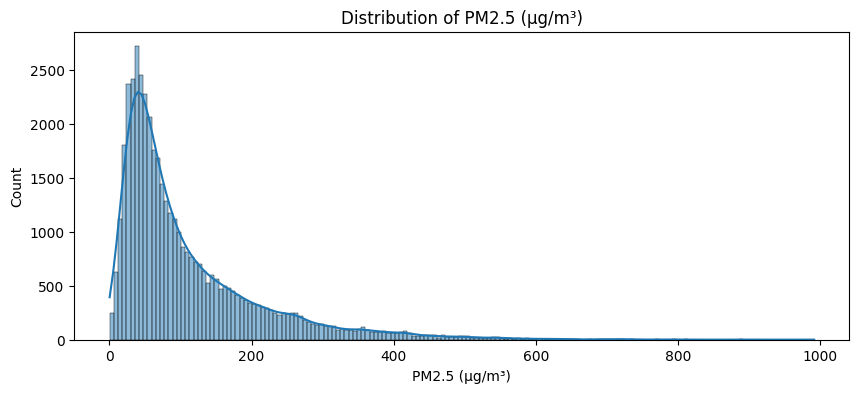

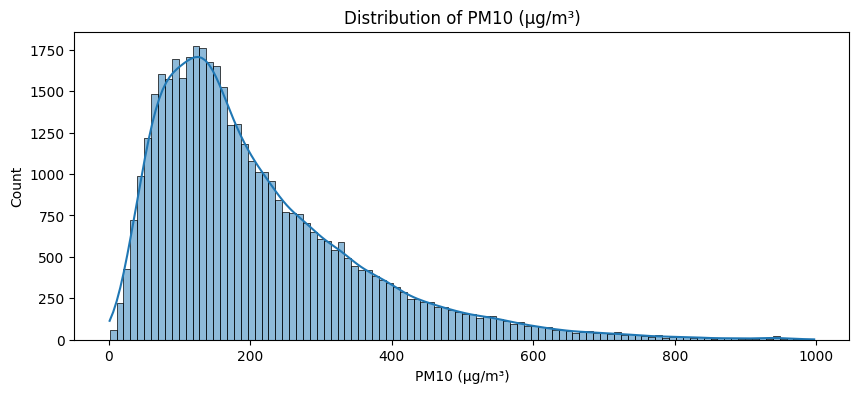

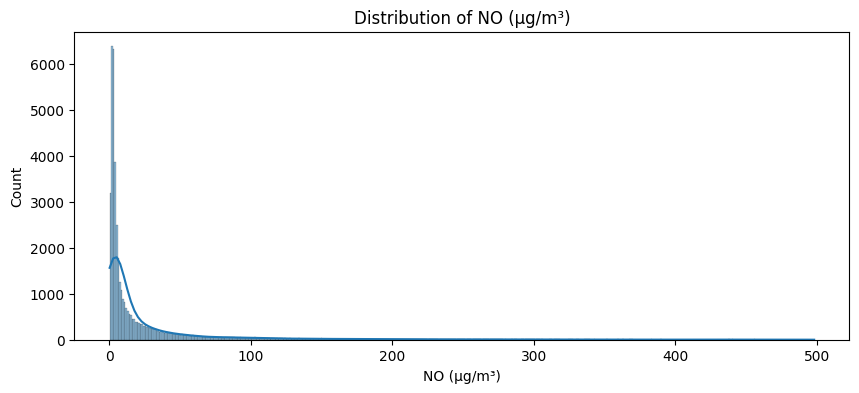

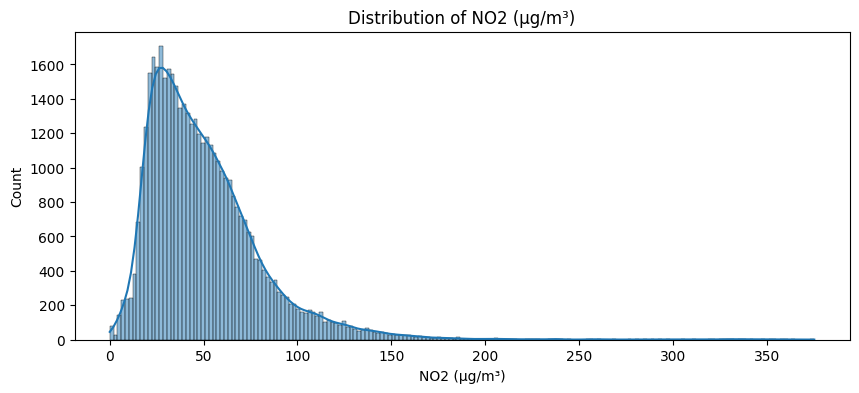

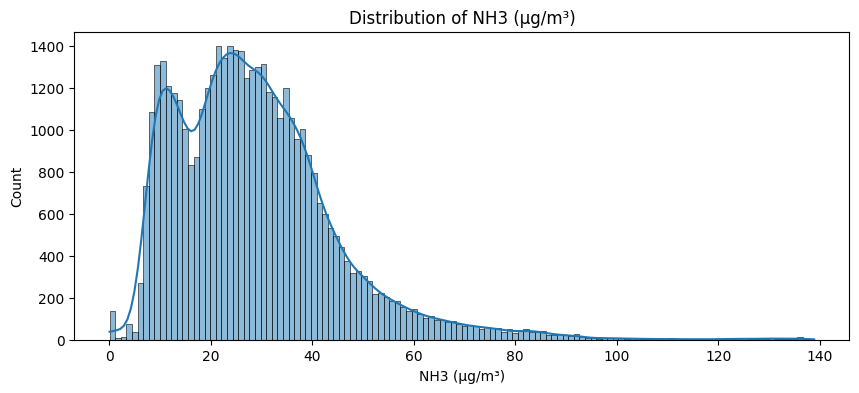

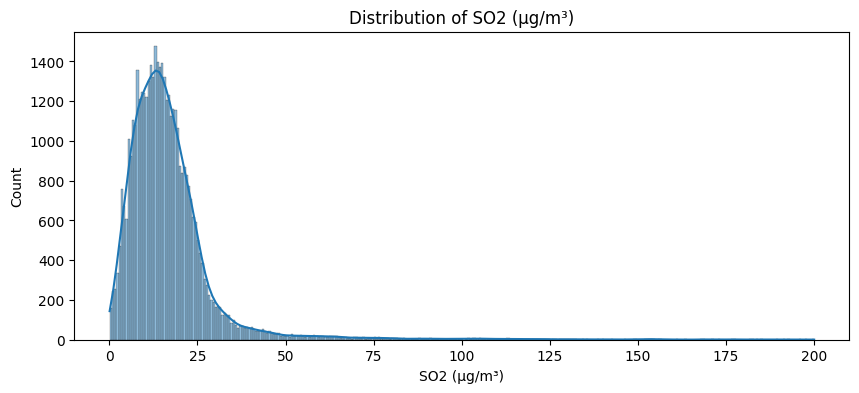

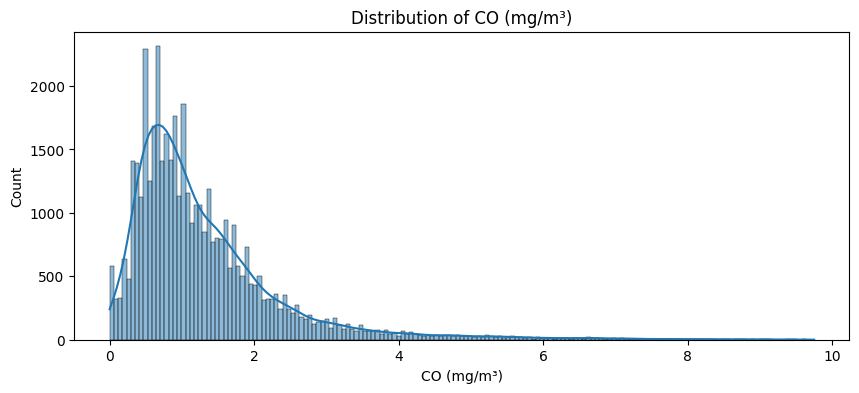

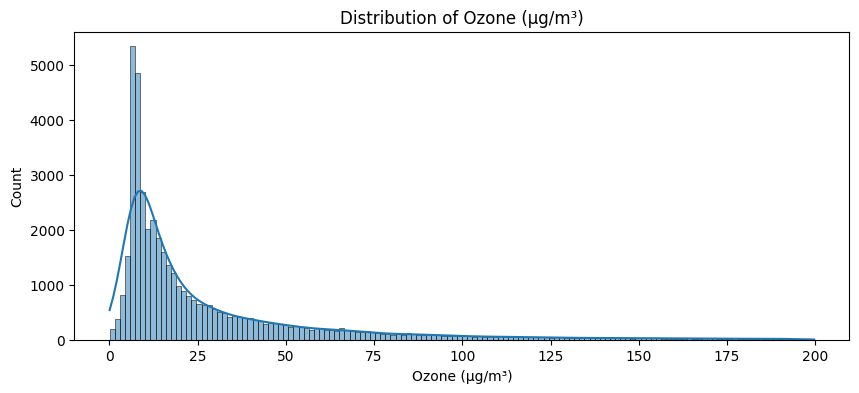

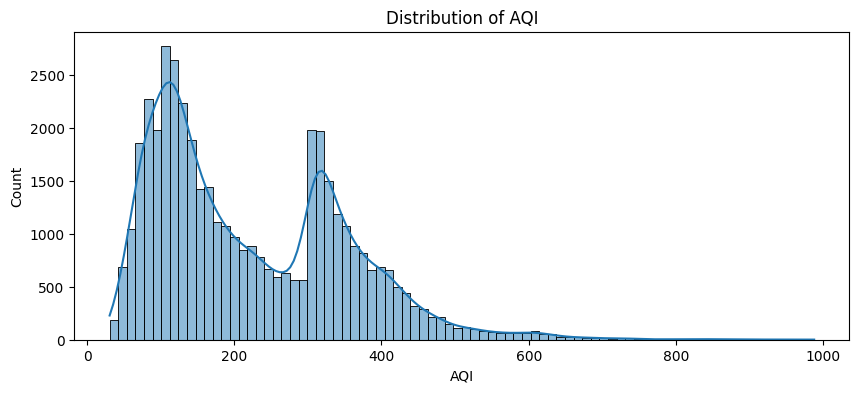

In [49]:
## Checking the Distribution of the pollutants
import matplotlib.pyplot as plt
import seaborn as sns

pollutants = ['PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'NO (µg/m³)', 'NO2 (µg/m³)', 'NH3 (µg/m³)', 'SO2 (µg/m³)', 'CO (mg/m³)', 'Ozone (µg/m³)','AQI']

for pollutant in pollutants:
    plt.figure(figsize=(10, 4))
   
    sns.histplot(data_transformed_1[pollutant], kde=True)
    plt.title(f'Distribution of {pollutant}')

    
    plt.show()


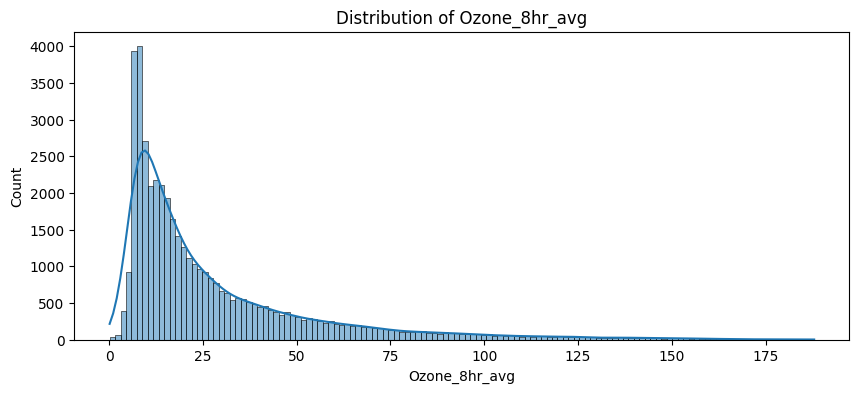

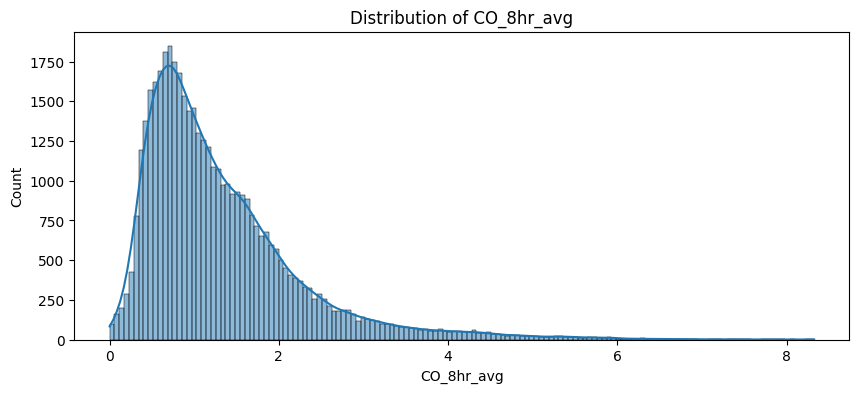

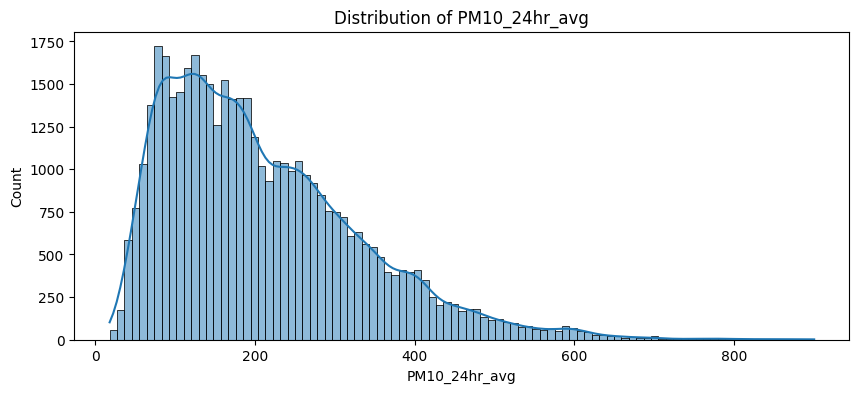

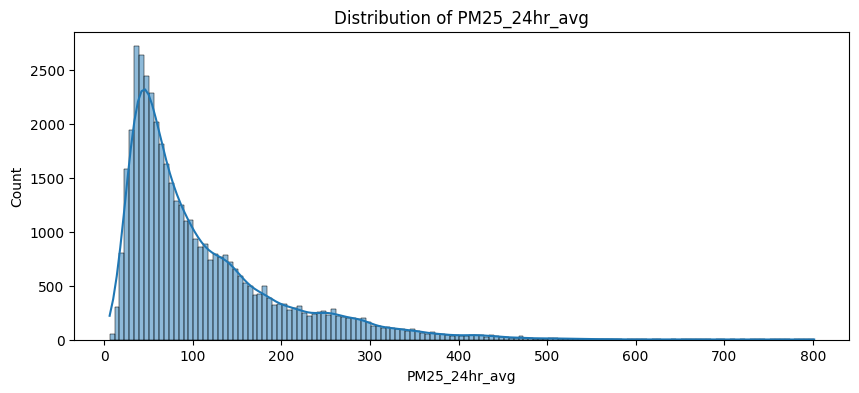

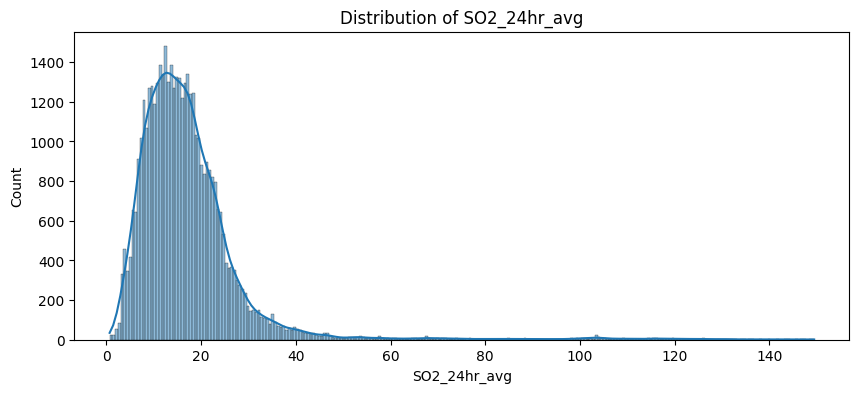

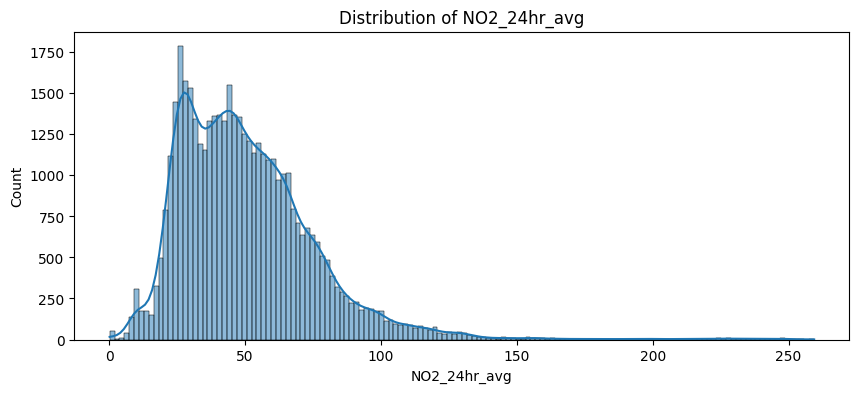

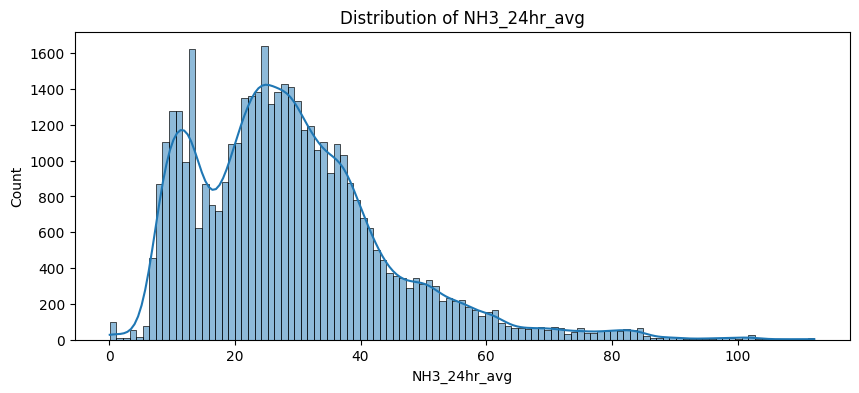

In [50]:
#### Distribution of averaged concentration of pollutants

import matplotlib.pyplot as plt
import seaborn as sns

pollutants_avg = ['Ozone_8hr_avg', 'CO_8hr_avg', 'PM10_24hr_avg', 'PM25_24hr_avg', 'SO2_24hr_avg', 'NO2_24hr_avg', 'NH3_24hr_avg']

for pollutant in pollutants_avg:
    plt.figure(figsize=(10, 4))
    
    # Histogram plot for each averaged pollutant concentration
    sns.histplot(data_transformed_1[pollutant], kde=True)
    plt.title(f'Distribution of {pollutant}')
    
    plt.show()


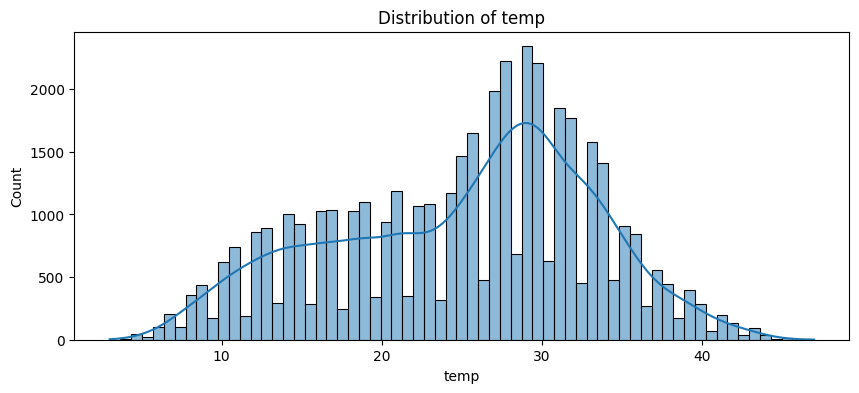

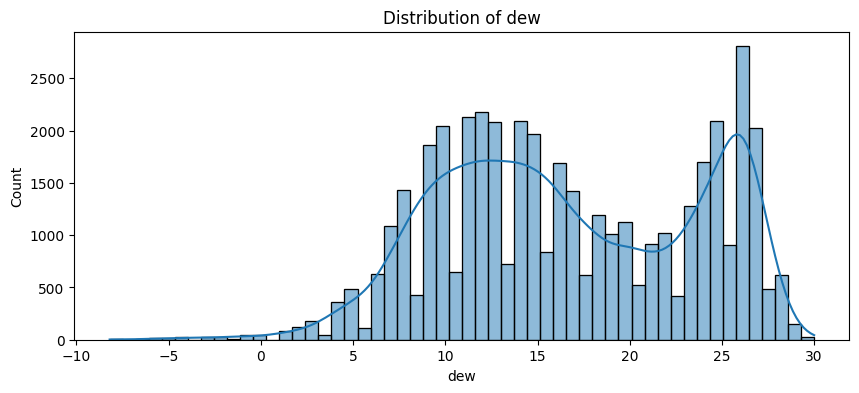

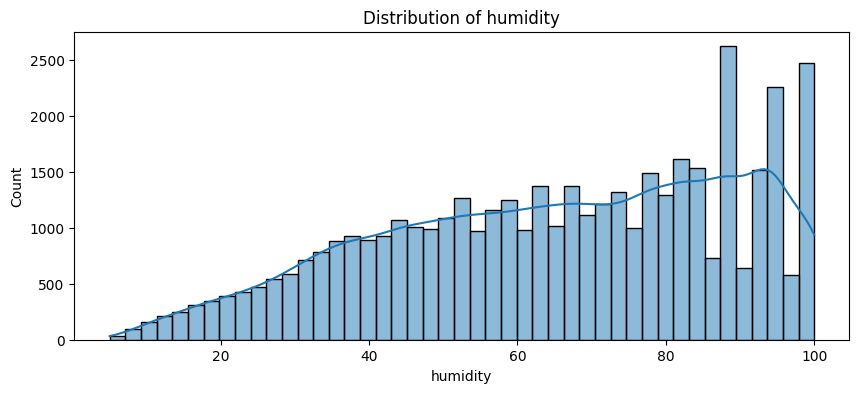

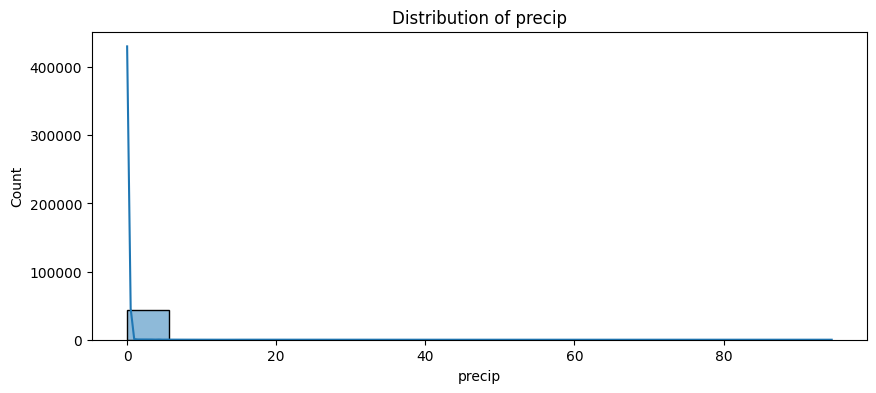

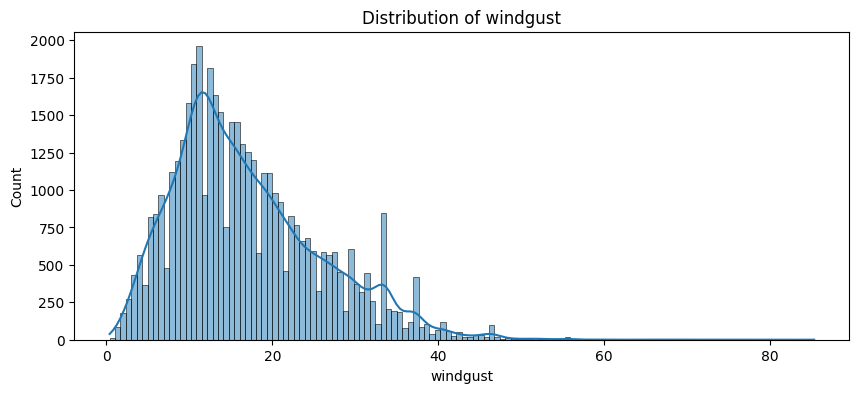

...

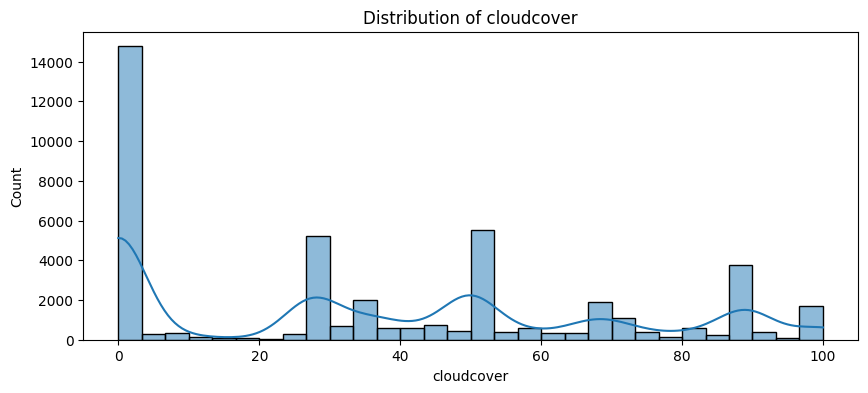

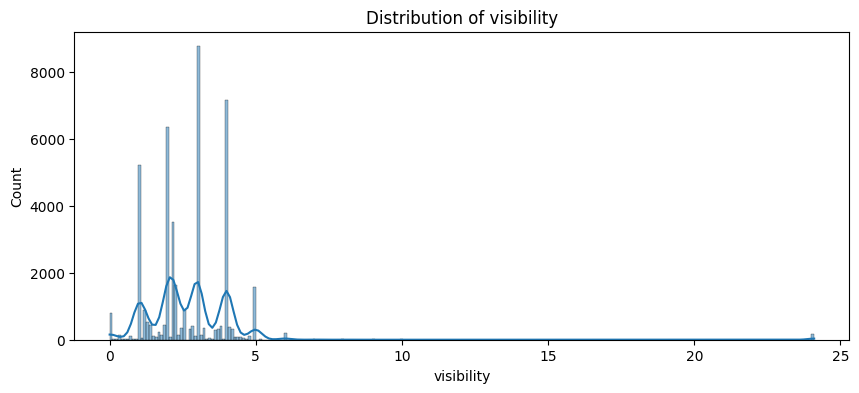

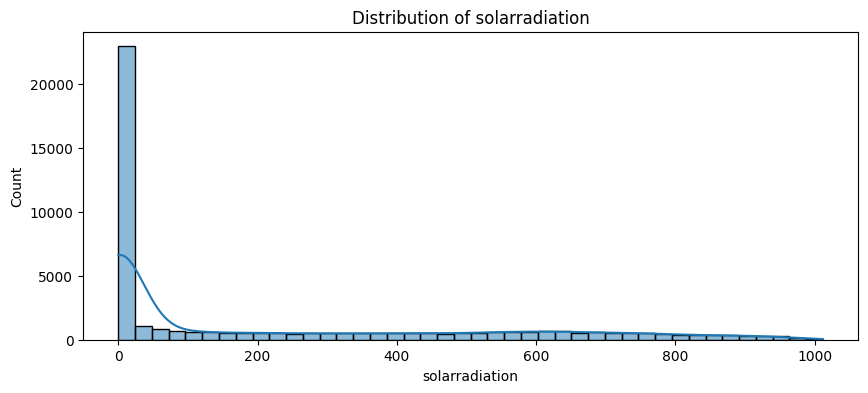

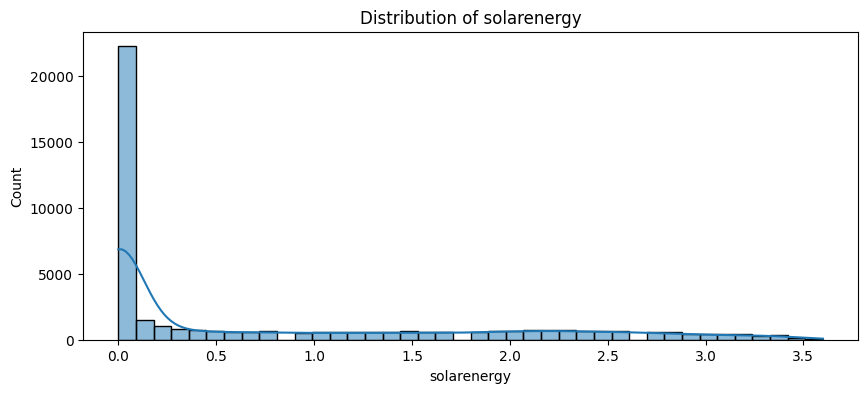

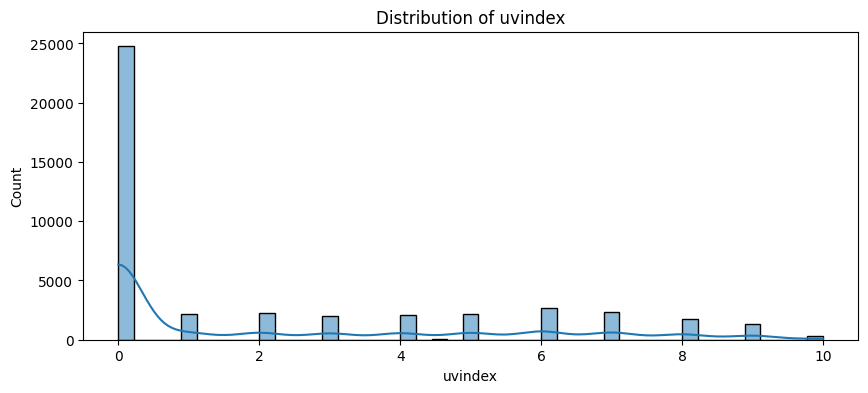

In [51]:
#### Distribution of weather conditions

import matplotlib.pyplot as plt
import seaborn as sns

pollutants_avg = ['temp', 'dew','humidity', 'precip','windgust','windspeed', 'winddir', 'sealevelpressure',
                 'cloudcover', 'visibility','solarradiation', 'solarenergy', 'uvindex']

for pollutant in pollutants_avg:
    plt.figure(figsize=(10, 4))
    
    # Histogram plot for each averaged pollutant concentration
    sns.histplot(data_transformed_1[pollutant], kde=True)
    plt.title(f'Distribution of {pollutant}')
    
    plt.show()


##### Temporal Analysis

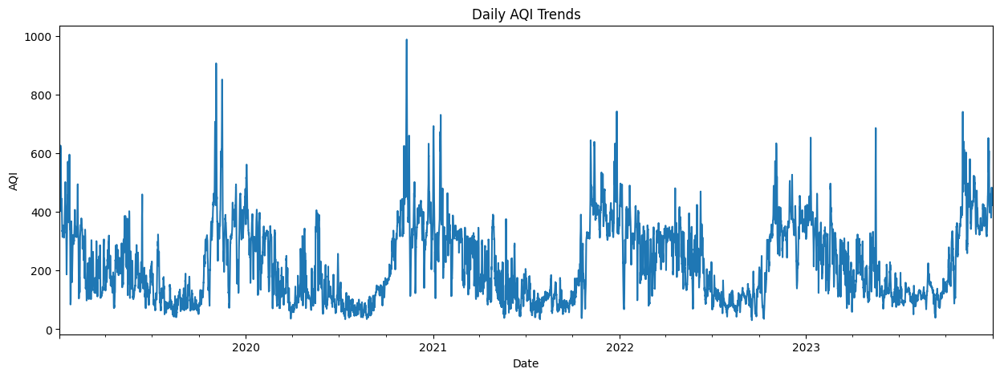

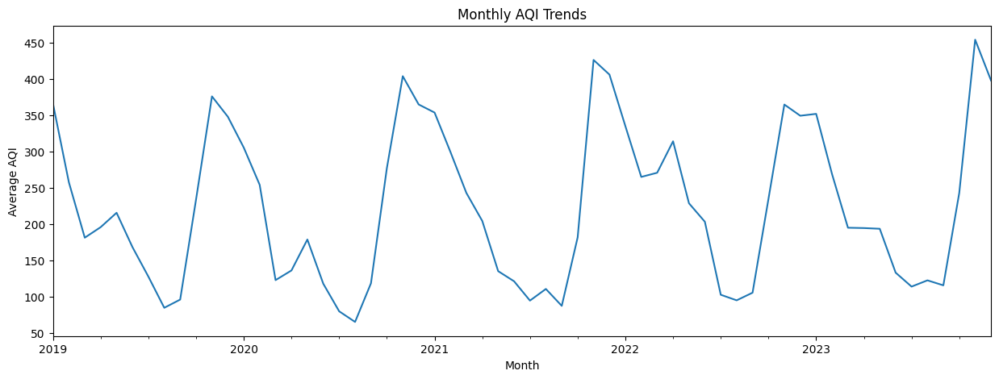

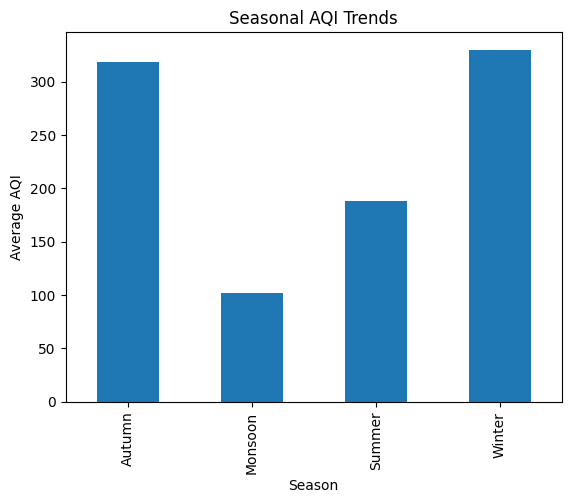

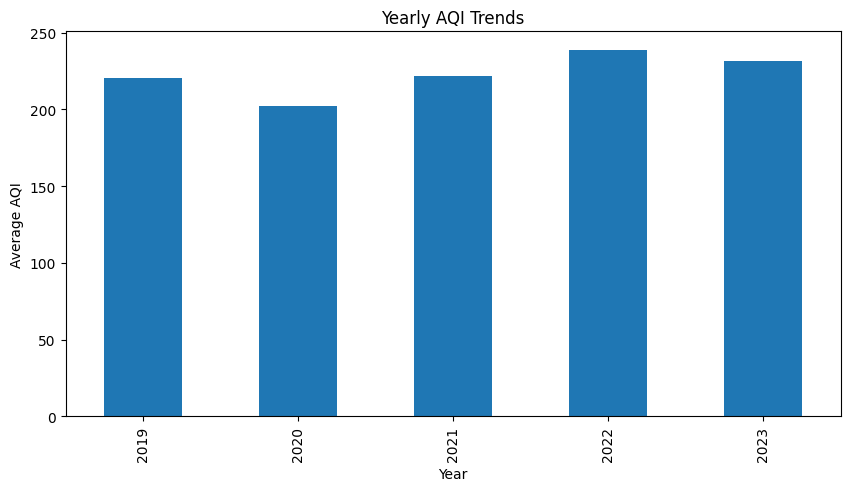

In [52]:
import pandas as pd
import matplotlib.pyplot as plt

# Daily AQI Trends
plt.figure(figsize=(15,5))
data_transformed_1['AQI'].plot(title='Daily AQI Trends')
plt.xlabel('Date')
plt.ylabel('AQI')
plt.show()

# Monthly Trends
monthly_aqi = data_transformed_1['AQI'].resample('M').mean()
plt.figure(figsize=(15,5))
monthly_aqi.plot(kind='line', title='Monthly AQI Trends')
plt.xlabel('Month')
plt.ylabel('Average AQI')
plt.show()

# Seasonal Trends
seasonal_aqi = data_transformed_1.groupby('Season')['AQI'].mean()
seasonal_aqi.plot(kind='bar', title='Seasonal AQI Trends')
plt.xlabel('Season')
plt.ylabel('Average AQI')
plt.show()

# Yearly Comparison

yearly_aqi = data_transformed_1.groupby('Year')['AQI'].mean()
plt.figure(figsize=(10,5))
yearly_aqi.plot(kind='bar', title='Yearly AQI Trends')
plt.xlabel('Year')
plt.ylabel('Average AQI')
plt.show()




In [53]:
data_transformed_2=data_transformed_1.copy()

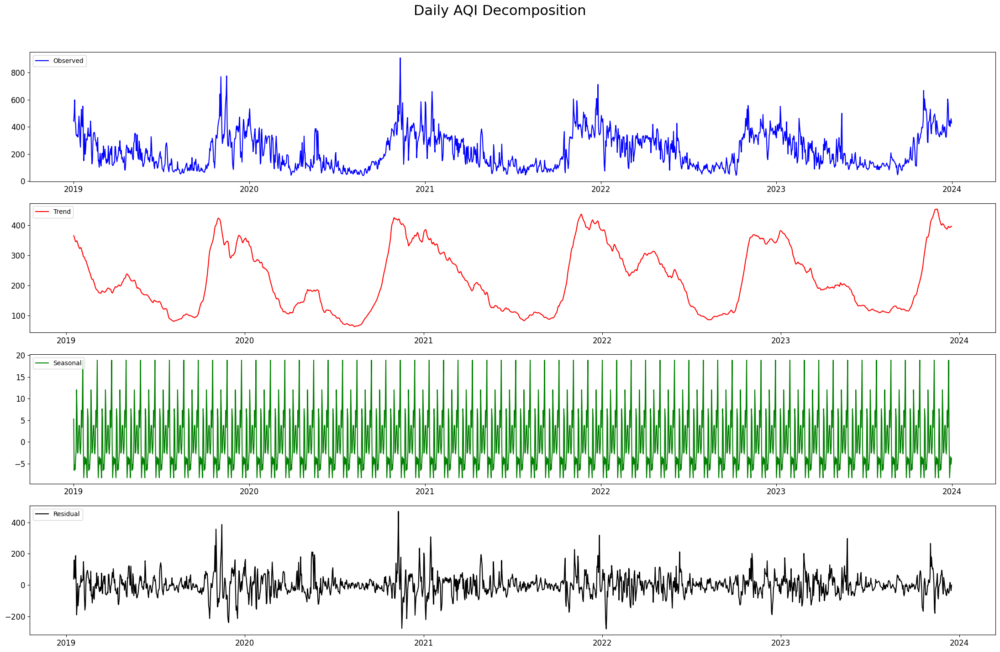

In [54]:
# Import necessary library for plotting time series of AQI
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
data_transformed_2['Date'] = pd.to_datetime(data_transformed_2['Date'])
data_transformed_2.set_index('Date', inplace=True)

# Aggregating to daily AQI
daily_aqi = data_transformed_2['AQI'].resample('D').mean()

# Apply seasonal decomposition
decomposition = seasonal_decompose(daily_aqi, model='additive', period=30)

# Plot the decomposed components of the time series
plt.figure(figsize=(22, 15)) 
plt.suptitle('Daily AQI Decomposition', fontsize=22) 

# Plot the observed values
plt.subplot(411)
plt.plot(decomposition.observed, label='Observed', color='blue')
plt.legend(loc='upper left')
plt.tick_params(axis='both', which='major', labelsize=12)

# Plot the trend component
plt.subplot(412)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend(loc='upper left')
plt.tick_params(axis='both', which='major', labelsize=12)

# Plot the seasonal component
plt.subplot(413)
plt.plot(decomposition.seasonal, label='Seasonal', color='green')
plt.legend(loc='upper left')
plt.tick_params(axis='both', which='major', labelsize=12)

# Plot the residual component
plt.subplot(414)
plt.plot(decomposition.resid, label='Residual', color='black')
plt.legend(loc='upper left')
plt.tick_params(axis='both', which='major', labelsize=12)

# Adjust the layout to ensure there is no overlap
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show the plot
plt.show()


In [55]:
### MONTHLY AQI

monthly_aqi = data_transformed_2.groupby(['Year', 'Month'])['AQI'].mean()

# To find the maximum AQI for each year and the corresponding month
yearly_max_aqi = monthly_aqi.groupby('Year').max()
max_aqi_months = monthly_aqi.groupby('Year').idxmax()

print("Monthly mean AQI:\n", monthly_aqi)
print("\nMaximum AQI for each year:\n", yearly_max_aqi)
print("\nMonths with the highest AQI for each year:\n", max_aqi_months)


Monthly mean AQI:
 Year  Month
2019  1        365.868402
      2        257.638978
      3        181.345731
      4        195.865463
      5        215.655047
      6        168.313267
      7        127.753354
      8         84.790317
      9         96.100404
      10       234.149244
      11       375.955651
      12       347.884311
2020  1        305.397338
      2        254.152069
      3        122.898594
      4        136.224236
      5        178.824408
      6        117.958138
      7         79.946034
      8         65.319421
      9        118.558746
      10       277.138683
      11       403.803579
      12       364.823599
2021  1        353.673503
      2        299.320500
      3        242.990420
      4        204.377954
      5        135.247891
      6        121.311247
      7         94.692717
      8        110.731552
      9         87.446317
      10       181.803916
      11       426.123442
      12       405.946079
2022  1        335.054046
      2

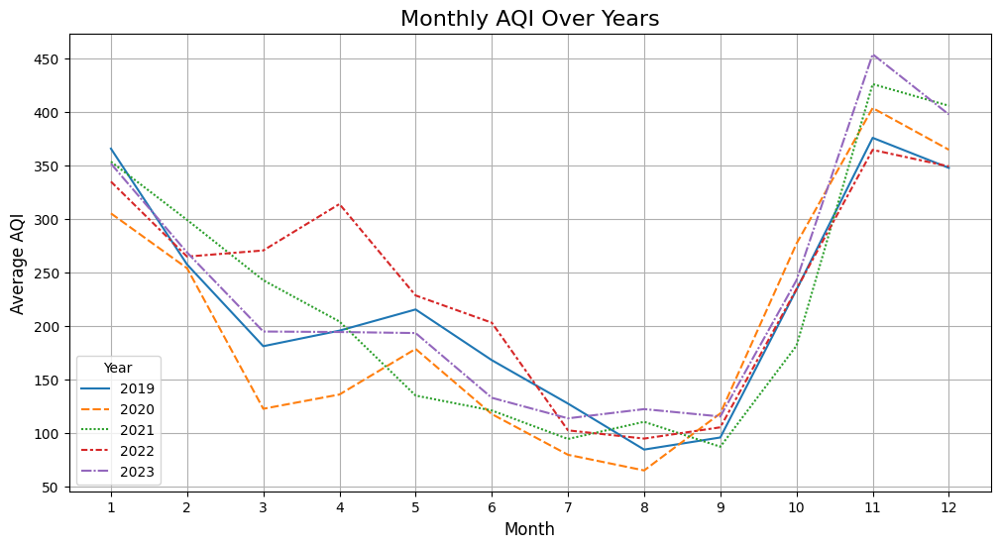

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pivot the data to have years as columns and months as rows
monthly_aqi_pivot = monthly_aqi.reset_index().pivot(index='Month', columns='Year', values='AQI')

# Plot the data
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_aqi_pivot)

# Customizing the plot
plt.title('Monthly AQI Over Years', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Average AQI', fontsize=12)
plt.xticks(range(1, 13))  # Set x-ticks to be the months
plt.legend(title='Year')
plt.grid(True)  # Add grid for better readability

# Show the plot
plt.show()


In [57]:
### SEASONS AND AQI

season_aqi = data_transformed_2.groupby(['Year', 'Season'])['AQI'].mean()

# To find the maximum AQI for each year and the corresponding month
season_yearly_max_aqi = season_aqi.groupby('Year').max()
max_aqi_season = season_aqi.groupby('Year').idxmax()

print("Monthly mean AQI:\n", season_aqi)
print("\nMaximum AQI for each year:\n", season_yearly_max_aqi)
print("\nMonths with the highest AQI for each year:\n", max_aqi_season)



Monthly mean AQI:
 Year  Season 
2019  Autumn     303.890100
      Monsoon    102.955064
      Summer     190.429393
      Winter     325.723723
2020  Autumn     339.432894
      Monsoon     87.608603
      Summer     139.171183
      Winter     309.310539
2021  Autumn     301.961060
      Monsoon     97.734151
      Summer     176.197243
      Winter     354.768678
2022  Autumn     298.630010
      Monsoon    101.078917
      Summer     254.152544
      Winter     318.171432
2023  Autumn     346.767802
      Monsoon    117.439570
      Summer     179.361101
      Winter     341.863902
Name: AQI, dtype: float64

Maximum AQI for each year:
 Year
2019    325.723723
2020    339.432894
2021    354.768678
2022    318.171432
2023    346.767802
Name: AQI, dtype: float64

Months with the highest AQI for each year:
 Year
2019    (2019, Winter)
2020    (2020, Autumn)
2021    (2021, Winter)
2022    (2022, Winter)
2023    (2023, Autumn)
Name: AQI, dtype: object


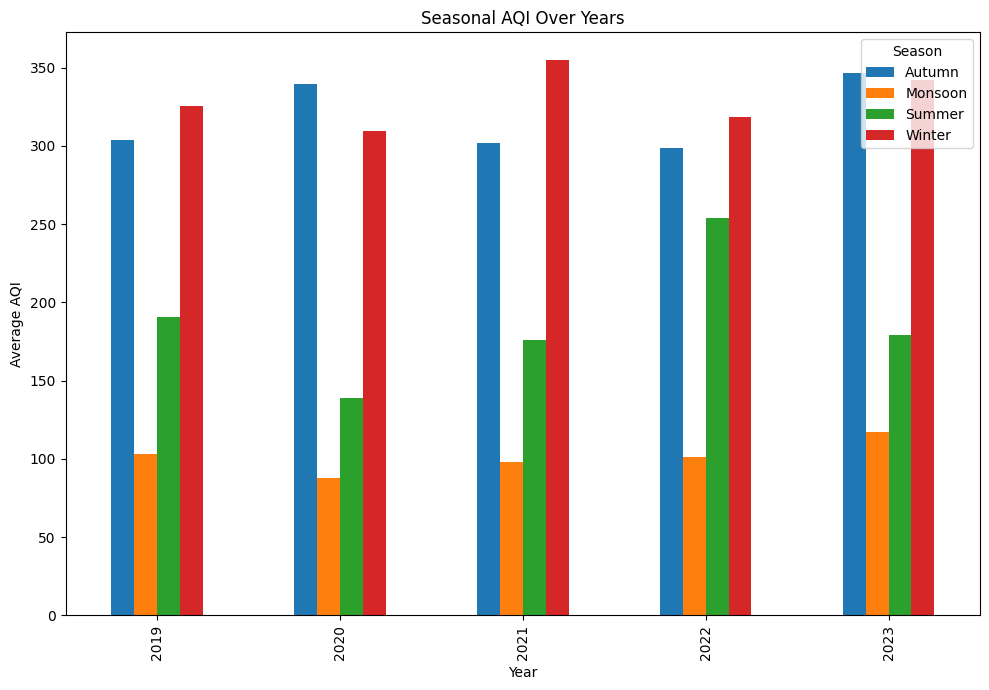

In [58]:
import matplotlib.pyplot as plt
import pandas as pd

# Pivoting to have years as the index, seasons as the columns, and AQI as the values
season_aqi_pivot = season_aqi.reset_index().pivot(index='Year', columns='Season', values='AQI')

# Plotting the data
season_aqi_pivot.plot(kind='bar', figsize=(10, 7))

# Customising the plot
plt.title('Seasonal AQI Over Years')
plt.ylabel('Average AQI')
plt.xlabel('Year')
plt.legend(title='Season')
plt.tight_layout()  

# Show the plot
plt.show()



In [59]:
### SEASONS AND AQI

dominantpollutant_aqi = data_transformed_2.groupby(['Year', 'Dominant_Pollutant'])['Dominant_Pollutant'].count()

# To find the maximum AQI for each year and the corresponding month
max_aqi_dominantpollutant = dominantpollutant_aqi.groupby('Year').idxmax()

print("Dominant Pollutant for AQI:\n", dominantpollutant_aqi)
print("\nMonths with the highest AQI for each year:\n", max_aqi_dominantpollutant)

Dominant Pollutant for AQI:
 Year  Dominant_Pollutant
2019  CO                     635
      NO2                     44
      O3                       5
      PM10                  4282
      PM2.5                 3767
      SO2                     12
2020  CO                     394
      NO2                    133
      O3                      90
      PM10                  4059
      PM2.5                 3836
      SO2                    272
2021  CO                     160
      NO2                      6
      O3                     518
      PM10                  3737
      PM2.5                 4339
2022  CO                      13
      NO2                      2
      O3                      44
      PM10                  3819
      PM2.5                 4882
2023  CO                     486
      NO2                     92
      O3                       3
      PM10                  4138
      PM2.5                 4041
Name: Dominant_Pollutant, dtype: int64

Months with the

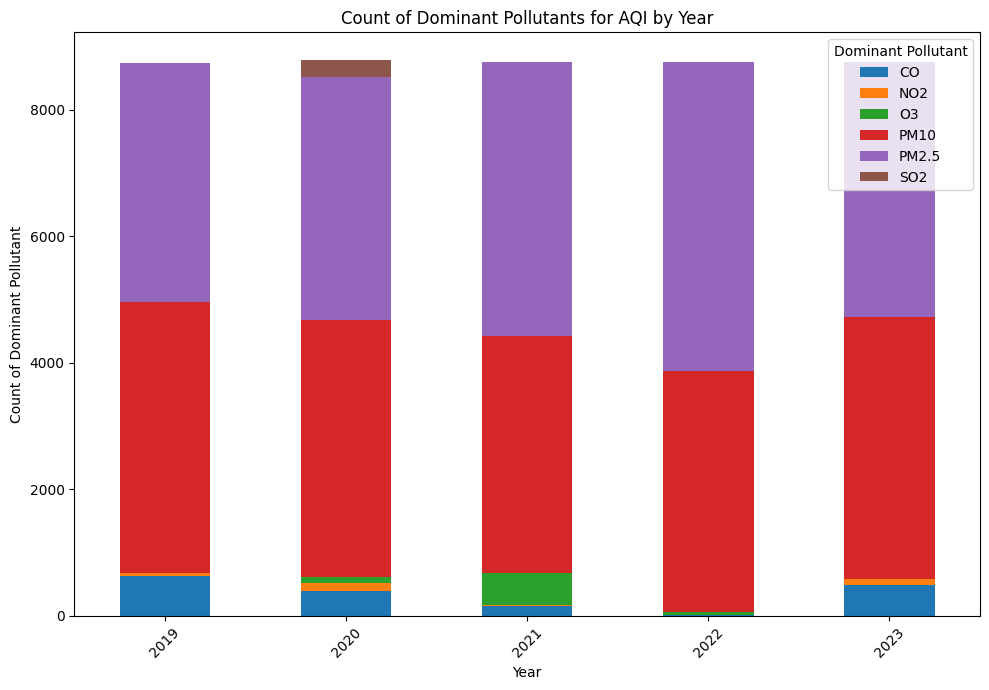

In [60]:
import matplotlib.pyplot as plt

# Create a DataFrame from your grouped data if it's not already in that form
dominant_pollutant_df = dominantpollutant_aqi.reset_index(name='Count')

# Pivot your data to get 'Year' as index and each 'Dominant_Pollutant' as a column
pollutant_pivot = dominant_pollutant_df.pivot(index='Year', columns='Dominant_Pollutant', values='Count')

# Plotting
pollutant_pivot.plot(kind='bar', stacked=True, figsize=(10, 7))

plt.title('Count of Dominant Pollutants for AQI by Year')
plt.xlabel('Year')
plt.ylabel('Count of Dominant Pollutant')
plt.legend(title='Dominant Pollutant')
plt.xticks(rotation=45)
plt.tight_layout()

# Show plot
plt.show()


##### AQI COMPARISON AS A RESULT OF EVENT, COVID A CASE STUDY

In [61]:
'''# Defining the COVID-related periods

pre_covid_end = '2020-03-25'
post_covid_start = '2021-07-01'

# Segment the data
pre_covid = data_transformed[data_transformed.index <= pre_covid_end]
during_covid = data_transformed[(data_transformed.index > pre_covid_end) & (data_transformed.index < post_covid_start)]
post_covid = data_transformed[data_transformed.index >= post_covid_start]

# Calculate average AQI for each period
avg_aqi_pre_covid = pre_covid['AQI'].mean()
avg_aqi_during_covid = during_covid['AQI'].mean()
avg_aqi_post_covid = post_covid['AQI'].mean()

# Prepare the data for plotting
periods = ['Pre-COVID', 'During COVID', 'Post-COVID']
avg_aqis = [avg_aqi_pre_covid, avg_aqi_during_covid, avg_aqi_post_covid]

# Create a bar plot
plt.figure(figsize=(10, 5))
plt.bar(periods, avg_aqis, color=['green', 'red', 'blue'])
plt.title('Average AQI During Different COVID-19 Periods')
plt.xlabel('Period')
plt.ylabel('Average AQI')
plt.ylim(0, max(avg_aqis) + 10)  # Extend y-axis limit for better visualization

# Annotate the bars with the AQI values
for i, v in enumerate(avg_aqis):
    plt.text(i, v + 2, f"{v:.2f}", ha='center', color='black')

plt.tight_layout()
plt.show()'''


'# Defining the COVID-related periods\n\npre_covid_end = \'2020-03-25\'\npost_covid_start = \'2021-07-01\'\n\n# Segment the data\npre_covid = data_transformed[data_transformed.index <= pre_covid_end]\nduring_covid = data_transformed[(data_transformed.index > pre_covid_end) & (data_transformed.index < post_covid_start)]\npost_covid = data_transformed[data_transformed.index >= post_covid_start]\n\n# Calculate average AQI for each period\navg_aqi_pre_covid = pre_covid[\'AQI\'].mean()\navg_aqi_during_covid = during_covid[\'AQI\'].mean()\navg_aqi_post_covid = post_covid[\'AQI\'].mean()\n\n# Prepare the data for plotting\nperiods = [\'Pre-COVID\', \'During COVID\', \'Post-COVID\']\navg_aqis = [avg_aqi_pre_covid, avg_aqi_during_covid, avg_aqi_post_covid]\n\n# Create a bar plot\nplt.figure(figsize=(10, 5))\nplt.bar(periods, avg_aqis, color=[\'green\', \'red\', \'blue\'])\nplt.title(\'Average AQI During Different COVID-19 Periods\')\nplt.xlabel(\'Period\')\nplt.ylabel(\'Average AQI\')\nplt.ylim

##### DATA REDUCTION

In [62]:
data_df=data_transformed_1.drop(columns=['NO (µg/m³)','NOx (ppb)','feelslike','conditions', 'icon','Date', 'Time','DayName',
                                         'precip', 'precipprob', 'snow', 'snowdepth','Season',  'Hour','Season_Ordinal',
                                         'Ozone (µg/m³)', 'CO (mg/m³)', 'PM10 (µg/m³)', 'PM2.5 (µg/m³)','SO2 (µg/m³)', 
                                         'NO2 (µg/m³)', 'NH3 (µg/m³)', 'PM10_subindex','PM2.5_subindex','SO2_subindex',
                                         'NH3_SubIndex', 'CO_SubIndex', 'O3_SubIndex', 'NO2_SubIndex', 'Dominant_Pollutant'])

In [63]:
data_df.head()

,temp,dew,humidity,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,...,Season_Cos,Ozone_8hr_avg,CO_8hr_avg,PM10_24hr_avg,PM25_24hr_avg,SO2_24hr_avg,NO2_24hr_avg,NH3_24hr_avg,AQI,AQI_Category
Timestamp,,,,,,,,,,,,,,,,,,,,,
2019-01-01 15:00:00,21.0,5.0,35.12,19.4,9.4,300.0,1018.0,27.2,3.0,507.4,...,1.0,36.81375,1.26625,461.328125,327.109375,20.843750,42.442500,41.997500,459.314904,Severe
2019-01-01 16:00:00,21.0,5.0,35.12,17.6,7.6,280.0,1018.0,27.2,3.0,368.7,...,1.0,40.38500,1.10125,447.823529,314.205882,20.731176,41.987059,41.615294,449.389140,Severe
2019-01-01 17:00:00,19.8,10.2,54.07,14.4,0.0,359.0,1018.3,25.6,2.2,228.4,...,1.0,40.57500,1.00750,435.708333,302.569444,20.631111,41.965556,41.335000,440.438034,Severe
2019-01-01 18:00:00,17.0,6.0,48.31,5.8,0.0,0.0,1019.0,0.0,3.0,68.4,...,1.0,39.79375,1.20125,429.526316,295.065789,20.554211,42.832105,41.204211,434.665992,Severe
2019-01-01 19:00:00,15.0,6.0,54.88,6.1,0.0,0.0,1019.0,0.0,3.0,0.0,...,1.0,36.47125,1.71375,430.012500,292.087500,20.625500,45.400500,41.222500,432.375000,Severe


In [64]:
# Convert all boolean columns to binary (0 and 1)
bool_cols = [col for col in data_df.columns if data_df[col].dtype == 'bool']
data_df[bool_cols] = data_df[bool_cols].astype(int)

# Create a mapping for the AQI_Category column
category_mapping = {
    'Good': 1,
    'Satisfactory': 2,
    'Moderate': 3,
    'Poor': 4,
    'Very Poor': 5,
    'Severe': 6
}

# Apply the mapping to the AQI_Category column
data_df['AQI_Encoded'] = data_df['AQI_Category'].map(category_mapping)


In [65]:
data_df.shape

(43809, 44)

In [66]:
data_df.columns

Index(['temp', 'dew', 'humidity', 'windgust', 'windspeed', 'winddir',
       'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation',
       'solarenergy', 'uvindex', 'Day', 'Month', 'Year', 'DayOfWeek',
       'icon_clear-day', 'icon_clear-night', 'icon_cloudy', 'icon_fog',
       'icon_partly-cloudy-day', 'icon_partly-cloudy-night', 'icon_rain',
       'icon_wind', 'condition_Clear', 'condition_Overcast',
       'condition_Partially cloudy', 'condition_Rain',
       'condition_Rain, Overcast', 'condition_Rain, Partially cloudy',
       'Hour_sin', 'Hour_cos', 'Season_Sin', 'Season_Cos', 'Ozone_8hr_avg',
       'CO_8hr_avg', 'PM10_24hr_avg', 'PM25_24hr_avg', 'SO2_24hr_avg',
       'NO2_24hr_avg', 'NH3_24hr_avg', 'AQI', 'AQI_Category', 'AQI_Encoded'],
      dtype='object')

In [67]:
data_df.isna().sum()

temp                                0
dew                                 0
humidity                            0
windgust                            0
windspeed                           0
winddir                             0
sealevelpressure                    0
cloudcover                          0
visibility                          0
solarradiation                      0
solarenergy                         0
uvindex                             0
Day                                 0
Month                               0
Year                                0
DayOfWeek                           0
icon_clear-day                      0
icon_clear-night                    0
icon_cloudy                         0
icon_fog                            0
icon_partly-cloudy-day              0
icon_partly-cloudy-night            0
icon_rain                           0
icon_wind                           0
condition_Clear                     0
condition_Overcast                  0
condition_Pa

In [68]:
data_df.to_csv('new_delhi.csv')

##### PREDICTING AQI USING MACHINE LEARNING

In [69]:
data_df['AQI_Category'].value_counts()

AQI_Category
Moderate        15287
Very Poor       10499
Satisfactory     7252
Poor             6010
Severe           4171
Good              590
Name: count, dtype: int64

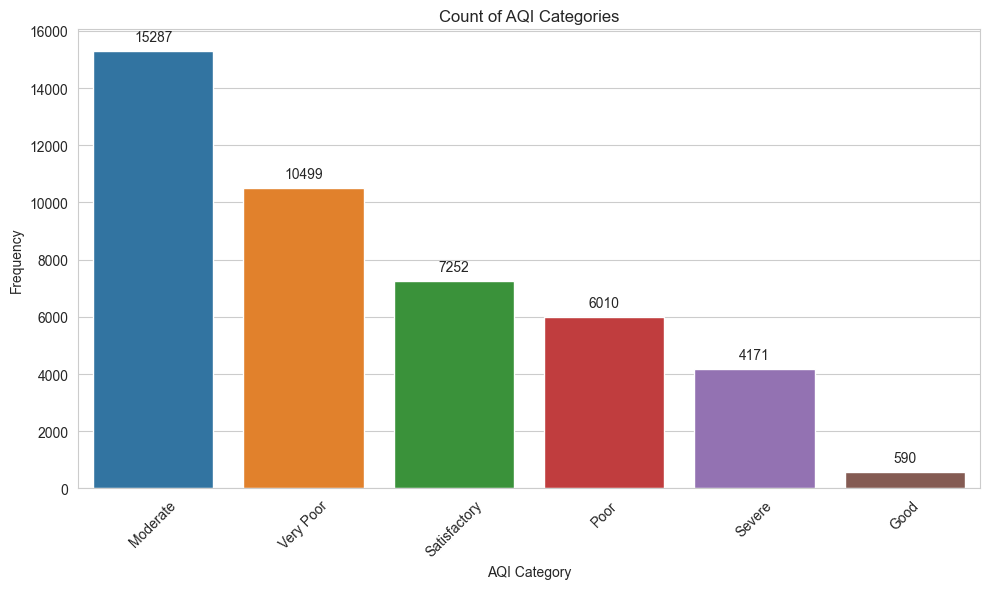

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('whitegrid')

plt.figure(figsize=(10, 6))
ax = sns.countplot(x='AQI_Category', data=data_df, order = data_df['AQI_Category'].value_counts().index)
ax.set_title('Count of AQI Categories')
ax.set_xlabel('AQI Category')
ax.set_ylabel('Frequency')
# Annotate each bar with the count value
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
# Show the plot
plt.xticks(rotation=45)  
plt.tight_layout()  
plt.show()


#### FEATURE SELECTION

In [71]:
data_df_1 = data_df.drop(columns=['AQI_Category','AQI_Encoded'], axis=1)
corr_matrix = data_df_1.corr()
corr_matrix

,temp,dew,humidity,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,...,Season_Sin,Season_Cos,Ozone_8hr_avg,CO_8hr_avg,PM10_24hr_avg,PM25_24hr_avg,SO2_24hr_avg,NO2_24hr_avg,NH3_24hr_avg,AQI
temp,1.000000,0.515141,-0.604534,0.262997,0.344791,0.117318,-0.788662,0.158921,0.456412,0.471206,...,0.319137,-0.661817,0.276493,-0.312825,-0.353203,-0.508113,0.119329,-0.408865,-0.353437,-0.497953
dew,0.515141,1.000000,0.330484,0.046637,0.070396,-0.173774,-0.688660,0.486292,0.127552,-0.043110,...,-0.028829,-0.773032,-0.046250,-0.197746,-0.545925,-0.519881,-0.055846,-0.500760,-0.319638,-0.612318
humidity,-0.604534,0.330484,1.000000,-0.232302,-0.304593,-0.291005,0.195106,0.307957,-0.384200,-0.553080,...,-0.339146,0.003947,-0.349977,0.164140,-0.117332,0.072147,-0.175991,-0.018043,0.079398,-0.022540
windgust,0.262997,0.046637,-0.232302,1.000000,0.611847,0.221455,-0.218212,0.137334,0.142534,0.323969,...,0.209121,-0.085765,0.169744,-0.202119,-0.214741,-0.251800,0.061410,-0.146225,-0.011615,-0.230159
windspeed,0.344791,0.070396,-0.304593,0.611847,1.000000,0.436577,-0.224032,0.179722,0.224047,0.452921,...,0.223713,-0.118538,0.143857,-0.289330,-0.242944,-0.276625,0.040689,-0.210126,-0.075626,-0.259403
winddir,0.117318,-0.173774,-0.291005,0.221455,0.436577,1.000000,0.044548,-0.106250,0.079565,0.319148,...,0.084202,0.084395,0.104604,-0.224756,-0.030345,-0.054342,0.000419,-0.061405,0.001061,-0.013809
sealevelpressure,-0.788662,-0.688660,0.195106,-0.218212,-0.224032,0.044548,1.000000,-0.351086,-0.332482,-0.110345,...,-0.334699,0.726116,-0.122884,0.228711,0.486921,0.594359,-0.057028,0.496094,0.365669,0.612812
cloudcover,0.158921,0.486292,0.307957,0.137334,0.179722,-0.106250,-0.351086,1.000000,0.023671,-0.031590,...,0.093935,-0.365025,-0.094107,-0.177430,-0.369342,-0.298018,-0.032114,-0.287500,-0.150814,-0.375443
visibility,0.456412,0.127552,-0.384200,0.142534,0.224047,0.079565,-0.332482,0.023671,1.000000,0.208260,...,0.170411,-0.304562,0.134068,-0.187772,-0.281964,-0.348048,0.073745,-0.242541,-0.233924,-0.337924
solarradiation,0.471206,-0.043110,-0.553080,0.323969,0.452921,0.319148,-0.110345,-0.031590,0.208260,1.000000,...,0.124050,-0.049705,0.239539,-0.179466,-0.031453,-0.072849,0.049440,-0.043579,-0.046861,-0.056810


In [72]:
import pandas as pd

# Extract the absolute correlation values of features with AQI
correlation_with_AQI = corr_matrix['AQI'].abs()

# Sort the correlation values in descending order
sorted_correlation = correlation_with_AQI.sort_values(ascending=False)

# Select the top features with highest absolute correlation with AQI
top_features = sorted_correlation[1:22]  # Excluding AQI itself

# Print the selected top features
print("Top 22 Features based on correlation with AQI:")
print(top_features)


Top 22 Features based on correlation with AQI:
PM10_24hr_avg                 0.948466
PM25_24hr_avg                 0.947264
Season_Cos                    0.615800
NO2_24hr_avg                  0.614081
sealevelpressure              0.612812
dew                           0.612318
temp                          0.497953
NH3_24hr_avg                  0.382364
cloudcover                    0.375443
condition_Clear               0.369007
CO_8hr_avg                    0.363707
visibility                    0.337924
condition_Partially cloudy    0.324734
Season_Sin                    0.306085
windspeed                     0.259403
icon_clear-night              0.256516
windgust                      0.230159
icon_partly-cloudy-day        0.216134
icon_clear-day                0.194872
icon_partly-cloudy-night      0.147967
icon_fog                      0.119482
Name: AQI, dtype: float64


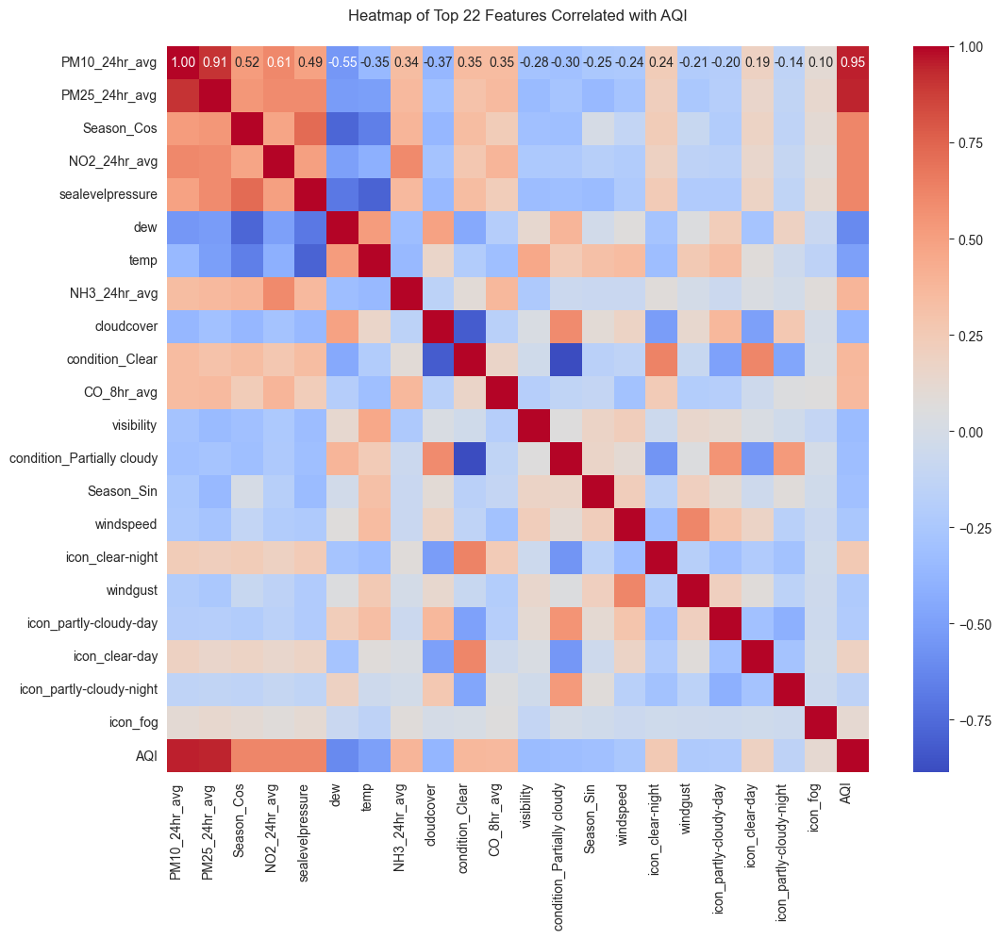

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming `data_df` is your DataFrame and it contains all the necessary columns
# First, select only the columns of interest based on the top features plus the target variable 'AQI'
columns_of_interest = top_features.index.tolist() + ['AQI']
data_of_interest = data_df[columns_of_interest]

# Calculate the correlation matrix for these columns
correlation_matrix = data_of_interest.corr()

# Plot the heatmap
plt.figure(figsize=(12, 10))  # You can adjust the figure size as needed
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Heatmap of Top 22 Features Correlated with AQI', pad=20)
plt.xticks(rotation=90, ha='right')
plt.yticks(rotation=0)
plt.show()


In [74]:
X = data_df.drop(columns=['AQI','AQI_Category','AQI_Encoded'], axis=1)  # Features
y = data_df['AQI']  # Target variable

In [75]:
from sklearn.feature_selection import SelectKBest, f_regression

k_best_selector = SelectKBest(score_func=f_regression, k=17) 

# Fit SelectKBest to the data
k_best_selector.fit(X, y)

# Get the selected features
selected_features_indices = k_best_selector.get_support(indices=True)
selected_features_kbest = X.columns[selected_features_indices]

# Print selected features
print("Selected Features using SelectKBest:", selected_features_kbest)

Selected Features using SelectKBest: Index(['temp', 'dew', 'windgust', 'windspeed', 'sealevelpressure',
       'cloudcover', 'visibility', 'icon_clear-night', 'condition_Clear',
       'condition_Partially cloudy', 'Season_Sin', 'Season_Cos', 'CO_8hr_avg',
       'PM10_24hr_avg', 'PM25_24hr_avg', 'NO2_24hr_avg', 'NH3_24hr_avg'],
      dtype='object')


In [76]:
selected_features=['PM25_24hr_avg', 'PM10_24hr_avg', 'NO2_24hr_avg', 'NH3_24hr_avg','SO2_24hr_avg', 'CO_8hr_avg', 
                   'temp', 'dew', 'windgust', 'windspeed','sealevelpressure', 'cloudcover', 'visibility', 
                   'Season_Sin', 'Season_Cos', 'Hour_sin', 'Hour_cos','Ozone_8hr_avg']

In [77]:
X=X[selected_features]
X.head()

,PM25_24hr_avg,PM10_24hr_avg,NO2_24hr_avg,NH3_24hr_avg,SO2_24hr_avg,CO_8hr_avg,temp,dew,windgust,windspeed,sealevelpressure,cloudcover,visibility,Season_Sin,Season_Cos,Hour_sin,Hour_cos,Ozone_8hr_avg
Timestamp,,,,,,,,,,,,,,,,,,
2019-01-01 15:00:00,327.109375,461.328125,42.442500,41.997500,20.843750,1.26625,21.0,5.0,19.4,9.4,1018.0,27.2,3.0,0.0,1.0,-0.707107,-7.071068e-01,36.81375
2019-01-01 16:00:00,314.205882,447.823529,41.987059,41.615294,20.731176,1.10125,21.0,5.0,17.6,7.6,1018.0,27.2,3.0,0.0,1.0,-0.866025,-5.000000e-01,40.38500
2019-01-01 17:00:00,302.569444,435.708333,41.965556,41.335000,20.631111,1.00750,19.8,10.2,14.4,0.0,1018.3,25.6,2.2,0.0,1.0,-0.965926,-2.588190e-01,40.57500
2019-01-01 18:00:00,295.065789,429.526316,42.832105,41.204211,20.554211,1.20125,17.0,6.0,5.8,0.0,1019.0,0.0,3.0,0.0,1.0,-1.000000,-1.836970e-16,39.79375
2019-01-01 19:00:00,292.087500,430.012500,45.400500,41.222500,20.625500,1.71375,15.0,6.0,6.1,0.0,1019.0,0.0,3.0,0.0,1.0,-0.965926,2.588190e-01,36.47125


In [78]:
'''X_transformed = X.copy()
from sklearn.preprocessing import power_transform
skewed_features = ['PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'NO2 (µg/m³)', 'NH3 (µg/m³)', 'SO2 (µg/m³)', 'CO (mg/m³)']
# Apply a power transformation (Yeo-Johnson)
X_transformed[skewed_features] = power_transform(X[skewed_features], method='yeo-johnson')
'''

"X_transformed = X.copy()\nfrom sklearn.preprocessing import power_transform\nskewed_features = ['PM2.5 (µg/m³)', 'PM10 (µg/m³)', 'NO2 (µg/m³)', 'NH3 (µg/m³)', 'SO2 (µg/m³)', 'CO (mg/m³)']\n# Apply a power transformation (Yeo-Johnson)\nX_transformed[skewed_features] = power_transform(X[skewed_features], method='yeo-johnson')\n"

#### DATA SPLITTING

In [79]:
from sklearn.model_selection import train_test_split
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#### DATA SCALING

In [80]:
'''from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler to the training features and transform them
X_train_scaled = scaler.fit_transform(X_train)

# Transform the test features using the same scaler
X_test_scaled = scaler.transform(X_test)'''
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler to the training features and transform them
X_train_scaled = scaler.fit_transform(X_train)

# Transform the test features using the same scaler
X_test_scaled = scaler.transform(X_test)

#### APPLYING MACHINE LEARNING 

###### LINEAR REGRESSION

In [81]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Initialising the Linear Regression model
lr_model = LinearRegression()

# Training the model on the training set
lr_model.fit(X_train_scaled, y_train)

# Predicting on the test set
y_pred_lr = lr_model.predict(X_test_scaled)


In [82]:
# Calculating the performance metrics
mae = mean_absolute_error(y_test, y_pred_lr)
mse = mean_squared_error(y_test, y_pred_lr)
rmse = np.sqrt(mse)  
r2 = r2_score(y_test, y_pred_lr)

# Printing the performance metrics
print(f"Mean Absolute Error (MAE) of Linear Regression: {mae:.2f}")
print(f"Mean Squared Error (MSE) of Linear Regression: {mse:.2f}")
print(f"Root Mean Squared Error (RMSE) of Linear Regression: {rmse:.2f}")
print(f"R-squared (R²) of Linear Regression: {r2:}")


Mean Absolute Error (MAE) of Linear Regression: 20.44
Mean Squared Error (MSE) of Linear Regression: 735.51
Root Mean Squared Error (RMSE) of Linear Regression: 27.12
R-squared (R²) of Linear Regression: 0.9573536463840525


In [83]:
# Creating a Series from the numpy array 'y_pred_lr' with the index matching 'y_test'
y_pred_series = pd.Series(y_pred_lr, index=y_test.index, name='Predicted')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_lr = pd.concat([y_test.rename('Actual'), y_pred_series], axis=1)

results_df_lr.head()

,Actual,Predicted
Timestamp,,
2019-05-05 08:00:00,156.660714,187.382654
2021-11-25 05:00:00,405.657051,388.577478
2021-11-08 12:00:00,419.735577,420.664800
2019-10-28 08:00:00,397.748397,408.883905
2019-06-04 12:00:00,164.652778,161.922767


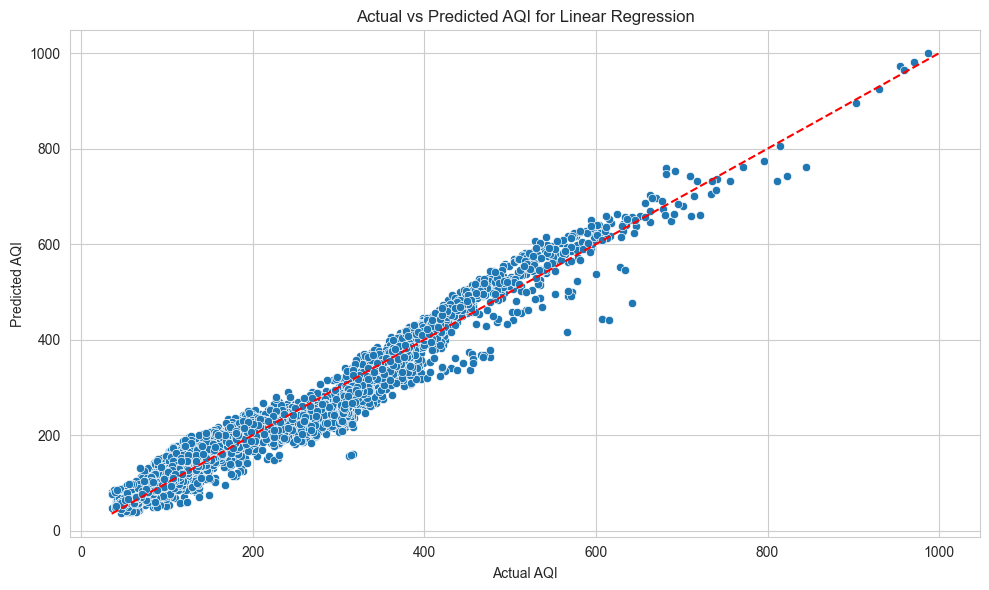

In [84]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted', data=results_df_lr)
plt.title('Actual vs Predicted AQI for Linear Regression' )
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_lr.min().min(), results_df_lr.max().max()], [results_df_lr.min().min(), results_df_lr.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()


In [106]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_lr['Year'] = results_df_lr.index.year
results_df_lr['Month'] = results_df_lr.index.month
results_df_lr['Time'] = results_df_lr.index.time
results_df_lr['Day'] = results_df_lr.index.day

# Group by year and month and calculate the mean
monthly_mean_df_lr = results_df_lr.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, resetting for easy plot
monthly_mean_df_lr.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_lr.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_lr.pivot(index='Month', columns='Year', values='Predicted')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years with LR model')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()


AttributeError: 'RangeIndex' object has no attribute 'year'

In [ ]:
# Extract year and day from the index ('Timestamp')
results_df_lr['Year'] = results_df_lr.index.year
results_df_lr['Day'] = results_df_lr.index.day

# Group by year and day and calculate the mean
daily_mean_df_lr = results_df_lr.groupby(['Year', 'Day']).mean()

# Since the result will have a MultiIndex, resetting for easy plot
daily_mean_df_lr.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and days as rows
pivot_actual = daily_mean_df_lr.pivot(index='Day', columns='Year', values='Actual')
pivot_predicted = daily_mean_df_lr.pivot(index='Day', columns='Year', values='Predicted')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Daily Average AQI (Actual vs Predicted) Over Years with LR model')
plt.xlabel('Day')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks()
plt.show()



In [ ]:
# Group by year and calculate the mean for each year
yearly_mean_df_lr = results_df_lr.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_lr.index, yearly_mean_df_lr['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_lr.index, yearly_mean_df_lr['Predicted'], marker='s', linestyle='--', color='green', label='Predicted')

plt.title('Yearly Average AQI (Actual vs Predicted) with LR model')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()


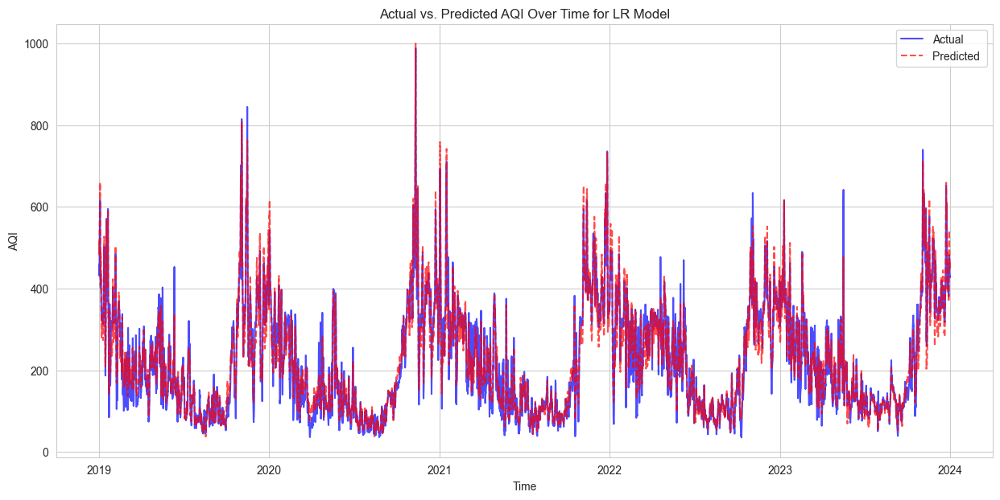

In [87]:
# Ensure the DataFrame is sorted by the datetime index
results_df_lr.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_lr.index, results_df_lr['Actual'], label='Actual ', color='blue', alpha=0.7)
plt.plot(results_df_lr.index, results_df_lr['Predicted'], label='Predicted ', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for LR Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


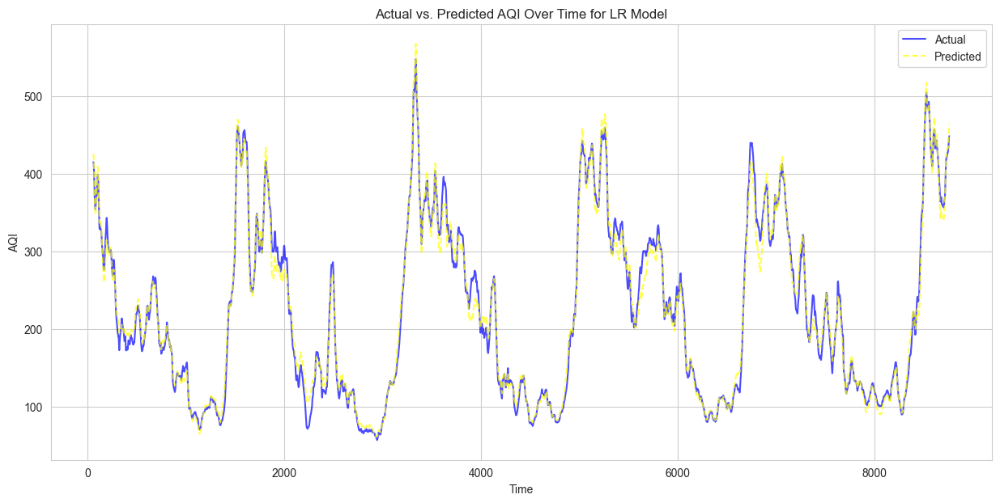

In [133]:
# Sort the DataFrame just in case the index is not in order.
results_df_lr.sort_index(inplace=True)
results_df_lr.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  # for example, a weekly rolling average
results_df_lr['Actual_smooth'] = results_df_lr['Actual'].rolling(window=rolling_window_size).mean()
results_df_lr['Predicted_lr_smooth'] = results_df_lr['Predicted'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_lr.index, results_df_lr['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_lr.index, results_df_lr['Predicted_lr_smooth'], label='Predicted', color='yellow', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for LR Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


#### RANDOM FOREST

In [97]:
from sklearn.ensemble import RandomForestRegressor

# Initialising the Random Forest Regressor
rf_model = RandomForestRegressor()

# Train the model on the training data
rf_model.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred_rf = rf_model.predict(X_test_scaled)


In [98]:
# Calculate the performance metrics
mae_rf = mean_absolute_error(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)  # Root Mean Squared Error
r2_rf = r2_score(y_test, y_pred_rf)

# Print the performance metrics
print(f"Random Forest Regressor - Mean Absolute Error (MAE): {mae_rf:.2f}")
print(f"Random Forest Regressor - Mean Squared Error (MSE): {mse_rf:.2f}")
print(f"Random Forest Regressor - Root Mean Squared Error (RMSE): {rmse_rf:.2f}")
print(f"Random Forest Regressor - R-squared (R²): {r2_rf:}")


Random Forest Regressor - Mean Absolute Error (MAE): 0.21
Random Forest Regressor - Mean Squared Error (MSE): 0.99
Random Forest Regressor - Root Mean Squared Error (RMSE): 1.00
Random Forest Regressor - R-squared (R²): 0.9999425549671059


In [99]:
# Creating a Series from the numpy array 'y_pred_rf' with the index matching 'y_test'
y_pred_series_rf = pd.Series(y_pred_rf, index=y_test.index, name='Predicted_rf')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_rf = pd.concat([y_test.rename('Actual'), y_pred_series_rf], axis=1)

results_df_rf.head()



,Actual,Predicted_rf
Timestamp,,
2019-05-05 08:00:00,156.660714,156.664340
2021-11-25 05:00:00,405.657051,405.673878
2021-11-08 12:00:00,419.735577,419.761230
2019-10-28 08:00:00,397.748397,397.739824
2019-06-04 12:00:00,164.652778,164.666319


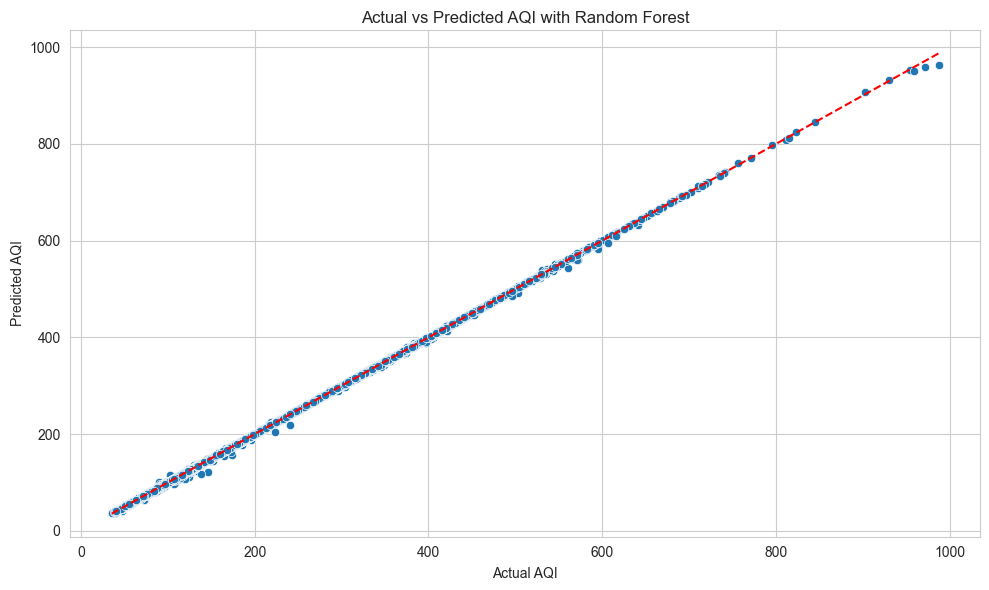

In [100]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_rf', data=results_df_rf)
plt.title('Actual vs Predicted AQI with Random Forest')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_rf.min().min(), results_df_rf.max().max()], [results_df_rf.min().min(), results_df_rf.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()




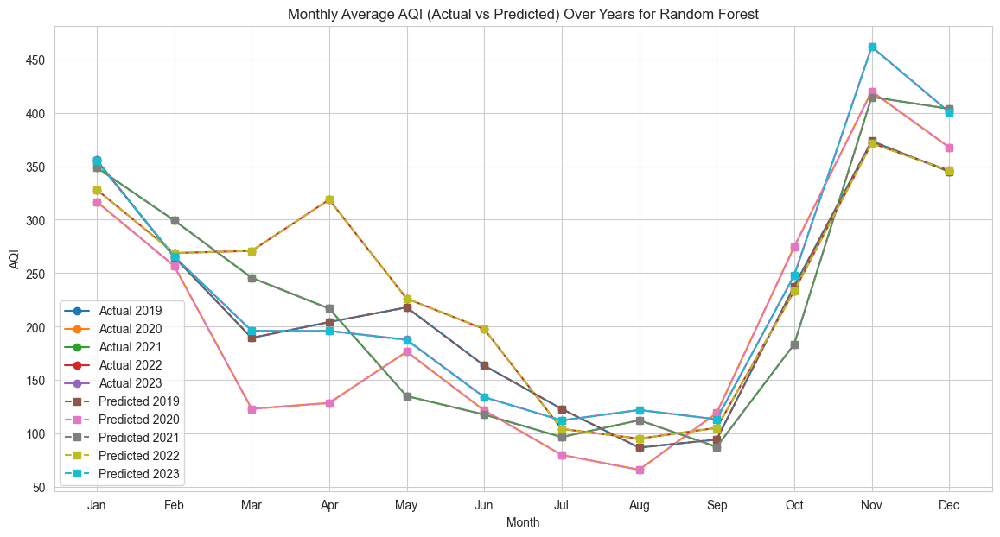

In [101]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_rf['Year'] = results_df_rf.index.year
results_df_rf['Month'] = results_df_rf.index.month

# Group by year and month and calculate the mean
monthly_mean_df_rf = results_df_rf.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_rf.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_rf.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_rf.pivot(index='Month', columns='Year', values='Predicted_rf')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years for Random Forest')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()


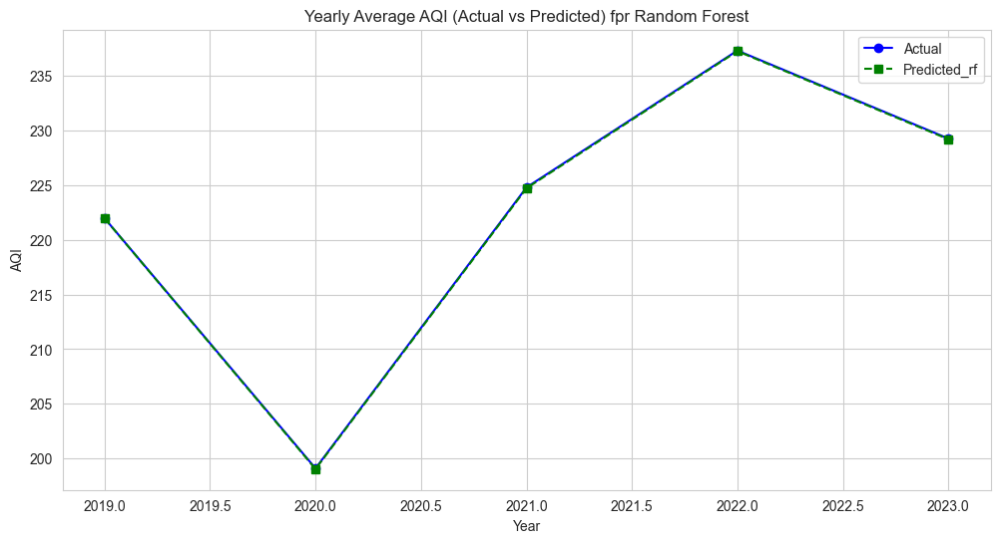

In [102]:
# Group by year and calculate the mean for each year
yearly_mean_df_rf = results_df_rf.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_rf.index, yearly_mean_df_rf['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_rf.index, yearly_mean_df_rf['Predicted_rf'], marker='s', linestyle='--', color='green', label='Predicted_rf')

plt.title('Yearly Average AQI (Actual vs Predicted) fpr Random Forest')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

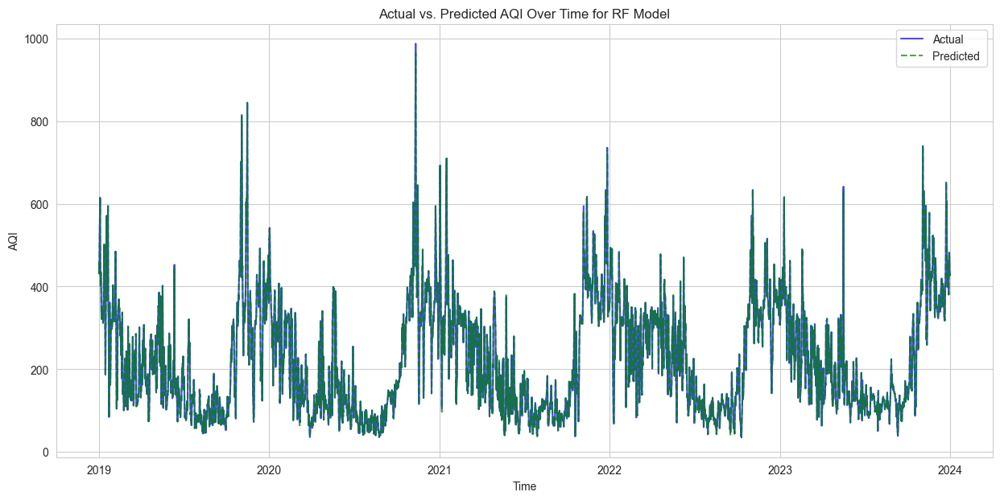

In [103]:
results_df_rf.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_rf.index, results_df_rf['Actual'], label='Actual ', color='blue', alpha=0.7)
plt.plot(results_df_rf.index, results_df_rf['Predicted_rf'], label='Predicted ', color='green', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for RF Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()



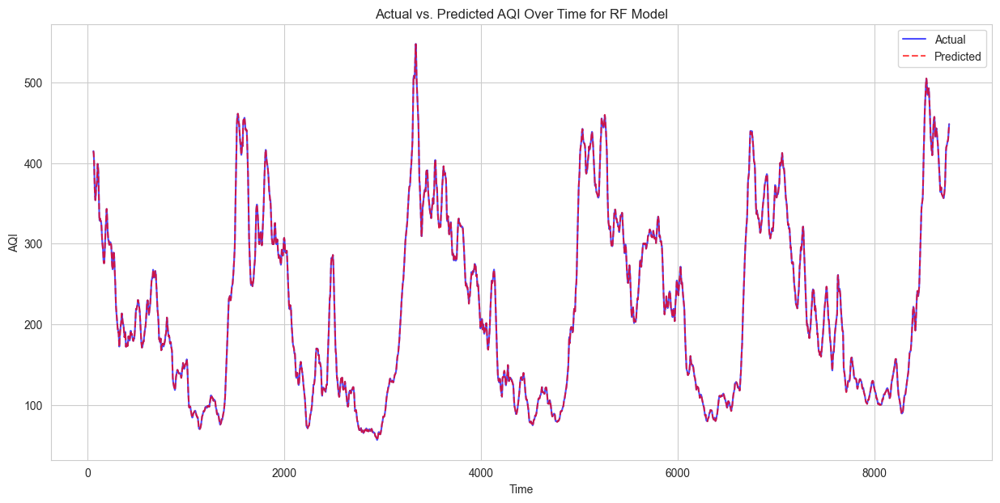

In [132]:
# Sort the DataFrame just in case the index is not in order.
results_df_rf.sort_index(inplace=True)
results_df_rf.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  # for example, a weekly rolling average
results_df_rf['Actual_smooth'] = results_df_rf['Actual'].rolling(window=rolling_window_size).mean()
results_df_rf['Predicted_rf_smooth'] = results_df_rf['Predicted_rf'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_rf.index, results_df_rf['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_rf.index, results_df_rf['Predicted_rf_smooth'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for RF Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


##### GRADIENT BOOSTING

In [108]:
from sklearn.ensemble import GradientBoostingRegressor

# Initialize the Gradient Boosting Regressor
gbr_model = GradientBoostingRegressor()

# Train the model on the training data
gbr_model.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred_gbr = gbr_model.predict(X_test_scaled)


In [109]:
# Calculate the performance metrics for Gradient Boosting Regressor
mae_gbr = mean_absolute_error(y_test, y_pred_gbr)
mse_gbr = mean_squared_error(y_test, y_pred_gbr)
rmse_gbr = np.sqrt(mse_gbr)
r2_gbr = r2_score(y_test, y_pred_gbr)

# Print the performance metrics
print(f"Gradient Boosting Regressor - Mean Absolute Error (MAE): {mae_gbr:.2f}")
print(f"Gradient Boosting Regressor - Mean Squared Error (MSE): {mse_gbr:.2f}")
print(f"Gradient Boosting Regressor - Root Mean Squared Error (RMSE): {rmse_gbr:.2f}")
print(f"Gradient Boosting Regressor - R-squared (R²): {r2_gbr:}")


Gradient Boosting Regressor - Mean Absolute Error (MAE): 3.84
Gradient Boosting Regressor - Mean Squared Error (MSE): 36.44
Gradient Boosting Regressor - Root Mean Squared Error (RMSE): 6.04
Gradient Boosting Regressor - R-squared (R²): 0.9978871268845926


In [110]:
# Creating a Series from the numpy array 'y_pred_gbr' with the index matching 'y_test'
y_pred_series_gbr = pd.Series(y_pred_gbr, index=y_test.index, name='Predicted_gbr')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_gbr = pd.concat([y_test.rename('Actual'), y_pred_series_gbr], axis=1)

results_df_gbr.head()



,Actual,Predicted_gbr
Timestamp,,
2019-05-05 08:00:00,156.660714,153.479126
2021-11-25 05:00:00,405.657051,397.778174
2021-11-08 12:00:00,419.735577,411.737612
2019-10-28 08:00:00,397.748397,401.273802
2019-06-04 12:00:00,164.652778,161.897132


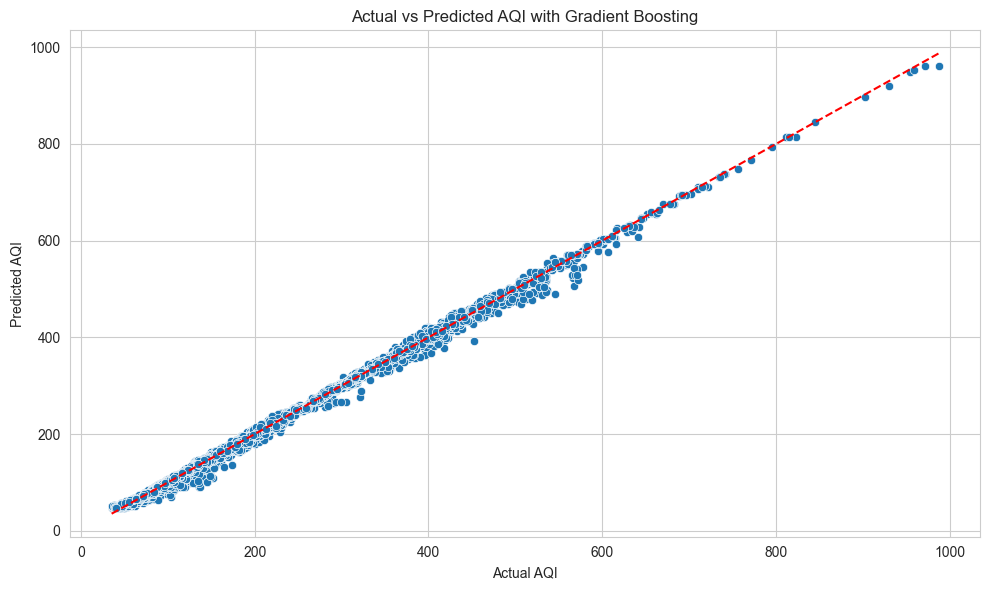

In [111]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_gbr', data=results_df_gbr)
plt.title('Actual vs Predicted AQI with Gradient Boosting')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_gbr.min().min(), results_df_gbr.max().max()], [results_df_gbr.min().min(), results_df_gbr.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

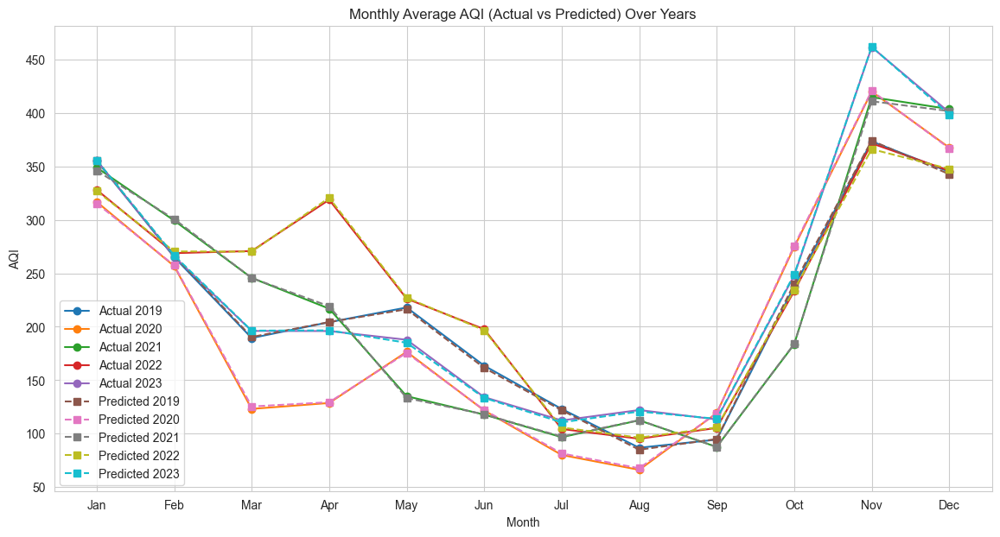

In [112]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_gbr['Year'] = results_df_gbr.index.year
results_df_gbr['Month'] = results_df_gbr.index.month

# Group by year and month and calculate the mean
monthly_mean_df_gbr = results_df_gbr.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_gbr.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_gbr.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_gbr.pivot(index='Month', columns='Year', values='Predicted_gbr')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

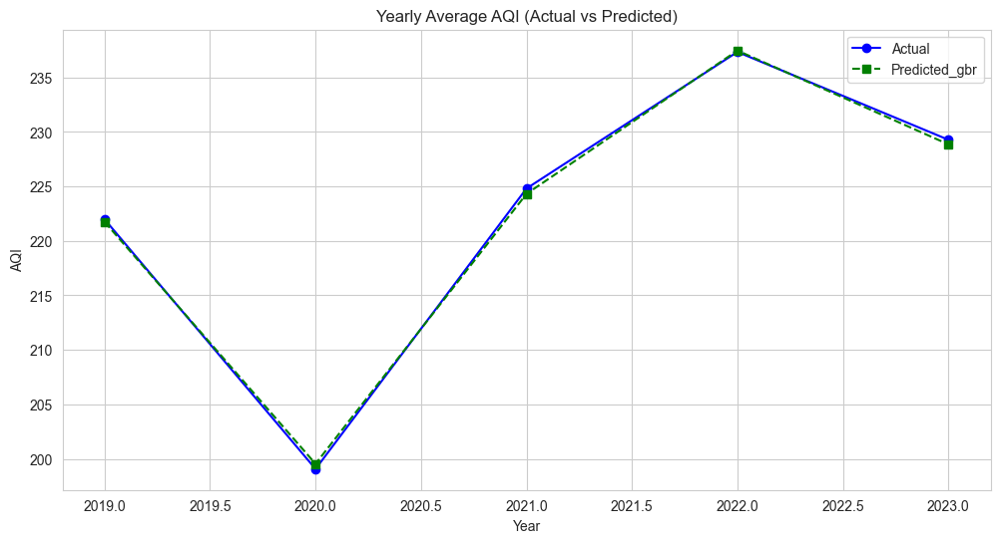

In [113]:
# Group by year and calculate the mean for each year
yearly_mean_df_gbr = results_df_gbr.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_gbr.index, yearly_mean_df_gbr['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_gbr.index, yearly_mean_df_gbr['Predicted_gbr'], marker='s', linestyle='--', color='green', label='Predicted_gbr')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()


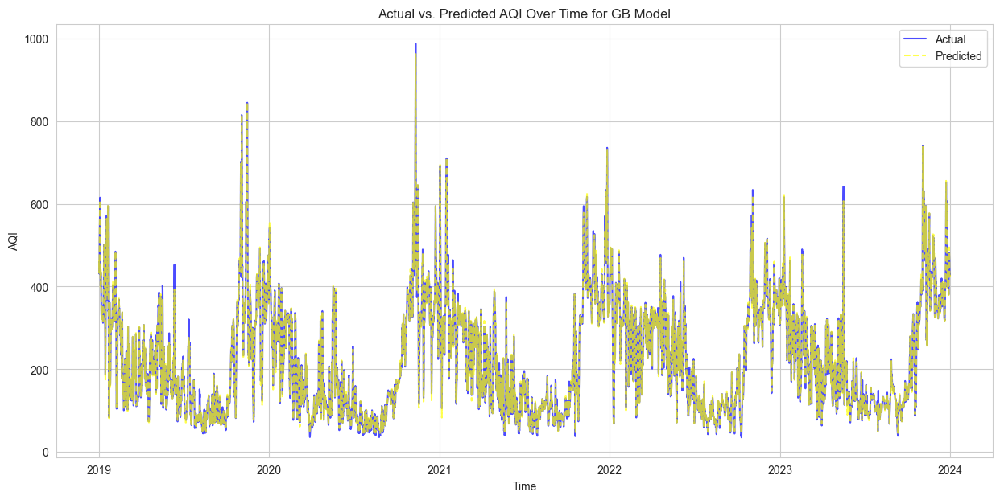

In [114]:
# Ensure the DataFrame is sorted by the datetime index
results_df_gbr.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_gbr.index, results_df_gbr['Actual'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_gbr.index, results_df_gbr['Predicted_gbr'], label='Predicted', color='yellow', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for GB Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()



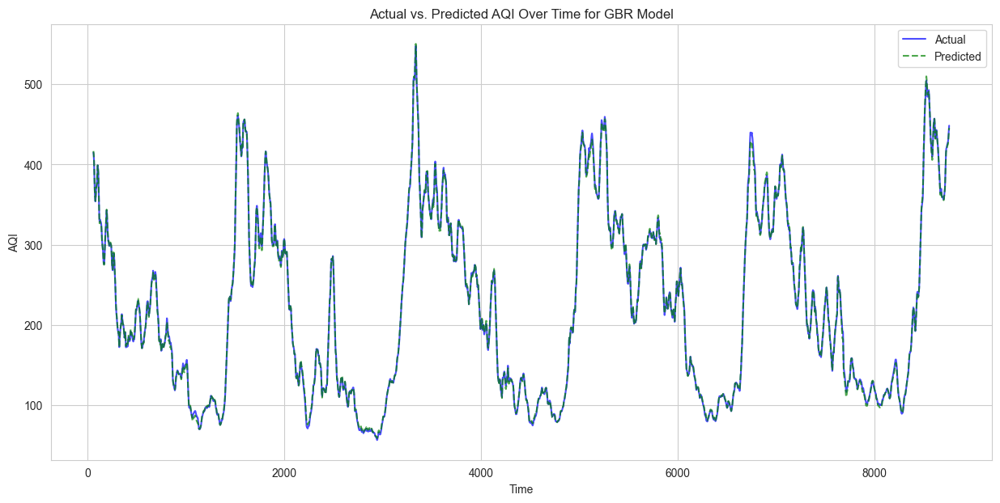

In [131]:
# Sort the DataFrame just in case the index is not in order.
results_df_rf.sort_index(inplace=True)
results_df_gbr.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  # for example, a weekly rolling average
results_df_gbr['Actual_smooth'] = results_df_gbr['Actual'].rolling(window=rolling_window_size).mean()
results_df_gbr['Predicted_gbr_smooth'] = results_df_gbr['Predicted_gbr'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_gbr.index, results_df_gbr['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_gbr.index, results_df_gbr['Predicted_gbr_smooth'], label='Predicted', color='green', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for GBR Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


#### eXTREME GRADIENT BOOSTING

In [116]:
import xgboost as xgb
# Initialize the XGBoost Regressor
xgb_model = xgb.XGBRegressor()
# Train the model on the training data
xgb_model.fit(X_train_scaled, y_train)
# Predict on the test data
y_pred_xgb = xgb_model.predict(X_test_scaled)


In [117]:
# Calculate the performance metrics for XGBoost Regressor
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mse_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

# Print the performance metrics
print(f"XGBoost Regressor - Mean Absolute Error (MAE): {mae_xgb:.2f}")
print(f"XGBoost Regressor - Mean Squared Error (MSE): {mse_xgb:.2f}")
print(f"XGBoost Regressor - Root Mean Squared Error (RMSE): {rmse_xgb:.2f}")
print(f"XGBoost Regressor - R-squared (R²): {r2_xgb:}")

XGBoost Regressor - Mean Absolute Error (MAE): 1.23
XGBoost Regressor - Mean Squared Error (MSE): 7.20
XGBoost Regressor - Root Mean Squared Error (RMSE): 2.68
XGBoost Regressor - R-squared (R²): 0.9995824399214618


In [118]:
# Creating a Series from the numpy array 'y_pred_xgb' with the index matching 'y_test'
y_pred_series_xgb = pd.Series(y_pred_xgb, index=y_test.index, name='Predicted_xgb')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_xgb = pd.concat([y_test.rename('Actual'), y_pred_series_xgb], axis=1)

results_df_xgb.head()



,Actual,Predicted_xgb
Timestamp,,
2019-05-05 08:00:00,156.660714,155.890579
2021-11-25 05:00:00,405.657051,404.795349
2021-11-08 12:00:00,419.735577,418.176910
2019-10-28 08:00:00,397.748397,398.889862
2019-06-04 12:00:00,164.652778,164.189499


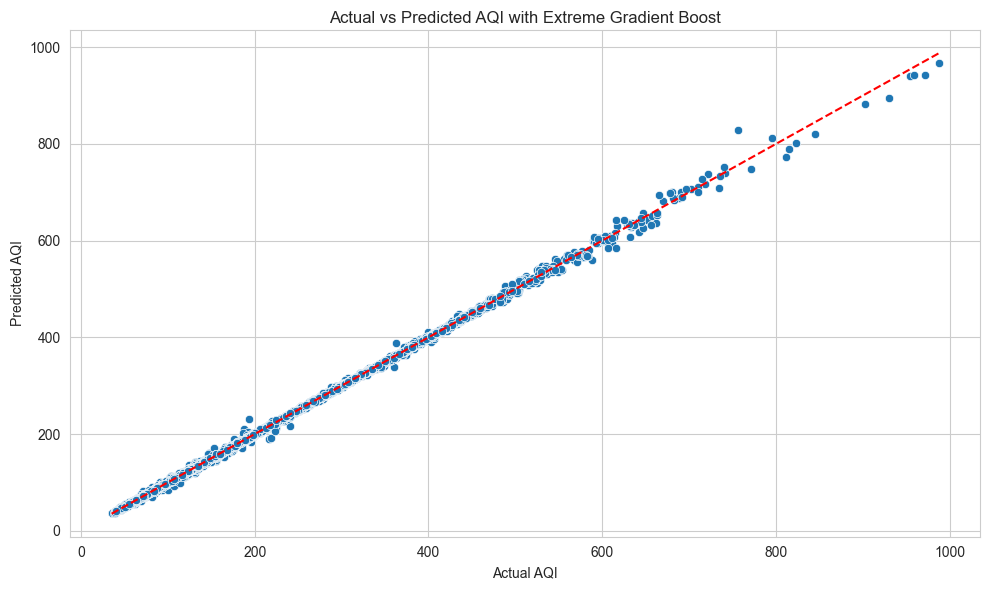

In [119]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_xgb', data=results_df_xgb)
plt.title('Actual vs Predicted AQI with Extreme Gradient Boost')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_xgb.min().min(), results_df_xgb.max().max()], [results_df_xgb.min().min(), results_df_xgb.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

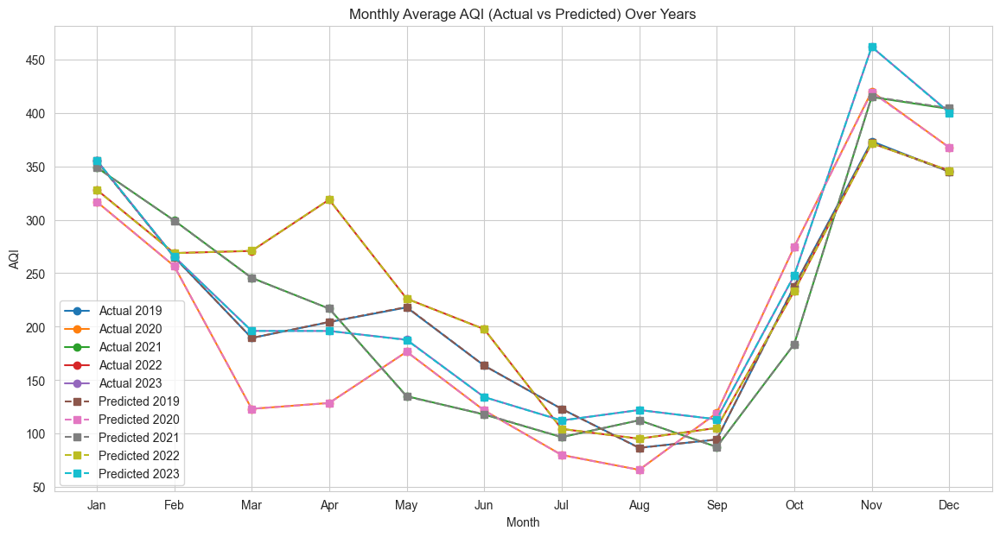

In [120]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_xgb['Year'] = results_df_xgb.index.year
results_df_xgb['Month'] = results_df_xgb.index.month

# Group by year and month and calculate the mean
monthly_mean_df_xgb = results_df_xgb.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_xgb.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_xgb.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_xgb.pivot(index='Month', columns='Year', values='Predicted_xgb')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

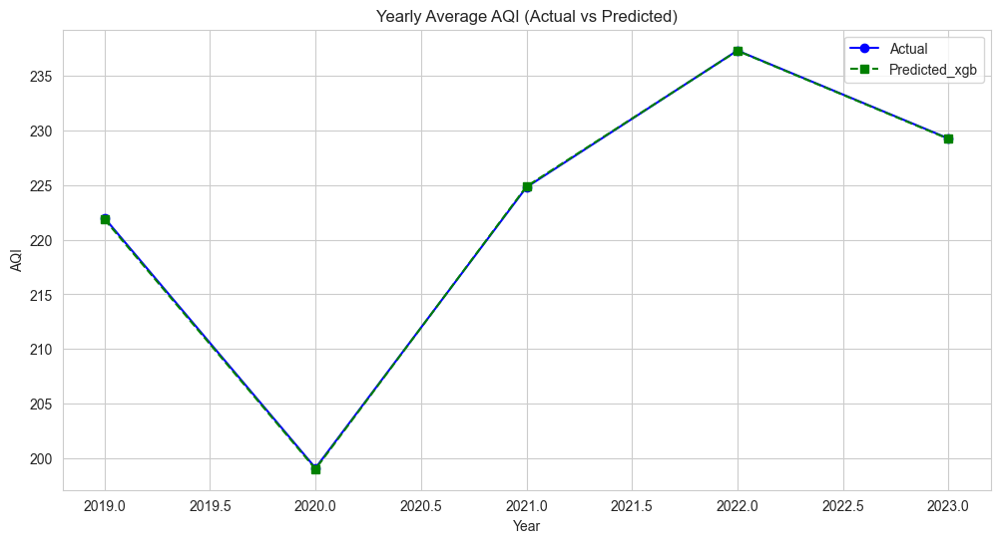

In [121]:
# Group by year and calculate the mean for each year
yearly_mean_df_xgb = results_df_xgb.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_xgb.index, yearly_mean_df_xgb['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_xgb.index, yearly_mean_df_xgb['Predicted_xgb'], marker='s', linestyle='--', color='green', label='Predicted_xgb')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()


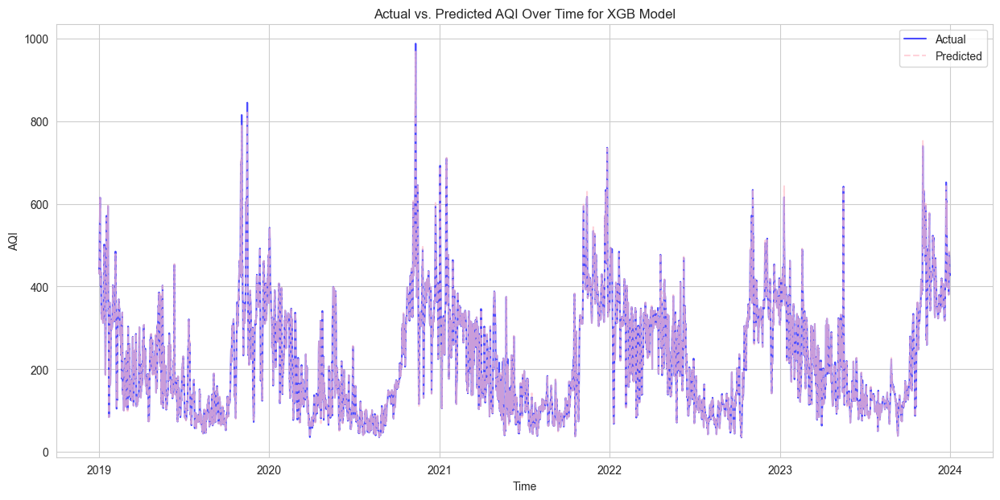

In [122]:
# Ensure the DataFrame is sorted by the datetime index
results_df_xgb.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_xgb.index, results_df_xgb['Actual'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_xgb.index, results_df_xgb['Predicted_xgb'], label='Predicted', color='pink', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for XGB Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()

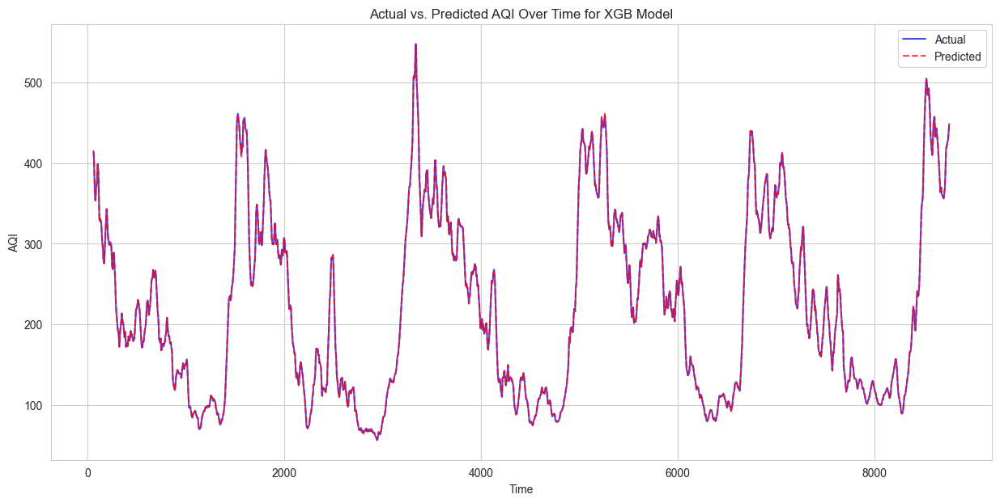

In [130]:
# Sort the DataFrame just in case the index is not in order.
results_df_rf.sort_index(inplace=True)
results_df_xgb.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  # for example, a weekly rolling average
results_df_xgb['Actual_smooth'] = results_df_xgb['Actual'].rolling(window=rolling_window_size).mean()
results_df_xgb['Predicted_xgb_smooth'] = results_df_xgb['Predicted_xgb'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_xgb.index, results_df_xgb['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_xgb.index, results_df_xgb['Predicted_xgb_smooth'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for XGB Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


#### KNN

In [109]:
from sklearn.neighbors import KNeighborsRegressor

# Initialize the KNN Regressor
# n_neighbors is a hyperparameter that you can tune. Starting with k=5
knn_model = KNeighborsRegressor(n_neighbors=5)

# Train the model on the scaled training data
knn_model.fit(X_train_scaled, y_train)

# Predict on the scaled test data
y_pred_knn = knn_model.predict(X_test_scaled)


  File "C:\Users\Ajiboye Oluwaseun\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


In [110]:
# Calculate the performance metrics for KNN Regressor
mae_knn = mean_absolute_error(y_test, y_pred_knn)
mse_knn = mean_squared_error(y_test, y_pred_knn)
rmse_knn = np.sqrt(mse_knn)
r2_knn = r2_score(y_test, y_pred_knn)

# Print the performance metrics
print(f"KNN Regressor - Mean Absolute Error (MAE): {mae_knn:.2f}")
print(f"KNN Regressor - Mean Squared Error (MSE): {mse_knn:.2f}")
print(f"KNN Regressor - Root Mean Squared Error (RMSE): {rmse_knn:.2f}")
print(f"KNN Regressor - R-squared (R²): {r2_knn:.4f}")


KNN Regressor - Mean Absolute Error (MAE): 13.38
KNN Regressor - Mean Squared Error (MSE): 396.42
KNN Regressor - Root Mean Squared Error (RMSE): 19.91
KNN Regressor - R-squared (R²): 0.9770


In [111]:
# Creating a Series from the numpy array 'y_pred_knn' with the index matching 'y_test'
y_pred_series_knn = pd.Series(y_pred_knn, index=y_test.index, name='Predicted_knn')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_knn = pd.concat([y_test.rename('Actual'), y_pred_series_knn], axis=1)

results_df_knn.head()



,Actual,Predicted_knn
Timestamp,,
2019-05-05 08:00:00,156.660714,149.026984
2021-11-25 05:00:00,405.657051,405.698718
2021-11-08 12:00:00,419.735577,428.214744
2019-10-28 08:00:00,397.748397,397.916667
2019-06-04 12:00:00,164.652778,170.839583


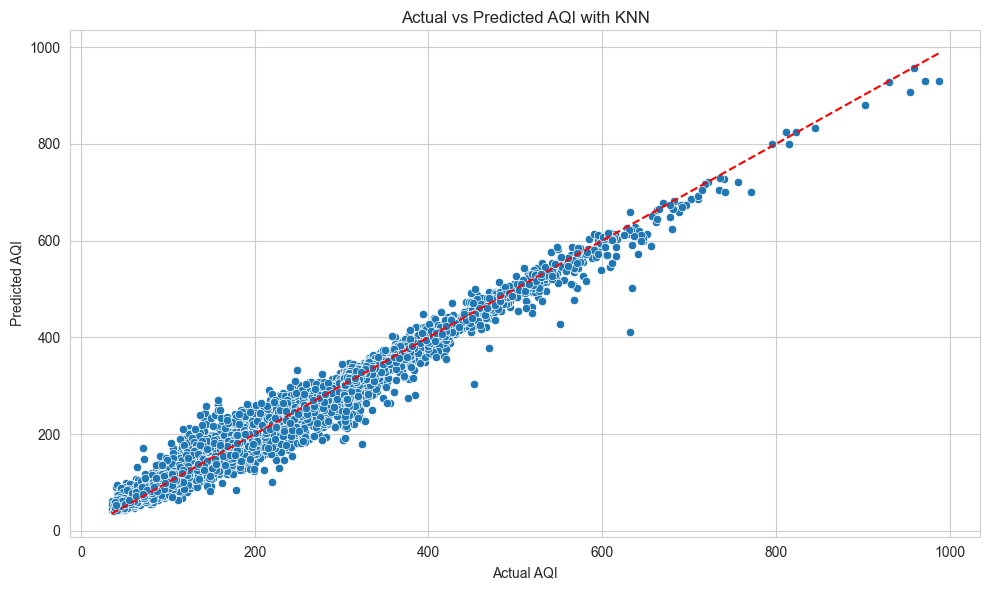

In [112]:

import pandas as pd
import matplotlib.pyplot as plt
# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_knn', data=results_df_knn)
plt.title('Actual vs Predicted AQI with KNN')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_knn.min().min(), results_df_knn.max().max()], [results_df_knn.min().min(), results_df_knn.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

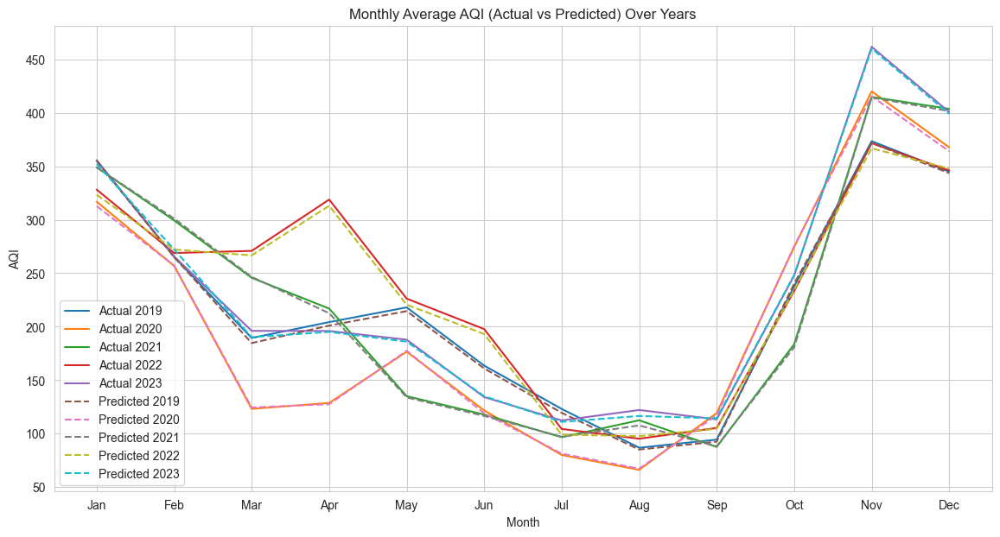

In [113]:


# Extract year and month from the index (which is the 'Timestamp')
results_df_knn['Year'] = results_df_knn.index.year
results_df_knn['Month'] = results_df_knn.index.month

# Group by year and month and calculate the mean
monthly_mean_df_knn = results_df_knn.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_knn.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_knn.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_knn.pivot(index='Month', columns='Year', values='Predicted_knn')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()


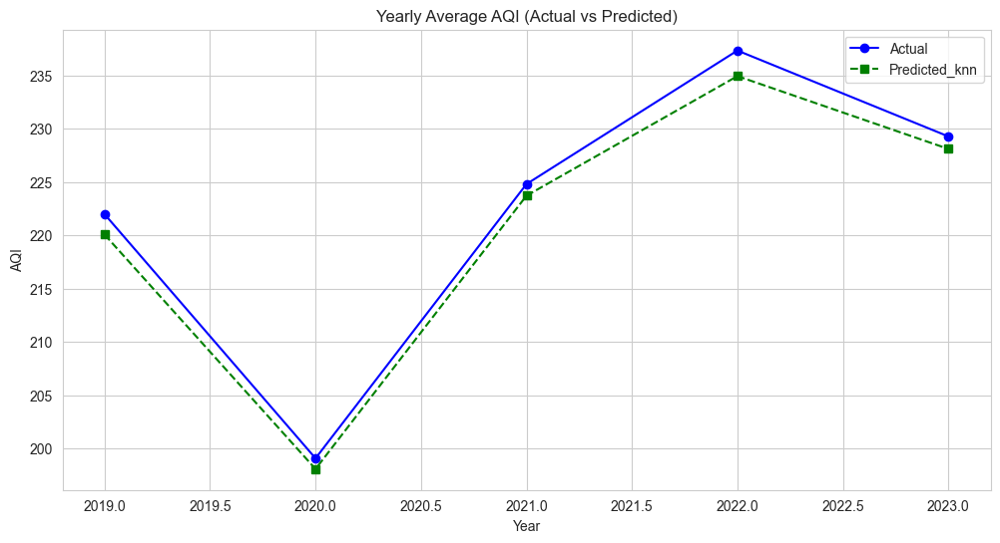

In [114]:
# Group by year and calculate the mean for each year
yearly_mean_df_knn = results_df_knn.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_knn.index, yearly_mean_df_knn['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_knn.index, yearly_mean_df_knn['Predicted_knn'], marker='s', linestyle='--', color='green', label='Predicted_knn')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()


In [115]:
'''# Add KNN predictions to the results DataFrame
results_df['Predicted AQI (KNN)'] = y_pred_knn

plt.figure(figsize=(15, 7))
plt.plot(results_df.index, results_df['Actual AQI'], label='Actual AQI', color='blue', alpha=0.7)
plt.plot(results_df.index, results_df['Predicted AQI (KNN)'], label='Predicted AQI (KNN)', color='cyan', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time (KNN)')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()
'''

"# Add KNN predictions to the results DataFrame\nresults_df['Predicted AQI (KNN)'] = y_pred_knn\n\nplt.figure(figsize=(15, 7))\nplt.plot(results_df.index, results_df['Actual AQI'], label='Actual AQI', color='blue', alpha=0.7)\nplt.plot(results_df.index, results_df['Predicted AQI (KNN)'], label='Predicted AQI (KNN)', color='cyan', alpha=0.7, linestyle='--')\nplt.title('Actual vs. Predicted AQI Over Time (KNN)')\nplt.xlabel('Time')\nplt.ylabel('AQI')\nplt.legend()\nplt.show()\n"

#### SVR

In [116]:
from sklearn.svm import SVR
# Initialize the SVR model with a linear kernel
svr_model = SVR(kernel='rbf')

# Train the model on the scaled training data
svr_model.fit(X_train_scaled, y_train)
# Predict on the scaled test data
y_pred_svr = svr_model.predict(X_test_scaled)

In [117]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Calculate the performance metrics
mae_svr = mean_absolute_error(y_test, y_pred_svr)
mse_svr = mean_squared_error(y_test, y_pred_svr)
rmse_svr = np.sqrt(mse_svr)
r2_svr = r2_score(y_test, y_pred_svr)

# Print the performance metrics
print(f"SVR - Mean Absolute Error (MAE): {mae_svr:.2f}")
print(f"SVR - Mean Squared Error (MSE): {mse_svr:.2f}")
print(f"SVR - Root Mean Squared Error (RMSE): {rmse_svr:.2f}")
print(f"SVR - R-squared (R²): {r2_svr:.4f}")


SVR - Mean Absolute Error (MAE): 19.36
SVR - Mean Squared Error (MSE): 1392.02
SVR - Root Mean Squared Error (RMSE): 37.31
SVR - R-squared (R²): 0.9193


In [118]:
# Creating a Series from the numpy array 'y_pred_svr' with the index matching 'y_test'
y_pred_series_svr = pd.Series(y_pred_svr, index=y_test.index, name='Predicted_svr')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_svr = pd.concat([y_test.rename('Actual'), y_pred_series_svr], axis=1)

results_df_svr.head()

,Actual,Predicted_svr
Timestamp,,
2019-05-05 08:00:00,156.660714,176.334805
2021-11-25 05:00:00,405.657051,400.361489
2021-11-08 12:00:00,419.735577,430.538380
2019-10-28 08:00:00,397.748397,421.606729
2019-06-04 12:00:00,164.652778,166.696985


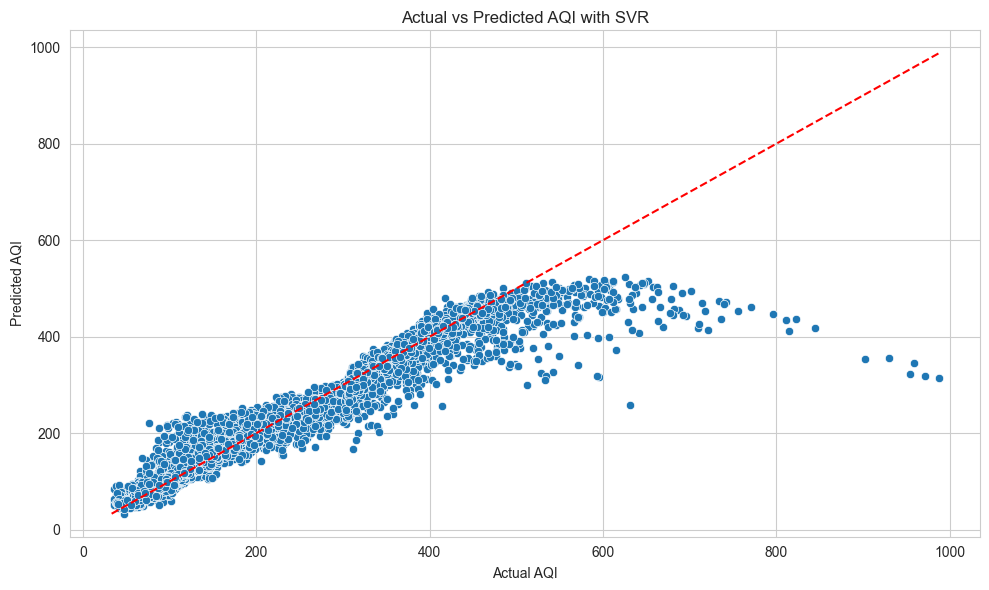

In [119]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_svr', data=results_df_svr)
plt.title('Actual vs Predicted AQI with SVR')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_svr.min().min(), results_df_svr.max().max()], [results_df_svr.min().min(), results_df_svr.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

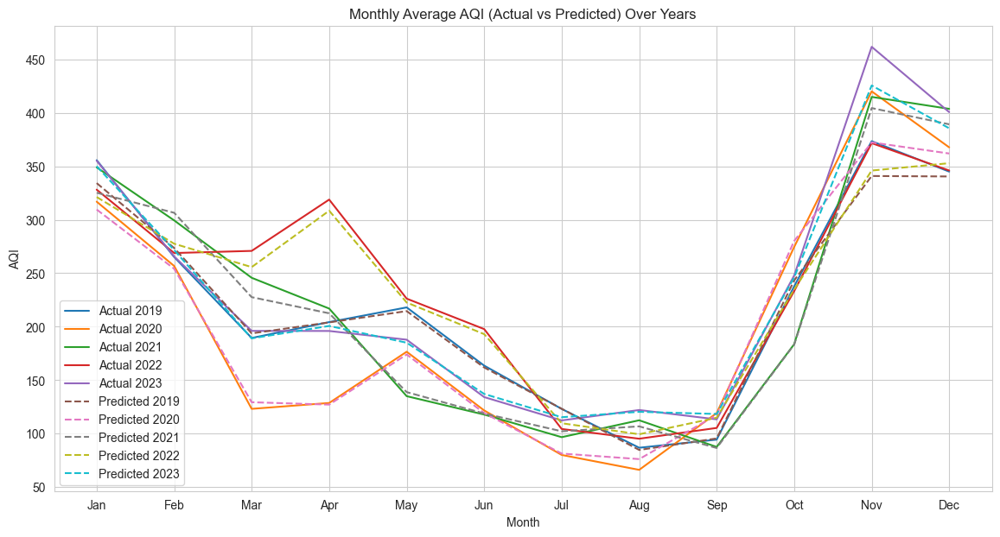

In [120]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_svr['Year'] = results_df_svr.index.year
results_df_svr['Month'] = results_df_svr.index.month

# Group by year and month and calculate the mean
monthly_mean_df_svr = results_df_svr.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_svr.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_svr.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_svr.pivot(index='Month', columns='Year', values='Predicted_svr')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

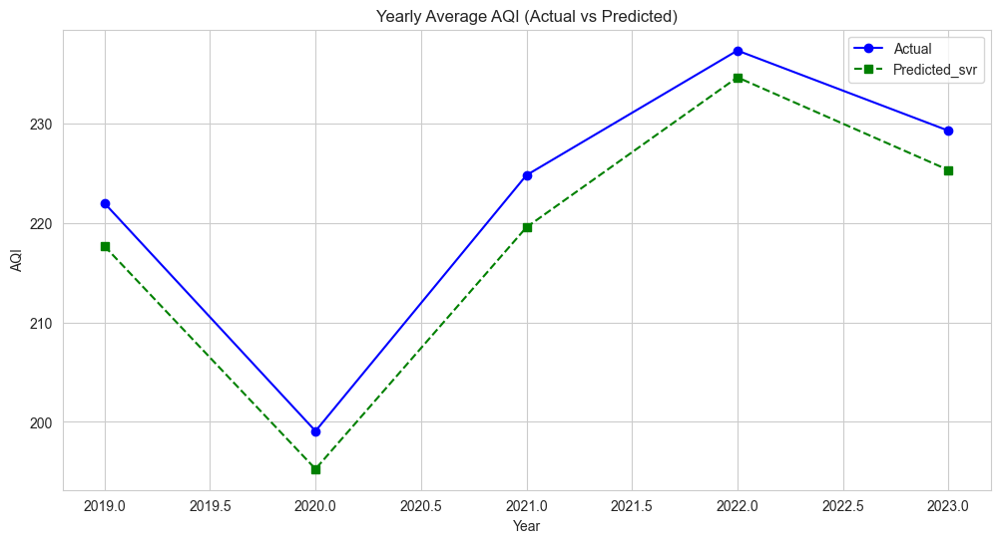

In [121]:
# Group by year and calculate the mean for each year
yearly_mean_df_svr = results_df_svr.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_svr.index, yearly_mean_df_svr['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_svr.index, yearly_mean_df_svr['Predicted_svr'], marker='s', linestyle='--', color='green', label='Predicted_svr')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

In [122]:
'''# Add SVR predictions to the results DataFrame
results_df['Predicted AQI (SVR)'] = y_pred_svr

plt.figure(figsize=(15, 7))
plt.plot(results_df.index, results_df['Actual AQI'], label='Actual AQI', color='blue', alpha=0.7)
plt.plot(results_df.index, results_df['Predicted AQI (SVR)'], label='Predicted AQI (SVR)', color='pink', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time (SVR)')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()'''

"# Add SVR predictions to the results DataFrame\nresults_df['Predicted AQI (SVR)'] = y_pred_svr\n\nplt.figure(figsize=(15, 7))\nplt.plot(results_df.index, results_df['Actual AQI'], label='Actual AQI', color='blue', alpha=0.7)\nplt.plot(results_df.index, results_df['Predicted AQI (SVR)'], label='Predicted AQI (SVR)', color='pink', alpha=0.7, linestyle='--')\nplt.title('Actual vs. Predicted AQI Over Time (SVR)')\nplt.xlabel('Time')\nplt.ylabel('AQI')\nplt.legend()\nplt.show()"

#### DECISION TREES

In [123]:
from sklearn.tree import DecisionTreeRegressor

# Initialize the Decision Tree Regressor
dt_reg = DecisionTreeRegressor()  # Consider tuning `max_depth`

# Train the model on the training data
dt_reg.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred_dt = dt_reg.predict(X_test_scaled)

In [124]:
# Calculate the performance metrics
mae_dt = mean_absolute_error(y_test, y_pred_dt)
mse_dt = mean_squared_error(y_test, y_pred_dt)
rmse_dt = np.sqrt(mse_dt)
r2_dt = r2_score(y_test, y_pred_dt)

# Print the performance metrics
print(f"Decision Tree Regressor - Mean Absolute Error (MAE): {mae_dt:.2f}")
print(f"Decision Tree Regressor - Mean Squared Error (MSE): {mse_dt:.2f}")
print(f"Decision Tree Regressor - Root Mean Squared Error (RMSE): {rmse_dt:.2f}")
print(f"Decision Tree Regressor - R-squared (R²): {r2_dt:.4f}")


Decision Tree Regressor - Mean Absolute Error (MAE): 0.32
Decision Tree Regressor - Mean Squared Error (MSE): 2.48
Decision Tree Regressor - Root Mean Squared Error (RMSE): 1.58
Decision Tree Regressor - R-squared (R²): 0.9999


In [125]:
# Creating a Series from the numpy array 'y_pred_dt' with the index matching 'y_test'
y_pred_series_dt = pd.Series(y_pred_dt, index=y_test.index, name='Predicted_dt')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_dt = pd.concat([y_test.rename('Actual'), y_pred_series_dt], axis=1)

results_df_dt.head()

,Actual,Predicted_dt
Timestamp,,
2019-05-05 08:00:00,156.660714,156.625000
2021-11-25 05:00:00,405.657051,405.657051
2021-11-08 12:00:00,419.735577,419.767628
2019-10-28 08:00:00,397.748397,397.732372
2019-06-04 12:00:00,164.652778,164.673611


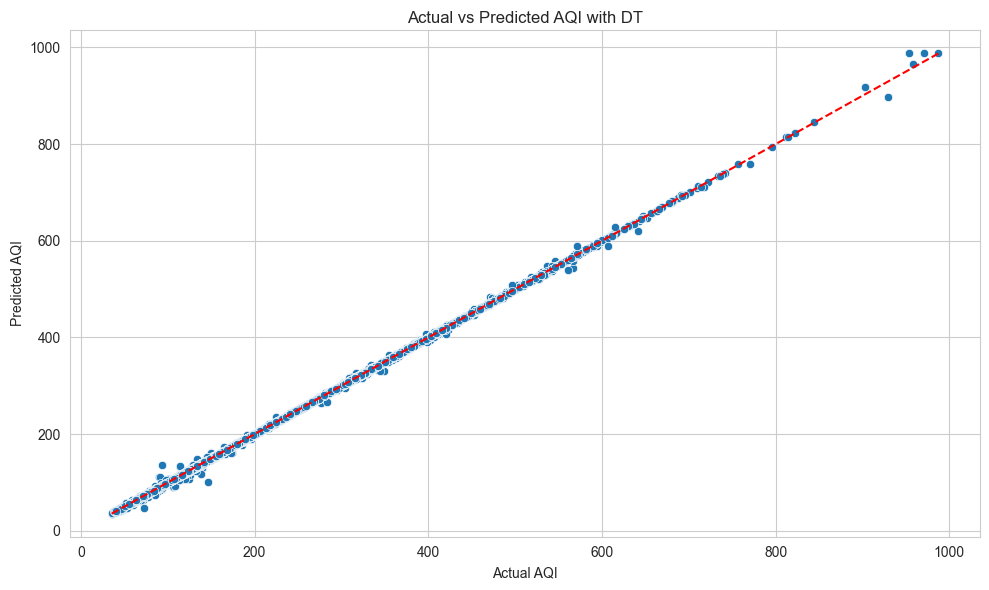

In [126]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_dt', data=results_df_dt)
plt.title('Actual vs Predicted AQI with DT')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_dt.min().min(), results_df_dt.max().max()], [results_df_dt.min().min(), results_df_dt.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

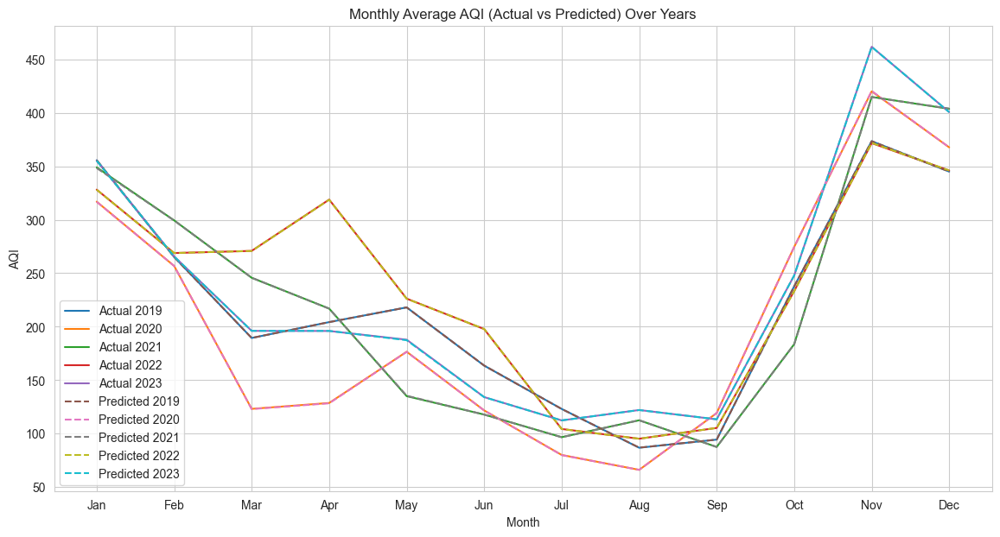

In [127]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_dt['Year'] = results_df_dt.index.year
results_df_dt['Month'] = results_df_dt.index.month

# Group by year and month and calculate the mean
monthly_mean_df_dt = results_df_dt.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_dt.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_dt.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_dt.pivot(index='Month', columns='Year', values='Predicted_dt')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()


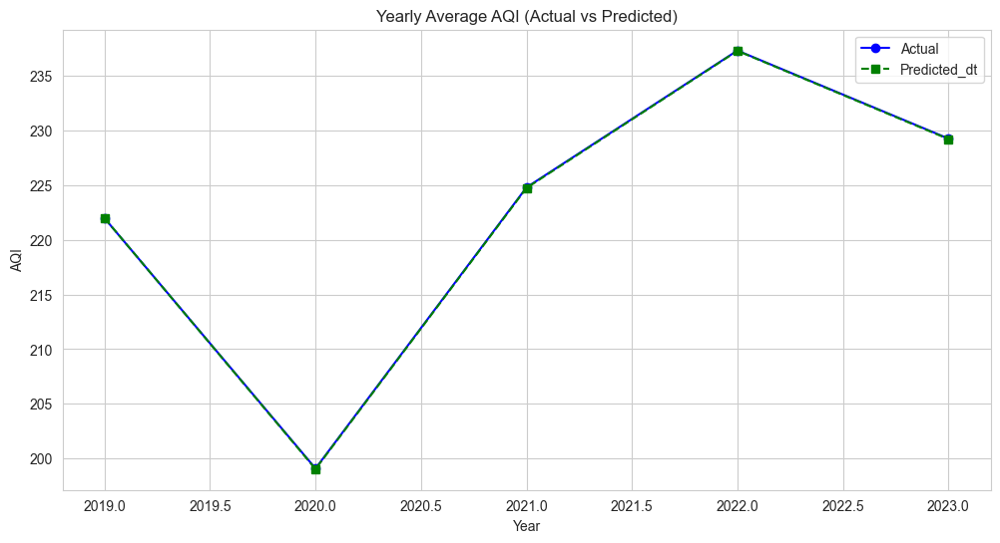

In [128]:
# Group by year and calculate the mean for each year
yearly_mean_df_dt = results_df_dt.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_dt.index, yearly_mean_df_dt['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_dt.index, yearly_mean_df_dt['Predicted_dt'], marker='s', linestyle='--', color='green', label='Predicted_dt')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

#### LSTM

Start time (LSTM): 2024-04-27 07:10:51
Epoch 1/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 23898.1328 - val_loss: 737.0817
Epoch 2/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 620.5354 - val_loss: 411.0455
Epoch 3/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 358.5728 - val_loss: 248.3138
Epoch 4/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 224.1830 - val_loss: 174.9055
Epoch 5/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 154.4355 - val_loss: 119.0515
Epoch 6/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 105.9782 - val_loss: 85.3812
Epoch 7/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 75.2366 - val_loss: 69.3815
Epoch 8/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 55.8112 - val_loss: 44.7165
Epoch 9/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 43.5972 - val_loss: 38.5861
Epoch 10/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 33.8715 - val_loss: 27.2692
Epoch 11/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - l

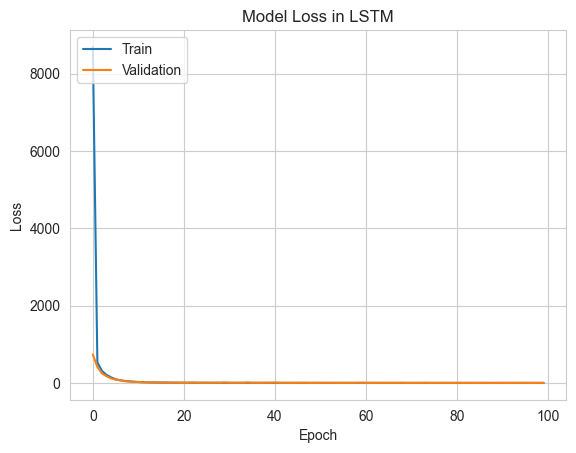

274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 871us/step - loss: 2.5185
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Mean Absolute Error (MAE) of LSTM: 1.18
Mean Squared Error (MSE) of LSTM: 2.48
Root Mean Squared Error (RMSE) of LSTM: 1.57
R-squared (R²) of LSTM: 0.9998564067125596
End time (LSTM): 2024-04-27 07:14:30
Total execution time (LSTM): 219.13847398757935 seconds


In [134]:
# Reshaping input to be 3D [samples, timesteps, features] for LSTM
X_train_scaled_shaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_scaled_shaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import time
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Start time
start_time_lstm = time.time()
print("Start time (LSTM):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(start_time_lstm)))
# Defining the model
model_lstm = Sequential()
model_lstm.add(LSTM(units=64, activation='relu', return_sequences=True, input_shape=(X_train_scaled_shaped.shape[1], 
                                                                                     X_train_scaled_shaped.shape[2])))
model_lstm.add(LSTM(units=128, activation='relu', return_sequences=True))
model_lstm.add(LSTM(units=32, activation='relu'))
model_lstm.add(Dense(1))

# Compiling the model
model_lstm.compile(optimizer='adam', loss='mean_squared_error')
#Training the model
history = model_lstm.fit(X_train_scaled_shaped, y_train, epochs=100, verbose=1, batch_size=32, validation_split=0.2)
# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss in LSTM')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# Evaluate the model
model_lstm.evaluate(X_test_scaled_shaped, y_test, verbose=1)
# Predictions
y_pred_lstm = model_lstm.predict(X_test_scaled_shaped)

##Measuring Performance
mae_lstm = mean_absolute_error(y_test, y_pred_lstm)
mse_lstm = mean_squared_error(y_test, y_pred_lstm)
rmse_lstm = np.sqrt(mse_lstm)
r2_lstm = r2_score(y_test, y_pred_lstm)

print(f"Mean Absolute Error (MAE) of LSTM: {mae_lstm:.2f}")
print(f"Mean Squared Error (MSE) of LSTM: {mse_lstm:.2f}")
print(f"Root Mean Squared Error (RMSE) of LSTM: {rmse_lstm:.2f}")
print(f"R-squared (R²) of LSTM: {r2_lstm:}")

# End time
end_time_lstm = time.time()
print("End time (LSTM):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end_time_lstm)))
# Total execution time
execution_time_lstm = end_time_lstm - start_time_lstm
print("Total execution time (LSTM):", execution_time_lstm, "seconds")

In [135]:
print(f"R-squared (R²) of LSTM: {r2_lstm:}")


R-squared (R²) of LSTM: 0.9998564067125596


In [136]:
# Creating a Series from the numpy array 'y_pred_lstm' with the index matching 'y_test'
y_pred_series_lstm = pd.Series(y_pred_lstm.flatten(), index=y_test.index, name='Predicted_lstm')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_lstm = pd.concat([y_test.rename('Actual'), y_pred_series_lstm], axis=1)

results_df_lstm.head()

,Actual,Predicted_lstm
Timestamp,,
2019-05-05 08:00:00,156.660714,156.845612
2021-11-25 05:00:00,405.657051,407.403015
2021-11-08 12:00:00,419.735577,420.574493
2019-10-28 08:00:00,397.748397,399.282654
2019-06-04 12:00:00,164.652778,163.659378


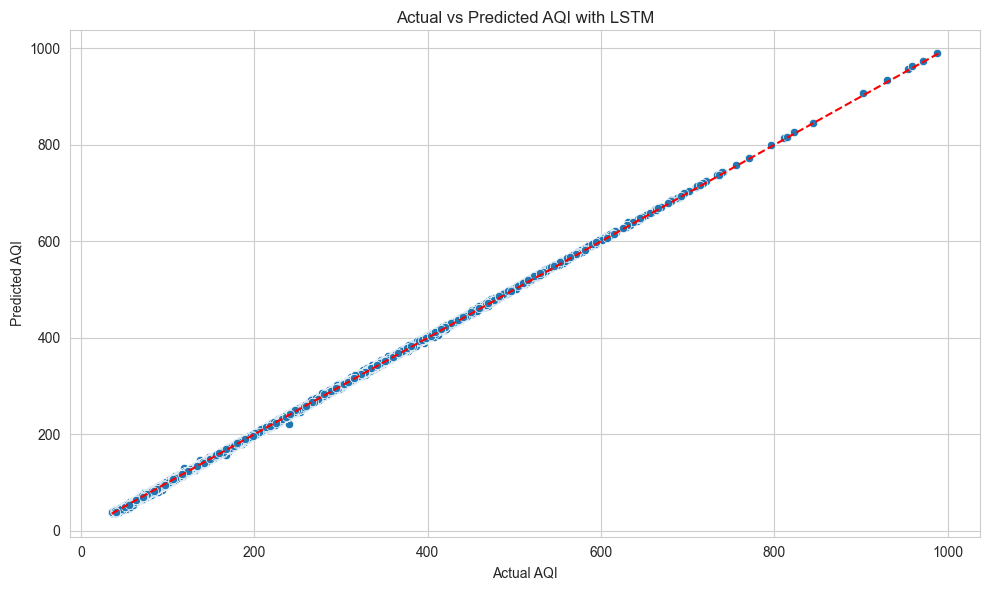

In [137]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_lstm', data=results_df_lstm)
plt.title('Actual vs Predicted AQI with LSTM')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_lstm.min().min(), results_df_lstm.max().max()], [results_df_lstm.min().min(), results_df_lstm.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

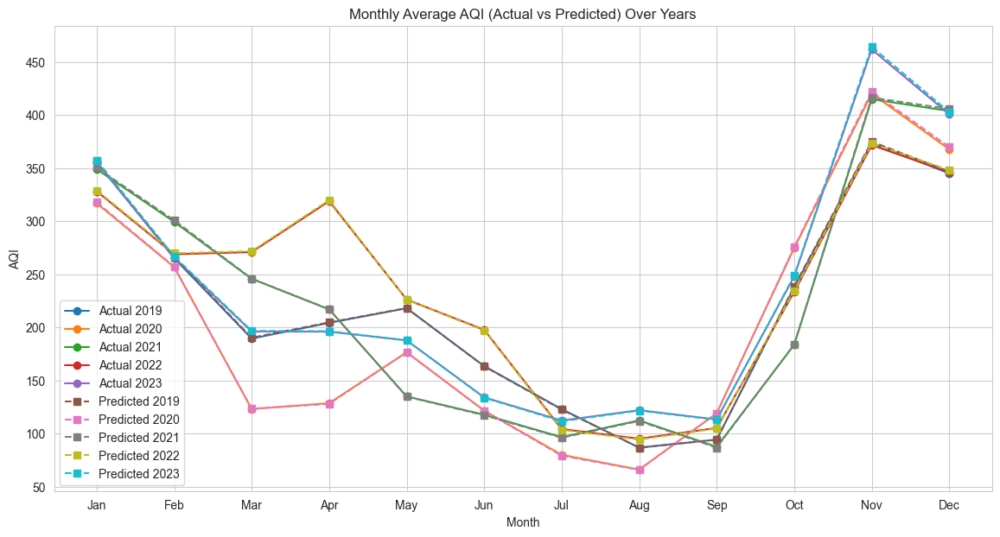

In [138]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_lstm['Year'] = results_df_lstm.index.year
results_df_lstm['Month'] = results_df_lstm.index.month

# Group by year and month and calculate the mean
monthly_mean_df_lstm = results_df_lstm.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_lstm.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_lstm.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_lstm.pivot(index='Month', columns='Year', values='Predicted_lstm')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

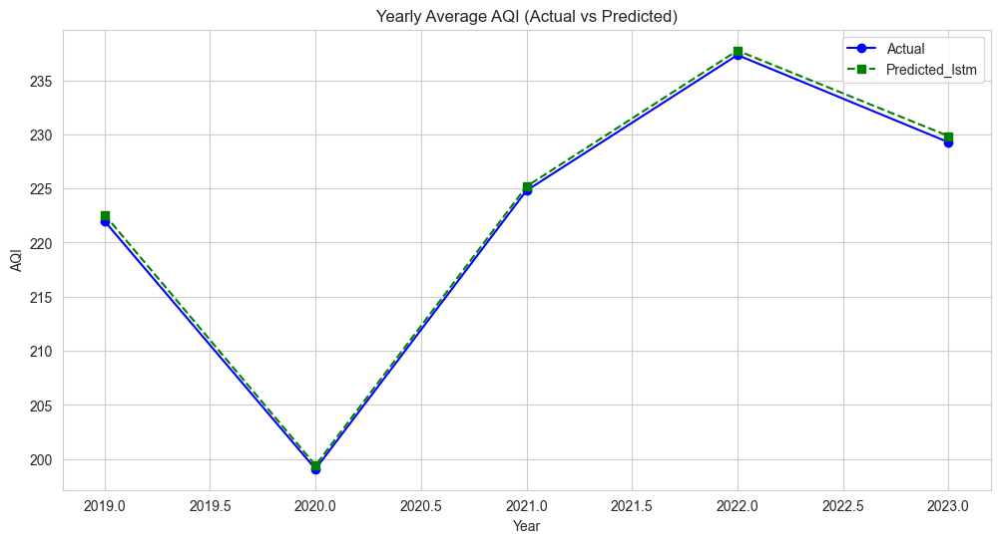

In [139]:
# Group by year and calculate the mean for each year
yearly_mean_df_lstm = results_df_lstm.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_lstm.index, yearly_mean_df_lstm['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_lstm.index, yearly_mean_df_lstm['Predicted_lstm'], marker='s', linestyle='--', color='green', label='Predicted_lstm')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

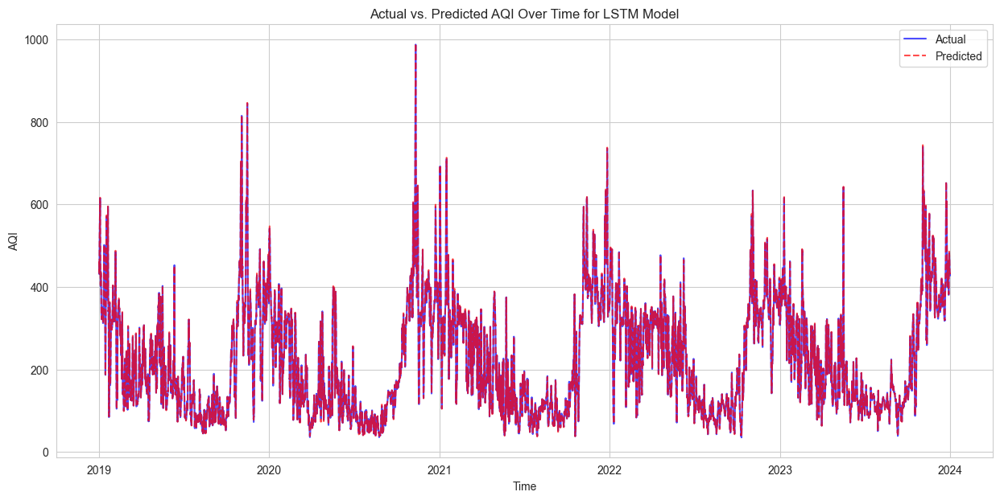

In [140]:
# Ensure the DataFrame is sorted by the datetime index
results_df_lstm.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_lstm.index, results_df_lstm['Actual'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_lstm.index, results_df_lstm['Predicted_lstm'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for LSTM Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()

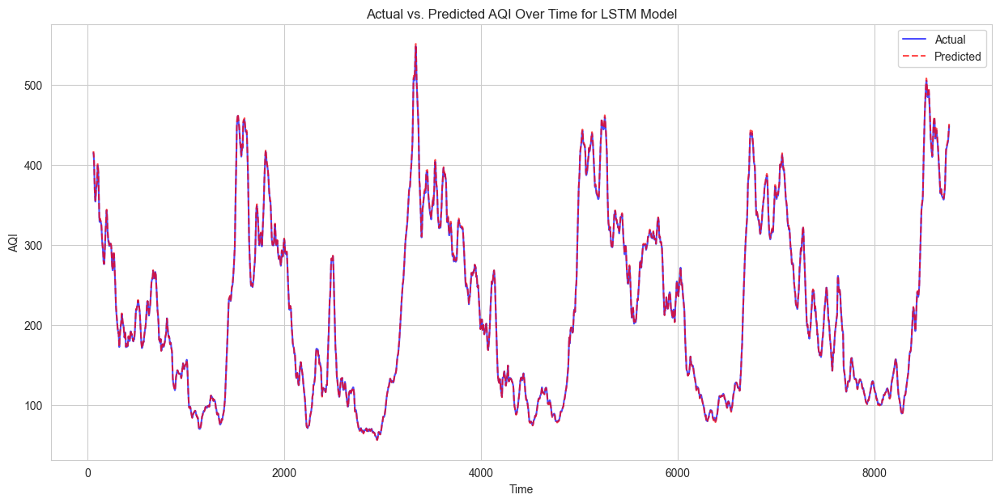

In [141]:
# Sort the DataFrame just in case the index is not in order.
results_df_rf.sort_index(inplace=True)
results_df_lstm.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  # for example, a weekly rolling average
results_df_lstm['Actual_smooth'] = results_df_lstm['Actual'].rolling(window=rolling_window_size).mean()
results_df_lstm['Predicted_lstm_smooth'] = results_df_lstm['Predicted_lstm'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_lstm.index, results_df_lstm['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_lstm.index, results_df_lstm['Predicted_lstm_smooth'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for LSTM Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


#### GRU

Start time (GRU): 2024-04-27 07:14:31
Epoch 1/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 21224.5977 - val_loss: 548.7759
Epoch 2/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 458.9842 - val_loss: 276.1112
Epoch 3/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 240.0181 - val_loss: 178.5397
Epoch 4/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 165.5036 - val_loss: 125.4938
Epoch 5/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 110.2733 - val_loss: 80.3046
Epoch 6/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 67.8562 - val_loss: 45.8936
Epoch 7/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 43.9931 - val_loss: 31.7604
Epoch 8/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 30.5276 - val_loss: 23.7463
Epoch 9/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 22.8447 - val_loss: 30.1241
Epoch 10/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 19.0719 - val_loss: 22.3327
Epoch 11/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss

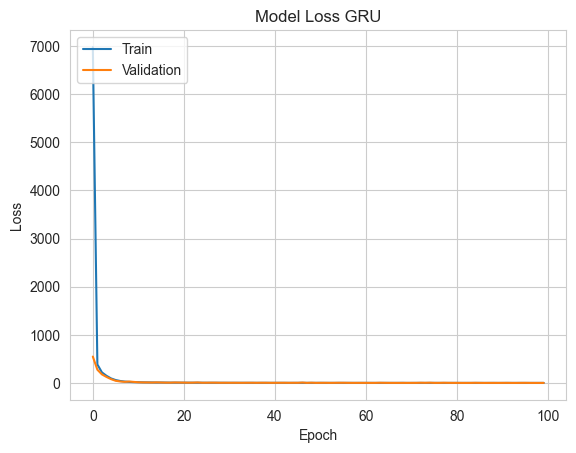

274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 819us/step - loss: 1.6704
Test Loss: 1.6996345520019531
274/274 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Mean Absolute Error (MAE) of GRU: 0.96
Mean Squared Error (MSE) of GRU: 1.70
Root Mean Squared Error (RMSE) of GRU: 1.30
R-squared (R²) of GRU: 0.9999014346467267
End time (GRU): 2024-04-27 07:18:26
Total execution time (GRU): 234.88363528251648 seconds


In [142]:
import time
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
# Start time
start_time_GRU = time.time()
print("Start time (GRU):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(start_time_GRU)))
# Defining the model
model_GRU = Sequential()
model_GRU.add(GRU(units=64, activation='relu', return_sequences=True, input_shape=(X_train_scaled_shaped.shape[1], 
                                                                                   X_train_scaled_shaped.shape[2])))
model_GRU.add(GRU(units=128, activation='relu', return_sequences=True))
model_GRU.add(GRU(units=32, activation='relu'))
model_GRU.add(Dense(1))
# Compile the model
model_GRU.compile(optimizer='adam', loss='mean_squared_error')
#Training the model
history = model_GRU.fit(X_train_scaled_shaped, y_train, epochs=100, verbose=1, batch_size=32, validation_split=0.2)
# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss GRU')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Evaluate the model on the test set
test_loss = model_GRU.evaluate(X_test_scaled_shaped, y_test, verbose=1)
print(f'Test Loss: {test_loss}')
# Making predictions
y_pred_gru = model_GRU.predict(X_test_scaled_shaped)

# Reshape y_pred_gru if it doesn't match the shape of y_test
if y_pred_gru.ndim > 1:
    y_pred_gru = y_pred_gru.reshape(-1)
# Performance Metrics
mae_GRU = mean_absolute_error(y_test, y_pred_gru)
mse_GRU = mean_squared_error(y_test, y_pred_gru)
rmse_GRU = np.sqrt(mse_GRU)
r2_GRU = r2_score(y_test, y_pred_gru)

print(f"Mean Absolute Error (MAE) of GRU: {mae_GRU:.2f}")
print(f"Mean Squared Error (MSE) of GRU: {mse_GRU:.2f}")
print(f"Root Mean Squared Error (RMSE) of GRU: {rmse_GRU:.2f}")
print(f"R-squared (R²) of GRU: {r2_GRU:}")

# End time
end_time_GRU = time.time()
print("End time (GRU):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end_time_GRU)))
# Total execution time
execution_time_GRU = end_time_GRU - start_time_GRU
print("Total execution time (GRU):", execution_time_GRU, "seconds")


In [143]:
# Creating a Series from the numpy array 'y_pred_gru' with the index matching 'y_test'
y_pred_series_gru = pd.Series(y_pred_gru, index=y_test.index, name='Predicted_gru')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_gru = pd.concat([y_test.rename('Actual'), y_pred_series_gru], axis=1)

results_df_gru.head()

,Actual,Predicted_gru
Timestamp,,
2019-05-05 08:00:00,156.660714,158.315887
2021-11-25 05:00:00,405.657051,405.609467
2021-11-08 12:00:00,419.735577,418.242645
2019-10-28 08:00:00,397.748397,396.658112
2019-06-04 12:00:00,164.652778,166.538940


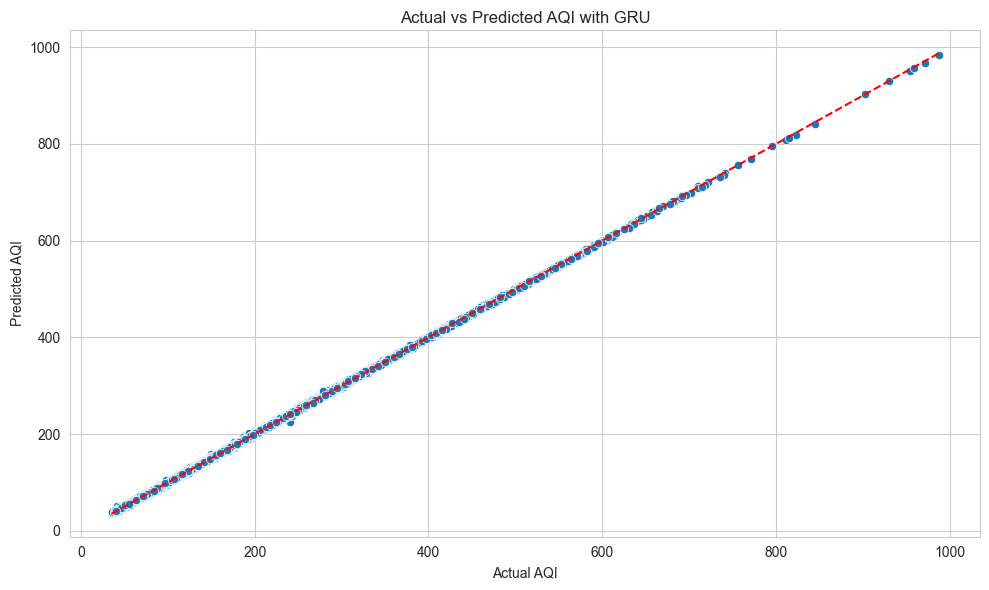

In [144]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_gru', data=results_df_gru)
plt.title('Actual vs Predicted AQI with GRU')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_gru.min().min(), results_df_gru.max().max()], [results_df_gru.min().min(), results_df_gru.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

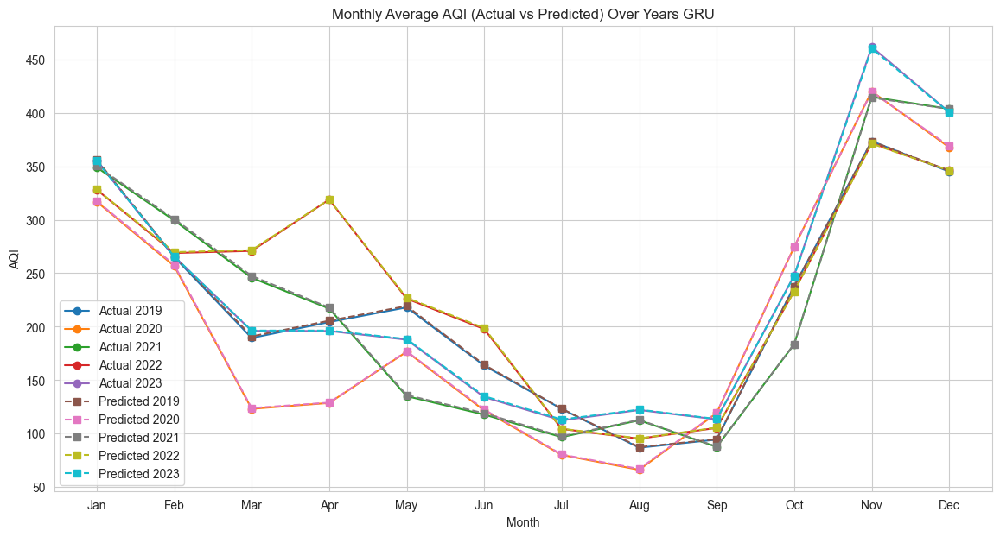

In [145]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_gru['Year'] = results_df_gru.index.year
results_df_gru['Month'] = results_df_gru.index.month

# Group by year and month and calculate the mean
monthly_mean_df_gru = results_df_gru.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_gru.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_gru.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_gru.pivot(index='Month', columns='Year', values='Predicted_gru')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years GRU')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

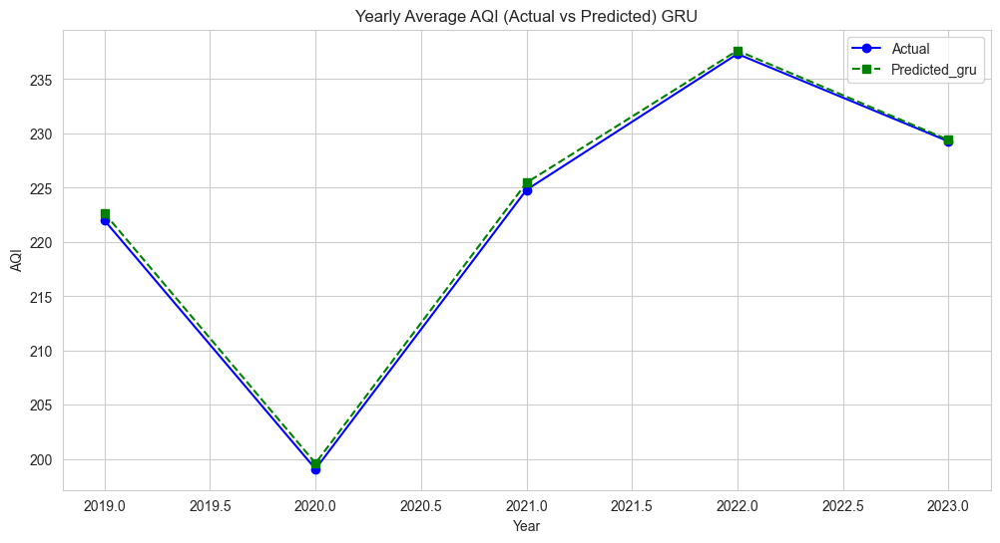

In [146]:
# Group by year and calculate the mean for each year
yearly_mean_df_gru = results_df_gru.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_gru.index, yearly_mean_df_gru['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_gru.index, yearly_mean_df_gru['Predicted_gru'], marker='s', linestyle='--', color='green', label='Predicted_gru')

plt.title('Yearly Average AQI (Actual vs Predicted) GRU')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

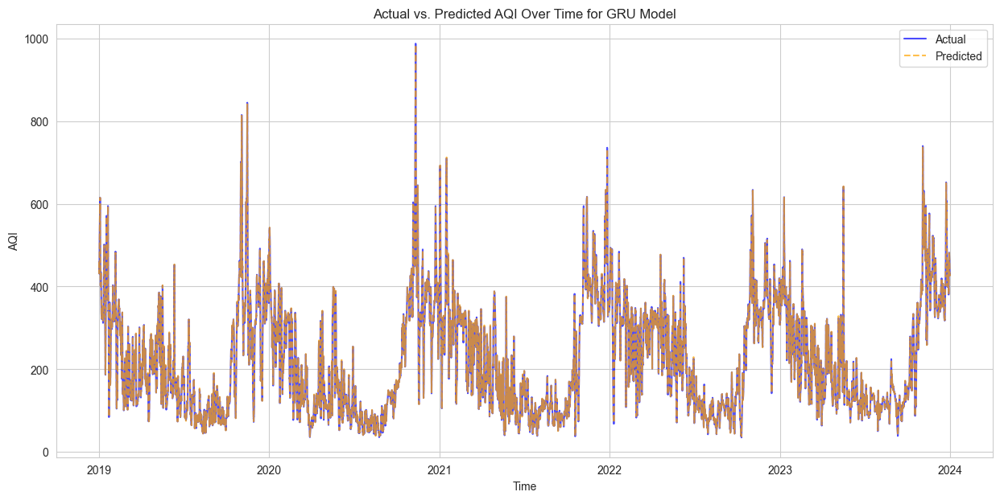

In [147]:
# Ensure the DataFrame is sorted by the datetime index
results_df_gru.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_gru.index, results_df_gru['Actual'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_gru.index, results_df_gru['Predicted_gru'], label='Predicted', color='orange', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for GRU Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()

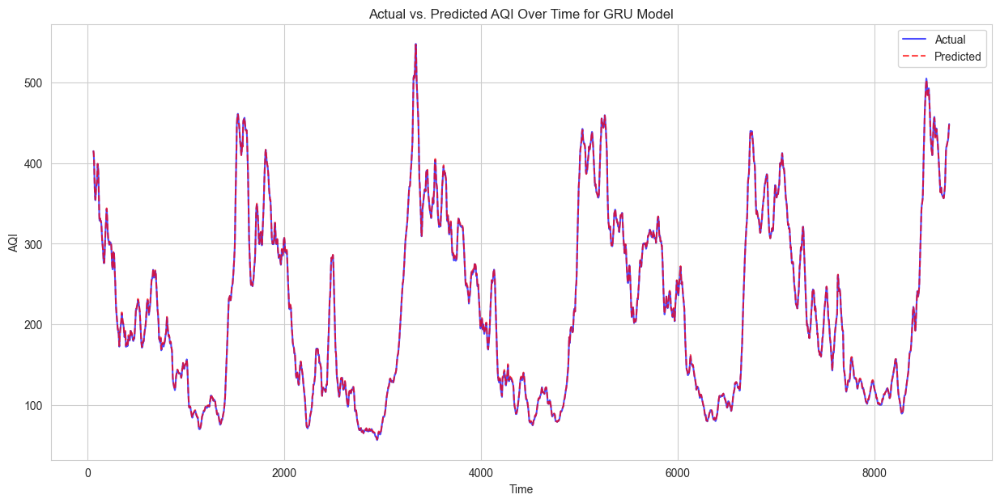

In [148]:
# Sort the DataFrame just in case the index is not in order.
results_df_rf.sort_index(inplace=True)
results_df_gru.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  # for example, a weekly rolling average
results_df_gru['Actual_smooth'] = results_df_gru['Actual'].rolling(window=rolling_window_size).mean()
results_df_gru['Predicted_gru_smooth'] = results_df_gru['Predicted_gru'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_gru.index, results_df_gru['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_gru.index, results_df_gru['Predicted_gru_smooth'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for GRU Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


### MLP

Epoch 1/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 19699.8398 - mae: 88.1192 - mse: 19699.8516 - val_loss: 709.7397 - val_mae: 19.8241 - val_mse: 706.3583
Epoch 2/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 994us/step - loss: 533.8437 - mae: 17.1161 - mse: 533.8442 - val_loss: 325.7769 - val_mae: 13.4023 - val_mse: 326.0266
Epoch 3/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - loss: 288.2448 - mae: 12.5318 - mse: 288.2453 - val_loss: 233.3089 - val_mae: 11.0579 - val_mse: 233.4426
Epoch 4/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - loss: 208.3346 - mae: 10.6391 - mse: 208.3344 - val_loss: 159.2789 - val_mae: 9.1165 - val_mse: 159.6733
Epoch 5/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 854us/step - loss: 147.3495 - mae: 8.9173 - mse: 147.3497 - val_loss: 111.5797 - val_mae: 7.8325 - val_mse: 112.0350
Epoch 6/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 889us/step - loss: 99.3725 - mae: 7.3637 - mse: 99.3726 - val_loss: 69.4285 - val_mae: 6.1533 - val_mse: 69.7142
Epoch 7/100
877/877 ━━━━━━━━━

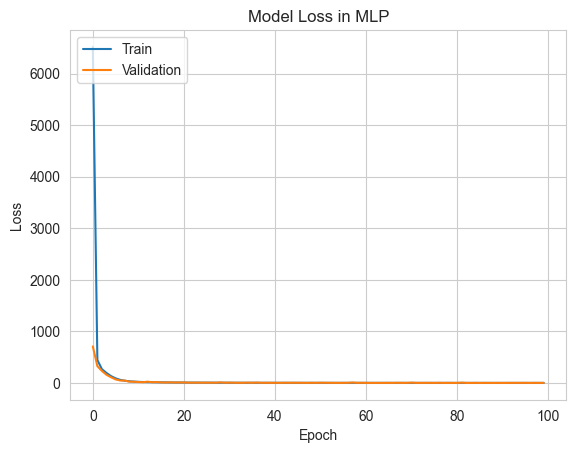

274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 611us/step - loss: 2.0101 - mae: 1.0373 - mse: 2.0101
Test Loss: 1.9823795557022095, Test MAE: 1.0307766199111938, Test MSE: 1.9825105667114258
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 705us/step
Mean Absolute Error (MAE) of MLP: 1.03
Mean Squared Error (MSE) of MLP: 1.98
Root Mean Squared Error (RMSE) of MLP: 1.41
R-squared (R²) of MLP: 0.9998850503452875


In [149]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def build_mlp_model(input_shape):
    model = Sequential([Dense(64, activation='relu', input_shape=input_shape),Dense(128, activation='relu'),
        Dense(32, activation='relu'),Dense(1, activation='linear')])
    return model

# Building and compiling the MLP model
mlp_model = build_mlp_model(input_shape=(X_train_scaled.shape[1],))
mlp_model.compile(optimizer=Adam(), loss=MeanSquaredError(), metrics=['mae', 'mse'])

# Training the model
history = mlp_model.fit(X_train_scaled, y_train,epochs=100,  batch_size=32,validation_split=0.2, verbose=1)
# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss in MLP')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# Evaluate the model on the test set
test_loss, test_mae, test_mse = mlp_model.evaluate(X_test_scaled, y_test, verbose=1)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}, Test MSE: {test_mse}")
# Making predictions
y_pred_mlp = mlp_model.predict(X_test_scaled)

# Performance metrics
mae_mlp = mean_absolute_error(y_test, y_pred_mlp)
mse_mlp = mean_squared_error(y_test, y_pred_mlp)
rmse_mlp = np.sqrt(mse_mlp)
r2_mlp = r2_score(y_test, y_pred_mlp)

print(f"Mean Absolute Error (MAE) of MLP: {mae_mlp:.2f}")
print(f"Mean Squared Error (MSE) of MLP: {mse_mlp:.2f}")
print(f"Root Mean Squared Error (RMSE) of MLP: {rmse_mlp:.2f}")
print(f"R-squared (R²) of MLP: {r2_mlp:}")


In [150]:
# Creating a Series from the numpy array 'y_pred_mlp' with the index matching 'y_test'
y_pred_series_mlp = pd.Series(y_pred_mlp.flatten(), index=y_test.index, name='Predicted_mlp')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_mlp = pd.concat([y_test.rename('Actual'), y_pred_series_mlp], axis=1)

results_df_mlp.head()

,Actual,Predicted_mlp
Timestamp,,
2019-05-05 08:00:00,156.660714,156.450806
2021-11-25 05:00:00,405.657051,406.322906
2021-11-08 12:00:00,419.735577,421.236359
2019-10-28 08:00:00,397.748397,398.931427
2019-06-04 12:00:00,164.652778,164.444672


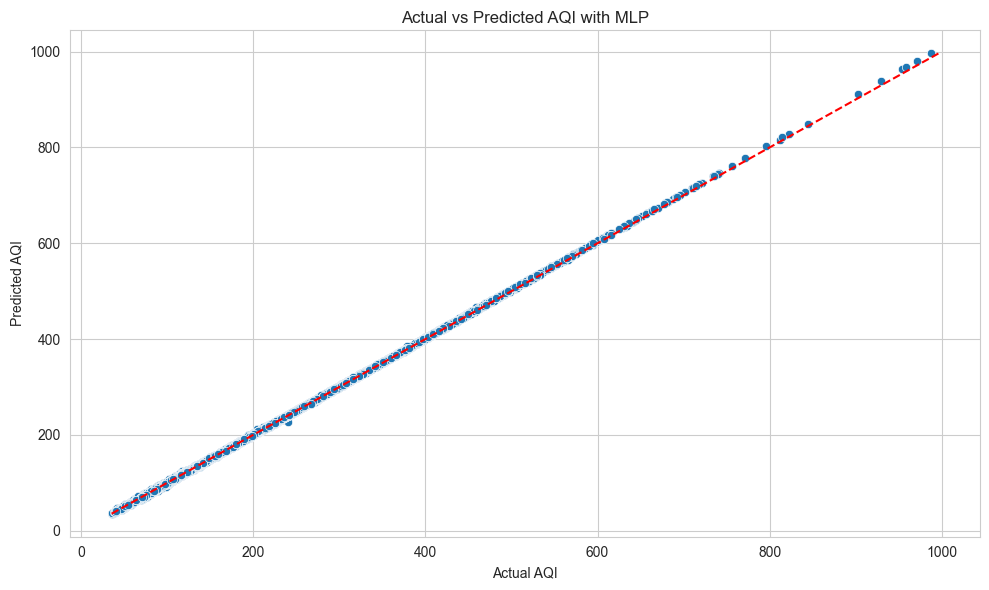

In [151]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_mlp', data=results_df_mlp)
plt.title('Actual vs Predicted AQI with MLP')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_mlp.min().min(), results_df_mlp.max().max()], [results_df_mlp.min().min(), results_df_mlp.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

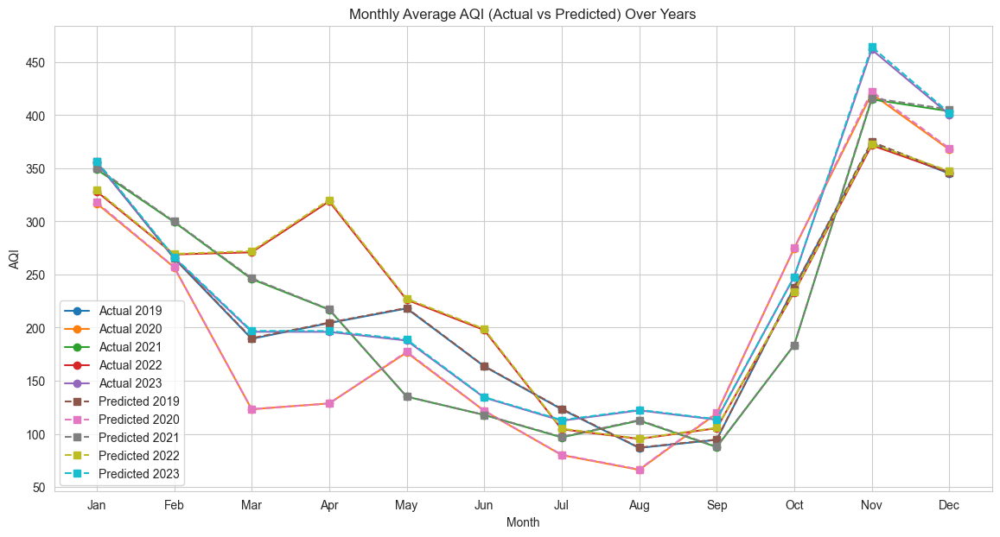

In [152]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_mlp['Year'] = results_df_mlp.index.year
results_df_mlp['Month'] = results_df_mlp.index.month

# Group by year and month and calculate the mean
monthly_mean_df_mlp = results_df_mlp.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_mlp.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_mlp.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_mlp.pivot(index='Month', columns='Year', values='Predicted_mlp')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

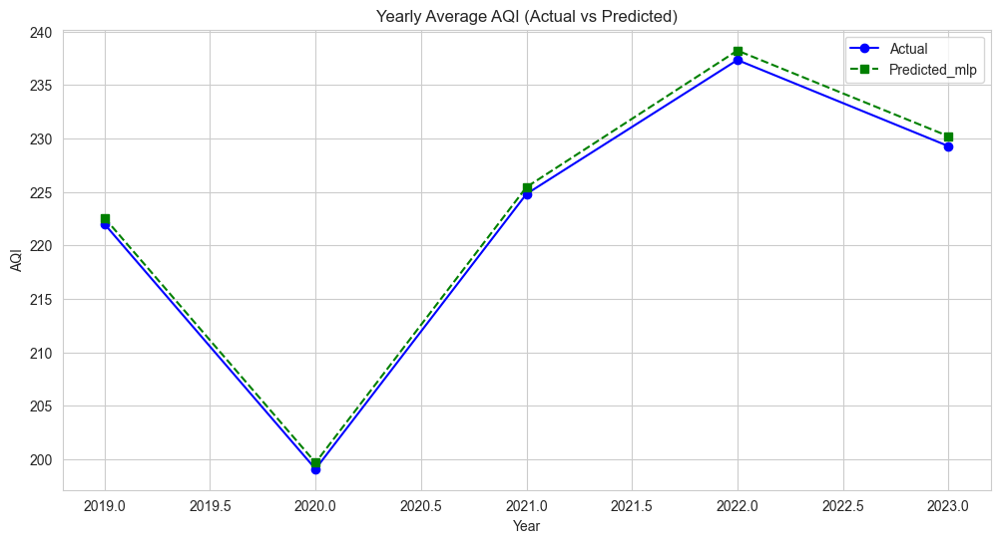

In [153]:
# Group by year and calculate the mean for each year
yearly_mean_df_mlp = results_df_mlp.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_mlp.index, yearly_mean_df_mlp['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_mlp.index, yearly_mean_df_mlp['Predicted_mlp'], marker='s', linestyle='--', color='green', label='Predicted_mlp')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

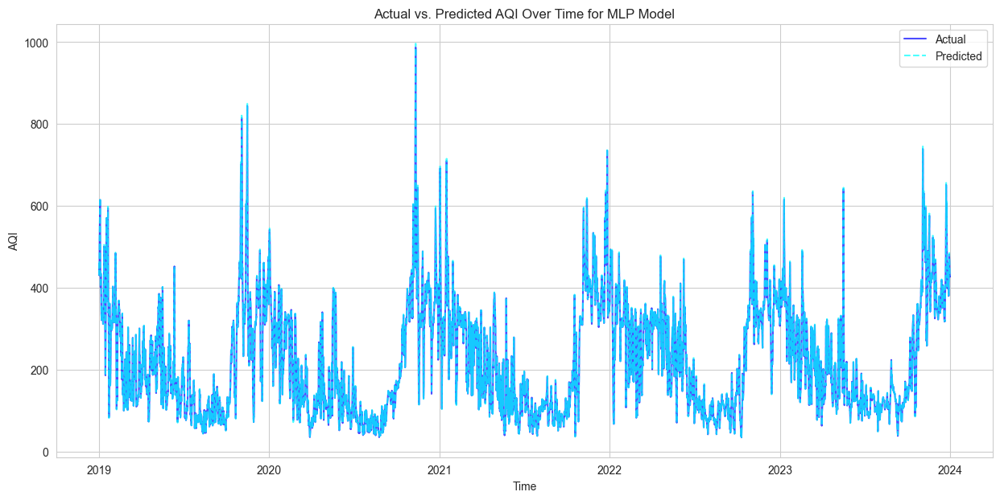

In [154]:
# Ensure the DataFrame is sorted by the datetime index
results_df_mlp.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_mlp.index, results_df_mlp['Actual'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_mlp.index, results_df_mlp['Predicted_mlp'], label='Predicted', color='cyan', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for MLP Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()

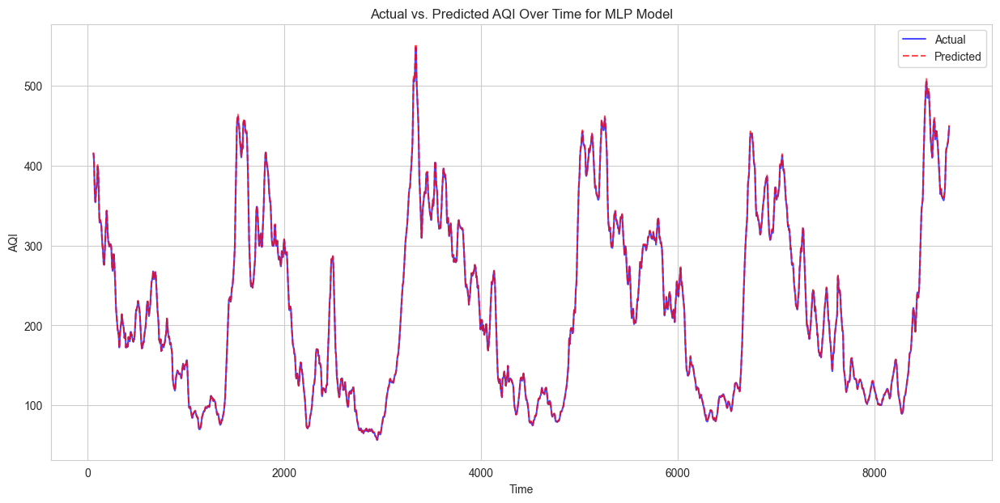

In [155]:
# Sort the DataFrame just in case the index is not in order.
results_df_rf.sort_index(inplace=True)
results_df_mlp.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  
results_df_mlp['Actual_smooth'] = results_df_mlp['Actual'].rolling(window=rolling_window_size).mean()
results_df_mlp['Predicted_mlp_smooth'] = results_df_mlp['Predicted_mlp'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_mlp.index, results_df_mlp['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_mlp.index, results_df_mlp['Predicted_mlp_smooth'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for MLP Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


#### TCN


Epoch 1/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 15606.7178 - mae: 83.7417 - mse: 15606.7295 - val_loss: 614.9129 - val_mae: 18.6126 - val_mse: 616.6596
Epoch 2/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 528.0630 - mae: 17.2497 - mse: 528.0633 - val_loss: 342.6497 - val_mae: 13.3720 - val_mse: 344.0581
Epoch 3/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 320.5964 - mae: 13.1704 - mse: 320.5967 - val_loss: 257.3137 - val_mae: 11.5954 - val_mse: 258.3995
Epoch 4/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 246.3840 - mae: 11.4387 - mse: 246.3843 - val_loss: 171.8719 - val_mae: 9.5006 - val_mse: 172.4615
Epoch 5/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 169.1370 - mae: 9.2899 - mse: 169.1372 - val_loss: 111.1797 - val_mae: 7.6265 - val_mse: 111.6199
Epoch 6/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 102.8042 - mae: 7.0933 - mse: 102.8043 - val_loss: 116.1419 - val_mae: 8.4185 - val_mse: 116.3126
Epoch 7/100
877/877 ━━━━━━━━━━━━━━━

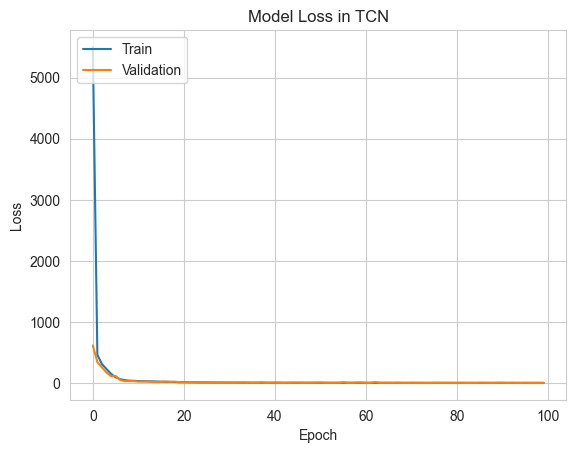

274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step - loss: 1.6966 - mae: 0.9017 - mse: 1.6966
Test Loss: 1.5860744714736938, Test MAE: 0.8921672701835632, Test MSE: 1.5864214897155762
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
Mean Absolute Error (MAE) of TCN: 0.89
Mean Squared Error (MSE) of TCN: 1.59
Root Mean Squared Error (RMSE) of TCN: 1.26
R-squared (R²) of TCN: 0.9999


In [156]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def build_tcn_model(input_shape):
    model = Sequential([
        Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=input_shape),
        Conv1D(filters=64, kernel_size=3, activation='relu'),
        Flatten(),
        Dense(32, activation='relu'),
        Dense(1, activation='linear')
    ])
    return model

# Reshape input data for TCN model
X_train_tcn = X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1))
X_test_tcn = X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))

# Build and train the TCN model
tcn_model = build_tcn_model(input_shape=(X_train_tcn.shape[1], X_train_tcn.shape[2]))
tcn_model.compile(optimizer=Adam(), loss=MeanSquaredError(), metrics=['mae', 'mse'])
tcn_history = tcn_model.fit(X_train_tcn, y_train, epochs=100, validation_split=0.2, verbose=1)

# Plot training & validation loss values
plt.plot(tcn_history.history['loss'])
plt.plot(tcn_history.history['val_loss'])
plt.title('Model Loss in TCN')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Evaluate the model on the test set
test_loss, test_mae, test_mse = tcn_model.evaluate(X_test_tcn, y_test, verbose=1)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}, Test MSE: {test_mse}")

# Making predictions
y_pred_tcn = tcn_model.predict(X_test_tcn)

# Performance metrics
mae_tcn = mean_absolute_error(y_test, y_pred_tcn)
mse_tcn = mean_squared_error(y_test, y_pred_tcn)
rmse_tcn = np.sqrt(mse_tcn)
r2_tcn = r2_score(y_test, y_pred_tcn)

print(f"Mean Absolute Error (MAE) of TCN: {mae_tcn:.2f}")
print(f"Mean Squared Error (MSE) of TCN: {mse_tcn:.2f}")
print(f"Root Mean Squared Error (RMSE) of TCN: {rmse_tcn:.2f}")
print(f"R-squared (R²) of TCN: {r2_tcn:.4f}")


In [157]:
# Performance metrics
mae_tcn = mean_absolute_error(y_test, y_pred_tcn)
mse_tcn = mean_squared_error(y_test, y_pred_tcn)
rmse_tcn = np.sqrt(mse_tcn)
r2_tcn = r2_score(y_test, y_pred_tcn)

print(f"Mean Absolute Error (MAE) of TCN: {mae_tcn:.2f}")
print(f"Mean Squared Error (MSE) of TCN: {mse_tcn:.2f}")
print(f"Root Mean Squared Error (RMSE) of TCN: {rmse_tcn:.2f}")
print(f"R-squared (R²) of TCN: {r2_tcn:}")

Mean Absolute Error (MAE) of TCN: 0.89
Mean Squared Error (MSE) of TCN: 1.59
Root Mean Squared Error (RMSE) of TCN: 1.26
R-squared (R²) of TCN: 0.9999080162519514


In [158]:
# Creating a Series from the numpy array 'y_pred_mlp' with the index matching 'y_test'
y_pred_series_tcn = pd.Series(y_pred_tcn.flatten(), index=y_test.index, name='Predicted_tcn')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_tcn = pd.concat([y_test.rename('Actual'), y_pred_series_tcn], axis=1)

results_df_tcn.head()

,Actual,Predicted_tcn
Timestamp,,
2019-05-05 08:00:00,156.660714,156.254578
2021-11-25 05:00:00,405.657051,404.101898
2021-11-08 12:00:00,419.735577,419.008209
2019-10-28 08:00:00,397.748397,397.841431
2019-06-04 12:00:00,164.652778,164.371613


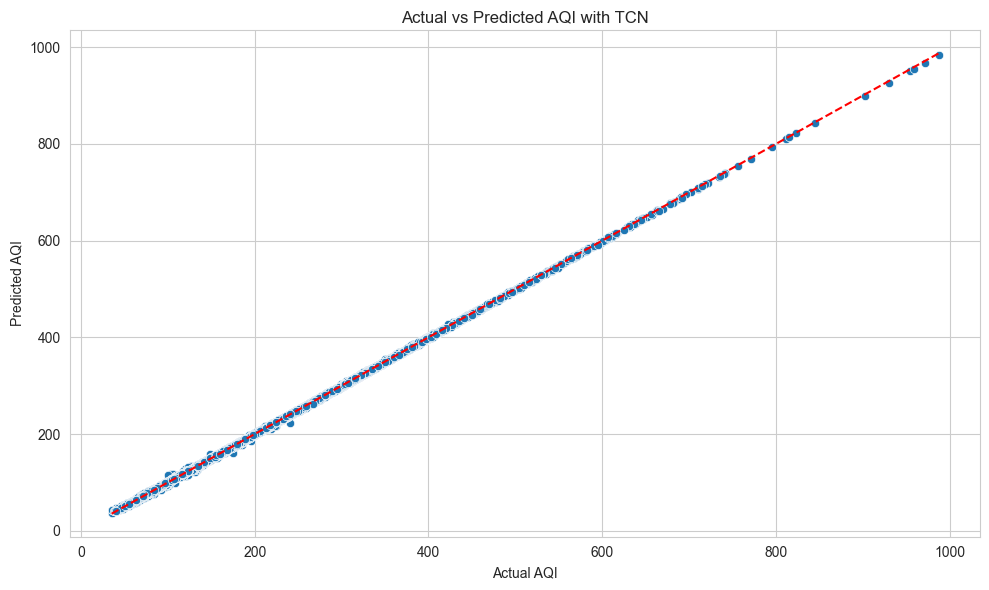

In [159]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_tcn', data=results_df_tcn)
plt.title('Actual vs Predicted AQI with TCN')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_tcn.min().min(), results_df_tcn.max().max()], [results_df_tcn.min().min(), results_df_tcn.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

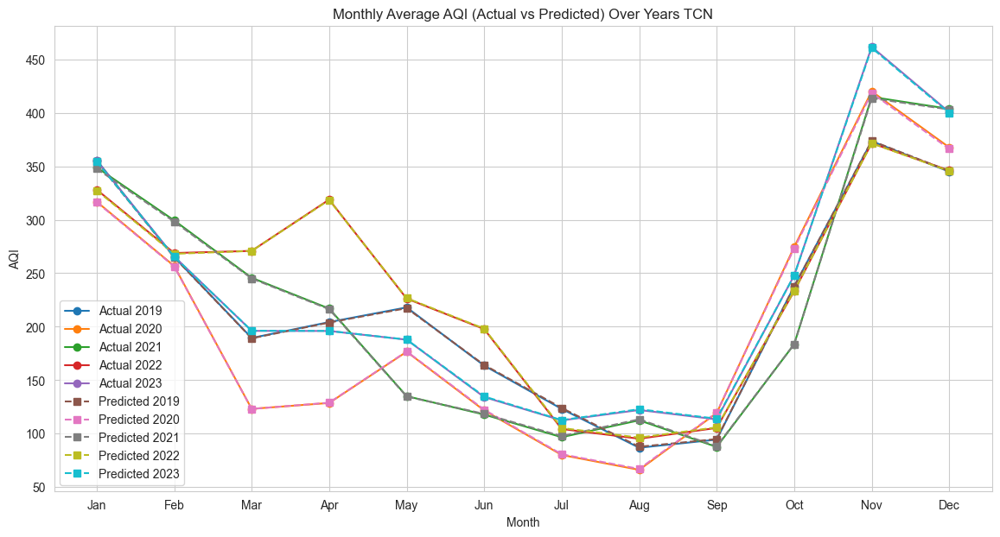

In [160]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_tcn['Year'] = results_df_tcn.index.year
results_df_tcn['Month'] = results_df_tcn.index.month

# Group by year and month and calculate the mean
monthly_mean_df_tcn = results_df_tcn.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_tcn.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_tcn.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_tcn.pivot(index='Month', columns='Year', values='Predicted_tcn')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years TCN')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

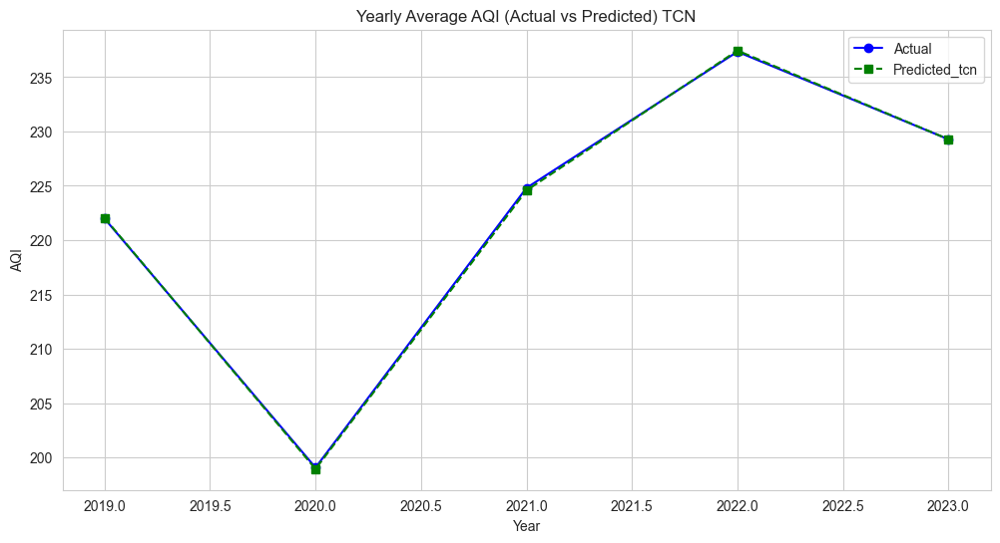

In [161]:
# Group by year and calculate the mean for each year
yearly_mean_df_tcn = results_df_tcn.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_tcn.index, yearly_mean_df_tcn['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_tcn.index, yearly_mean_df_tcn['Predicted_tcn'], marker='s', linestyle='--', color='green', label='Predicted_tcn')

plt.title('Yearly Average AQI (Actual vs Predicted) TCN')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

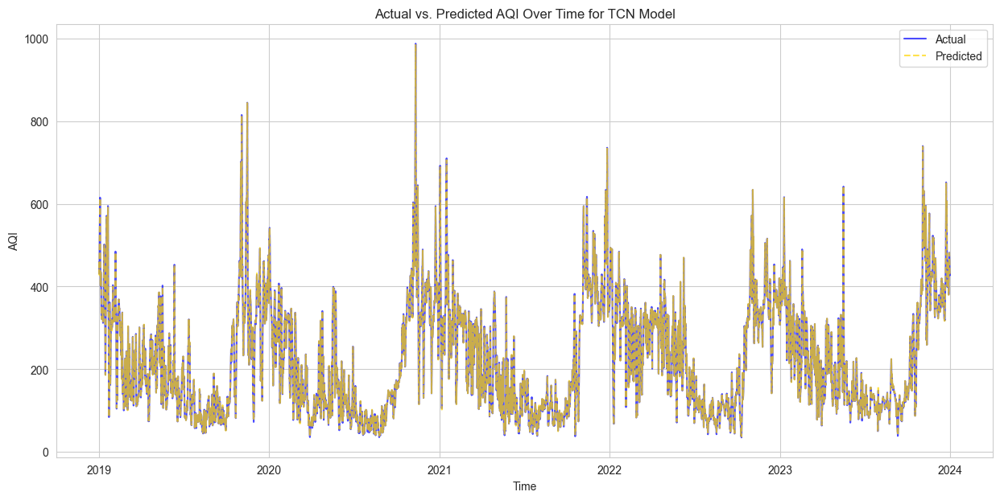

In [162]:
# Ensure the DataFrame is sorted by the datetime index
results_df_tcn.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_tcn.index, results_df_tcn['Actual'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_tcn.index, results_df_tcn['Predicted_tcn'], label='Predicted', color='gold', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for TCN Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()

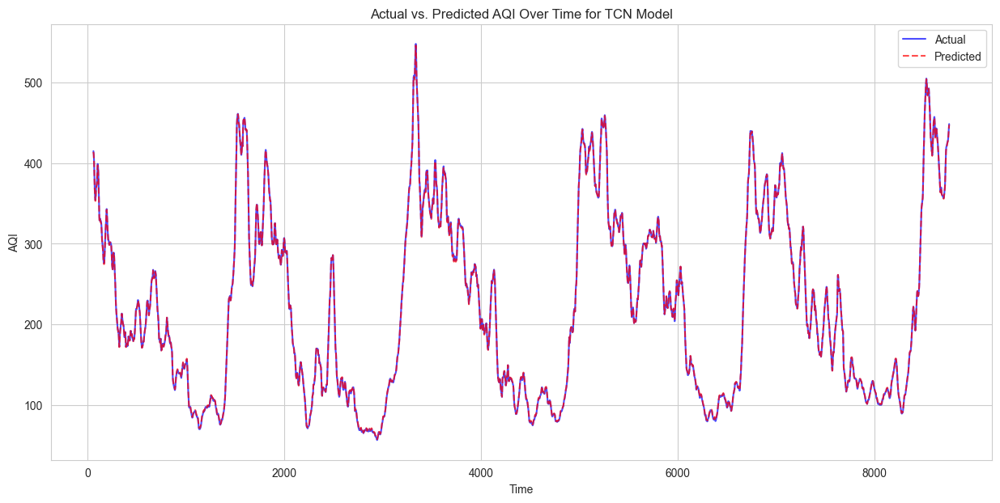

In [163]:
# Sort the DataFrame just in case the index is not in order.
results_df_rf.sort_index(inplace=True)
results_df_tcn.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  # for example, a weekly rolling average
results_df_tcn['Actual_smooth'] = results_df_tcn['Actual'].rolling(window=rolling_window_size).mean()
results_df_tcn['Predicted_tcn_smooth'] = results_df_tcn['Predicted_tcn'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_tcn.index, results_df_tcn['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_tcn.index, results_df_tcn['Predicted_tcn_smooth'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for TCN Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


### BILSTM

Start time (BiLSTM): 2024-04-27 07:23:10
Epoch 1/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 19854.1523 - val_loss: 524.9189
Epoch 2/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 416.1519 - val_loss: 228.6189
Epoch 3/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 201.6212 - val_loss: 145.2214
Epoch 4/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 128.9541 - val_loss: 92.9113
Epoch 5/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 87.4880 - val_loss: 63.1307
Epoch 6/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 58.2046 - val_loss: 53.7630
Epoch 7/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 43.3476 - val_loss: 42.3966
Epoch 8/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 32.8036 - val_loss: 29.2564
Epoch 9/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 28.9003 - val_loss: 26.8818
Epoch 10/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 22.3341 - val_loss: 54.9655
Epoch 11/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - lo

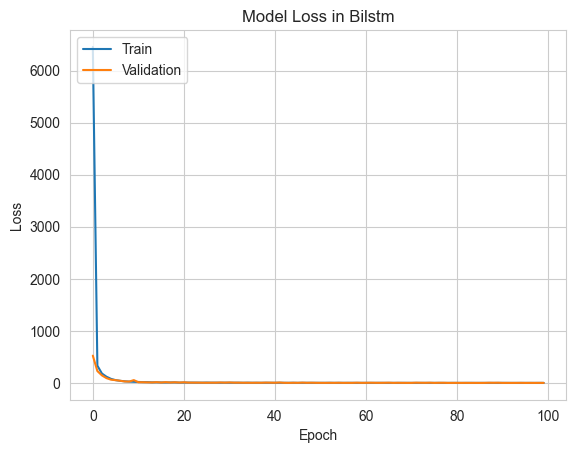

274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.4184
274/274 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
Mean Absolute Error (MAE) of BiLSTM: 0.88
Mean Squared Error (MSE) of BiLSTM: 1.44
Root Mean Squared Error (RMSE) of BiLSTM: 1.20
R-squared (R²) of BiLSTM: 0.9999
End time (BiLSTM): 2024-04-27 07:29:12
Total execution time (BiLSTM): 361.8951504230499 seconds


In [164]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense
import time
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Start time
start_time_bilstm = time.time()
print("Start time (BiLSTM):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(start_time_bilstm)))

# Defining the model
model_bilstm = Sequential()
model_bilstm.add(Bidirectional(LSTM(units=64, activation='relu', return_sequences=True), 
                               input_shape=(X_train_scaled_shaped.shape[1], X_train_scaled_shaped.shape[2])))
model_bilstm.add(Bidirectional(LSTM(units=128, activation='relu', return_sequences=True)))
model_bilstm.add(Bidirectional(LSTM(units=32, activation='relu')))
model_bilstm.add(Dense(1))
# Compiling the model
model_bilstm.compile(optimizer='adam', loss='mean_squared_error')
# Training the model
bilstm_history=model_bilstm.fit(X_train_scaled_shaped, y_train, epochs=100, verbose=1,validation_split=0.2, batch_size=32)
# Plot training & validation loss values
plt.plot(bilstm_history.history['loss'])
plt.plot(bilstm_history.history['val_loss'])
plt.title('Model Loss in Bilstm')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()
# Evaluate the model
model_bilstm.evaluate(X_test_scaled_shaped, y_test, verbose=1)

# Predictions
y_pred_bilstm = model_bilstm.predict(X_test_scaled_shaped)

## Measuring Performance
mae_bilstm = mean_absolute_error(y_test, y_pred_bilstm)
mse_bilstm = mean_squared_error(y_test, y_pred_bilstm)
rmse_bilstm = np.sqrt(mse_bilstm)
r2_bilstm = r2_score(y_test, y_pred_bilstm)

print(f"Mean Absolute Error (MAE) of BiLSTM: {mae_bilstm:.2f}")
print(f"Mean Squared Error (MSE) of BiLSTM: {mse_bilstm:.2f}")
print(f"Root Mean Squared Error (RMSE) of BiLSTM: {rmse_bilstm:.2f}")
print(f"R-squared (R²) of BiLSTM: {r2_bilstm:.4f}")

# End time
end_time_bilstm = time.time()
print("End time (BiLSTM):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end_time_bilstm)))

# Total execution time
execution_time_bilstm = end_time_bilstm - start_time_bilstm
print("Total execution time (BiLSTM):", execution_time_bilstm, "seconds")


In [165]:
print(f"R-squared (R²) of BiLSTM: {r2_bilstm:}")

R-squared (R²) of BiLSTM: 0.9999167803659363


In [166]:
# Creating a Series from the numpy array 'y_pred_mlp' with the index matching 'y_test'
y_pred_series_bilstm = pd.Series(y_pred_bilstm.flatten(), index=y_test.index, name='Predicted_bilstm')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_bilstm = pd.concat([y_test.rename('Actual'), y_pred_series_bilstm], axis=1)

results_df_bilstm.head()

,Actual,Predicted_bilstm
Timestamp,,
2019-05-05 08:00:00,156.660714,155.421692
2021-11-25 05:00:00,405.657051,405.833832
2021-11-08 12:00:00,419.735577,419.820038
2019-10-28 08:00:00,397.748397,397.513214
2019-06-04 12:00:00,164.652778,162.970154


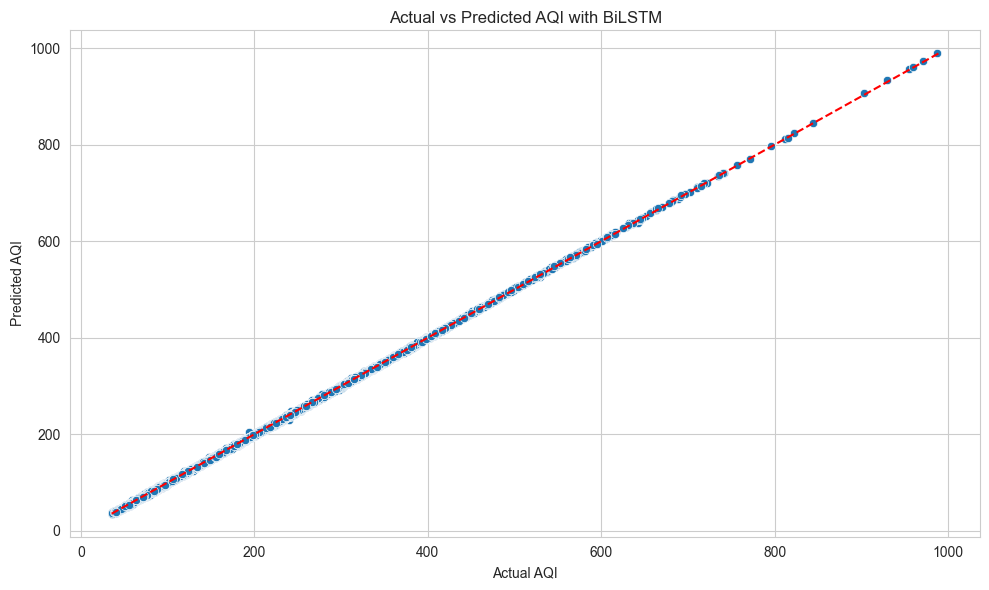

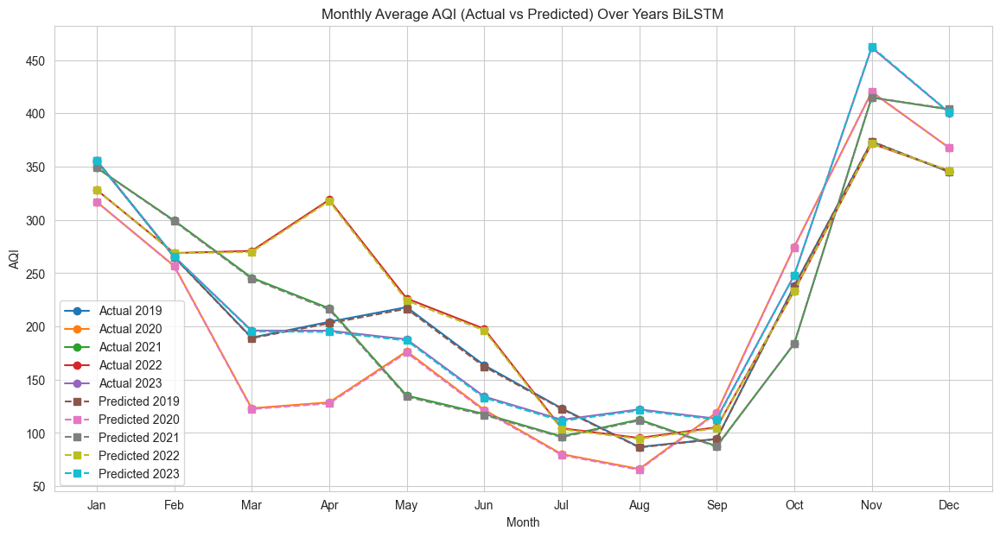

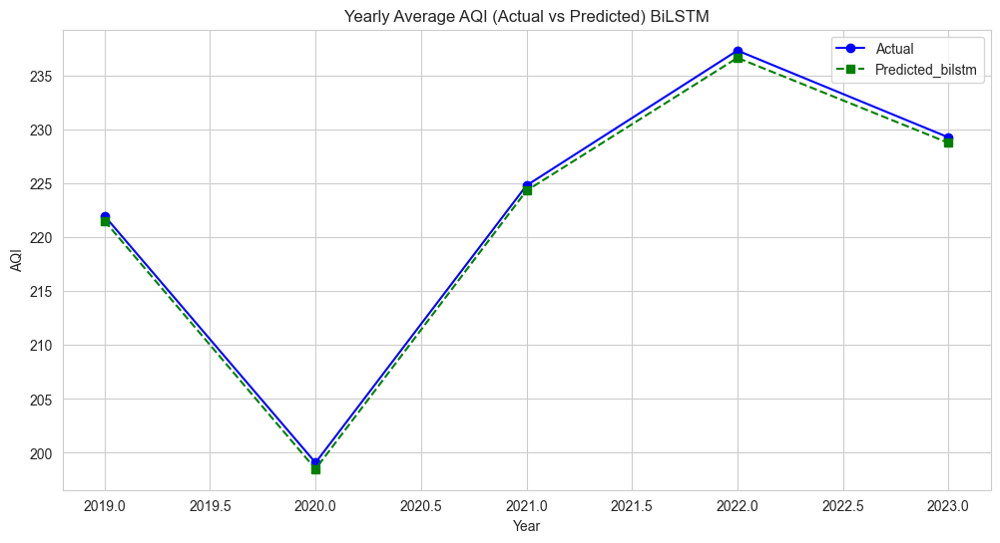

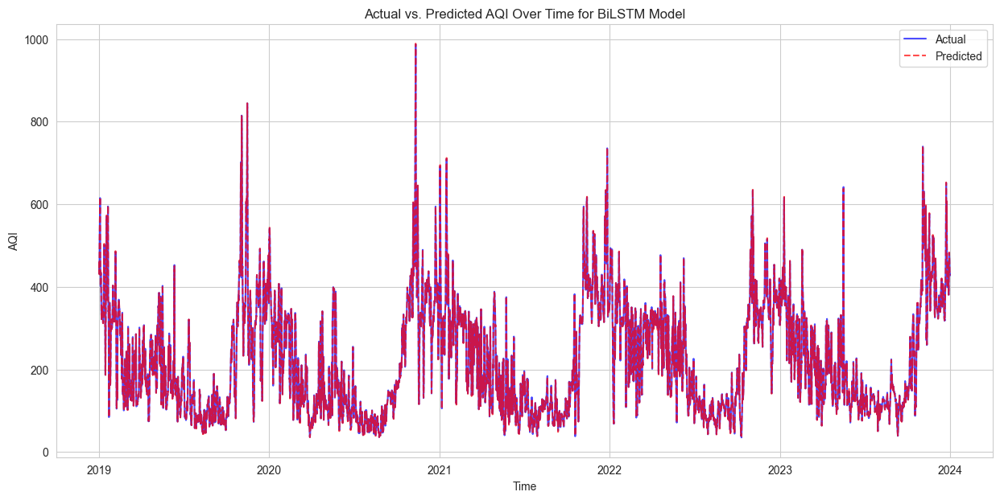

In [167]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_bilstm', data=results_df_bilstm)
plt.title('Actual vs Predicted AQI with BiLSTM')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_bilstm.min().min(), results_df_bilstm.max().max()], [results_df_bilstm.min().min(), results_df_bilstm.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()
# Extract year and month from the index (which is the 'Timestamp')
results_df_bilstm['Year'] = results_df_bilstm.index.year
results_df_bilstm['Month'] = results_df_bilstm.index.month

# Group by year and month and calculate the mean
monthly_mean_df_bilstm = results_df_bilstm.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_bilstm.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_bilstm.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_bilstm.pivot(index='Month', columns='Year', values='Predicted_bilstm')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years BiLSTM')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()
# Group by year and calculate the mean for each year
yearly_mean_df_bilstm = results_df_bilstm.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_bilstm.index, yearly_mean_df_bilstm['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_bilstm.index, yearly_mean_df_bilstm['Predicted_bilstm'], marker='s', linestyle='--', color='green', label='Predicted_bilstm')

plt.title('Yearly Average AQI (Actual vs Predicted) BiLSTM')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()
# Ensure the DataFrame is sorted by the datetime index
results_df_bilstm.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_bilstm.index, results_df_bilstm['Actual'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_bilstm.index, results_df_bilstm['Predicted_bilstm'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for BiLSTM Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()

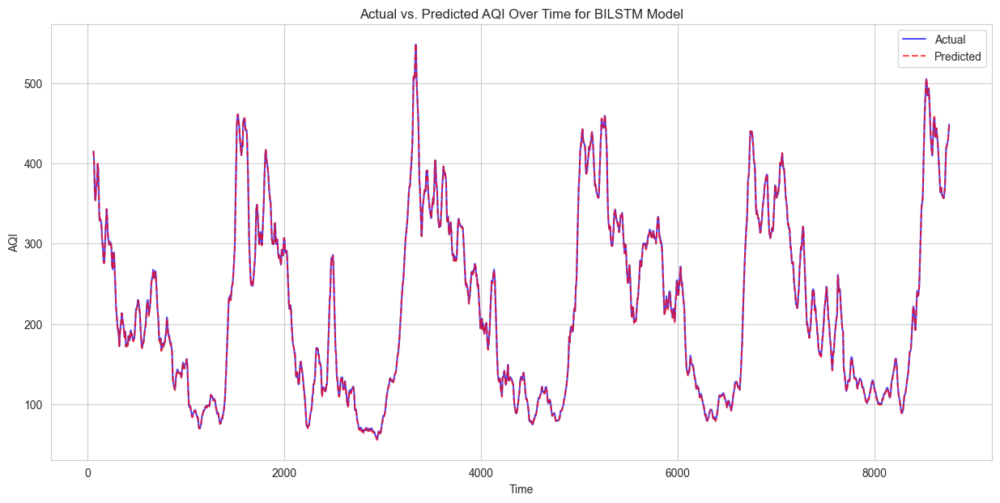

In [168]:
# Sort the DataFrame just in case the index is not in order.
results_df_rf.sort_index(inplace=True)
results_df_bilstm.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  # for example, a weekly rolling average
results_df_bilstm['Actual_smooth'] = results_df_bilstm['Actual'].rolling(window=rolling_window_size).mean()
results_df_bilstm['Predicted_bilstm_smooth'] = results_df_bilstm['Predicted_bilstm'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_bilstm.index, results_df_bilstm['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_bilstm.index, results_df_bilstm['Predicted_bilstm_smooth'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for BILSTM Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


#### OPTIMISED RANDOM FOREST, HYPERPARAMETER TUNING

In [149]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Defining the parameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],    # Minimum number of samples required at each leaf node
    'bootstrap': [True, False]        # Whether bootstrap samples are used when building trees
}

# Initialising the RandomForestRegressor
rf_model = RandomForestRegressor()

# Initialising the GridSearchCV
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, 
                           scoring='neg_mean_squared_error')

# Fiting the GridSearchCV to the training data
grid_search.fit(X_train_scaled, y_train)

# Printing the best parameters found
print("Best parameters found: ", grid_search.best_params_)

# Using the best model to predict on the test data
y_pred_rftuned = grid_search.predict(X_test_scaled)

# Calculating performance metrics
mae = mean_absolute_error(y_test, y_pred_rftuned)
mse = mean_squared_error(y_test, y_pred_rftuned)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_rftuned)

print(f"Mean Absolute Error: {mae:.2f}")
print(f"Mean Squared Error: {mse:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared: {r2:.4f}")

Fitting 3 folds for each of 216 candidates, totalling 648 fits
Best parameters found:  {'bootstrap': True, 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Mean Absolute Error: 0.22
Mean Squared Error: 1.00
Root Mean Squared Error: 1.00
R-squared: 0.9999


In [217]:
# Calculating performance metrics
mae = mean_absolute_error(y_test, y_pred_rftuned)
mse = mean_squared_error(y_test, y_pred_rftuned)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_rftuned)

print(f"Mean Absolute Error: {mae:.2f}")
print(f"Mean Squared Error: {mse:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared: {r2:}")

Mean Absolute Error: 0.22
Mean Squared Error: 1.00
Root Mean Squared Error: 1.00
R-squared: 0.999941936249363


In [150]:
# Creating a Series from the numpy array 'y_pred_rftuned' with the index matching 'y_test'
y_pred_series_rftuned = pd.Series(y_pred_rftuned, index=y_test.index, name='Predicted_rftuned')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_rftuned = pd.concat([y_test.rename('Actual'), y_pred_series_rftuned], axis=1)

results_df_rftuned.head()

,Actual,Predicted_rftuned
Timestamp,,
2019-05-05 08:00:00,156.660714,156.664367
2021-11-25 05:00:00,405.657051,405.672658
2021-11-08 12:00:00,419.735577,419.769707
2019-10-28 08:00:00,397.748397,397.743082
2019-06-04 12:00:00,164.652778,164.661389


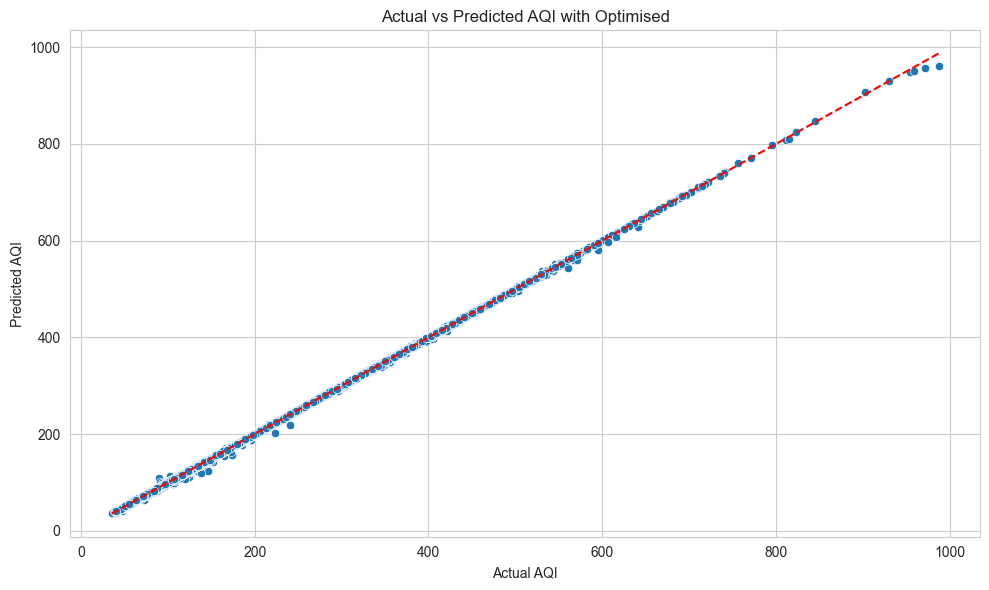

In [151]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_rftuned', data=results_df_rftuned)
plt.title('Actual vs Predicted AQI with Optimised')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_rftuned.min().min(), results_df_rftuned.max().max()], [results_df_rftuned.min().min(), results_df_rftuned.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

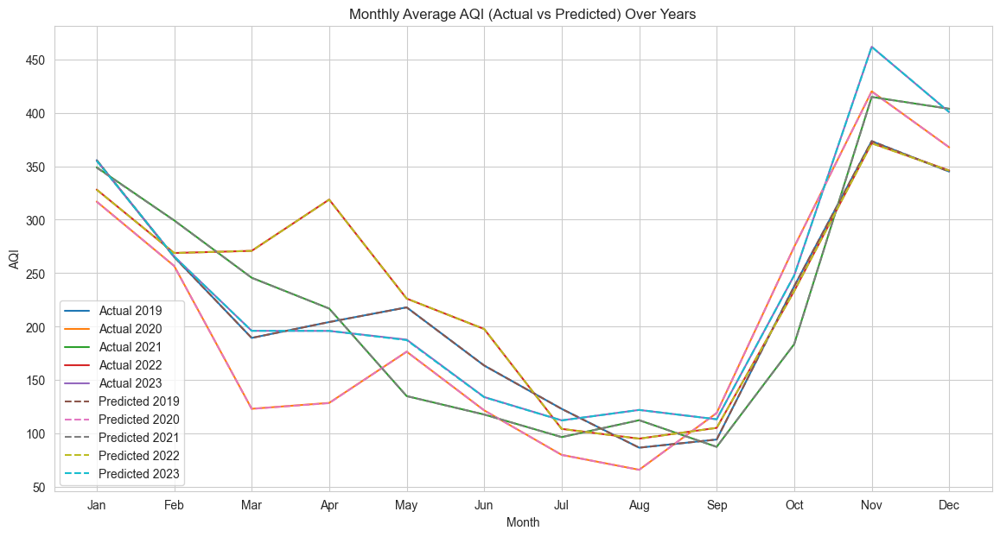

In [152]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_rftuned['Year'] = results_df_rftuned.index.year
results_df_rftuned['Month'] = results_df_rftuned.index.month

# Group by year and month and calculate the mean
monthly_mean_df_rftuned = results_df_rftuned.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_rftuned.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_rftuned.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_rftuned.pivot(index='Month', columns='Year', values='Predicted_rftuned')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

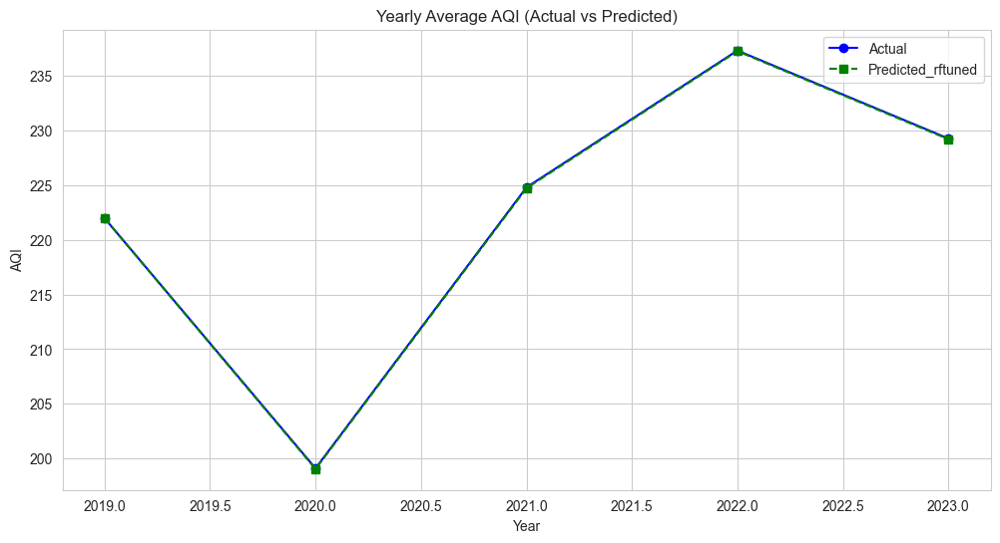

In [153]:
# Group by year and calculate the mean for each year
yearly_mean_df_rftuned = results_df_rftuned.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_rftuned.index, yearly_mean_df_rftuned['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_rftuned.index, yearly_mean_df_rftuned['Predicted_rftuned'], marker='s', linestyle='--', color='green', label='Predicted_rftuned')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

#### OPTIMISED GRADIENT BOOSTING, HYPERPARAMETER TUNING

In [154]:
## from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Define the parameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize the Gradient Boosting Regressor
gbr_model = GradientBoostingRegressor()

# Initialize the GridSearchCV
grid_search_gbr = GridSearchCV(estimator=gbr_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, 
                               scoring='neg_mean_squared_error')

# Fit the GridSearchCV to the training data
grid_search_gbr.fit(X_train_scaled, y_train)

# Print the best parameters found
print("Best parameters found: ", grid_search_gbr.best_params_)

# Use the best model to predict on the test data
y_pred_gbrtuned = grid_search_gbr.predict(X_test_scaled)

# Calculate performance metrics
mae_gbr = mean_absolute_error(y_test, y_pred_gbrtuned)
mse_gbr = mean_squared_error(y_test, y_pred_gbrtuned)
rmse_gbr = np.sqrt(mse_gbr)
r2_gbr = r2_score(y_test, y_pred_gbrtuned)

# Print the performance metrics
print(f"Gradient Boosting Regressor - Mean Absolute Error (MAE): {mae_gbr:.2f}")
print(f"Gradient Boosting Regressor - Mean Squared Error (MSE): {mse_gbr:.2f}")
print(f"Gradient Boosting Regressor - Root Mean Squared Error (RMSE): {rmse_gbr:.2f}")
print(f"Gradient Boosting Regressor - R-squared (R²): {r2_gbr:.4f}")


Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters found:  {'learning_rate': 0.1, 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Gradient Boosting Regressor - Mean Absolute Error (MAE): 0.99
Gradient Boosting Regressor - Mean Squared Error (MSE): 2.87
Gradient Boosting Regressor - Root Mean Squared Error (RMSE): 1.69
Gradient Boosting Regressor - R-squared (R²): 0.9998


In [261]:
# Calculate performance metrics
mae_gbr = mean_absolute_error(y_test, y_pred_gbrtuned)
mse_gbr = mean_squared_error(y_test, y_pred_gbrtuned)
rmse_gbr = np.sqrt(mse_gbr)
r2_gbr = r2_score(y_test, y_pred_gbrtuned)

# Print the performance metrics
print(f"Gradient Boosting Regressor - Mean Absolute Error (MAE): {mae_gbr:.2f}")
print(f"Gradient Boosting Regressor - Mean Squared Error (MSE): {mse_gbr:.2f}")
print(f"Gradient Boosting Regressor - Root Mean Squared Error (RMSE): {rmse_gbr:.2f}")
print(f"Gradient Boosting Regressor - R-squared (R²): {r2_gbr:}")

Gradient Boosting Regressor - Mean Absolute Error (MAE): 0.99
Gradient Boosting Regressor - Mean Squared Error (MSE): 2.87
Gradient Boosting Regressor - Root Mean Squared Error (RMSE): 1.69
Gradient Boosting Regressor - R-squared (R²): 0.9998337664016083


In [155]:
# Creating a Series from the numpy array 'y_pred_gbrtuned' with the index matching 'y_test'
y_pred_series_gbrtuned = pd.Series(y_pred_gbrtuned, index=y_test.index, name='Predicted_gbrtuned')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_gbrtuned = pd.concat([y_test.rename('Actual'), y_pred_series_gbrtuned], axis=1)

results_df_gbrtuned.head()

,Actual,Predicted_gbrtuned
Timestamp,,
2019-05-05 08:00:00,156.660714,154.773740
2021-11-25 05:00:00,405.657051,405.976010
2021-11-08 12:00:00,419.735577,419.176909
2019-10-28 08:00:00,397.748397,398.079993
2019-06-04 12:00:00,164.652778,163.939477


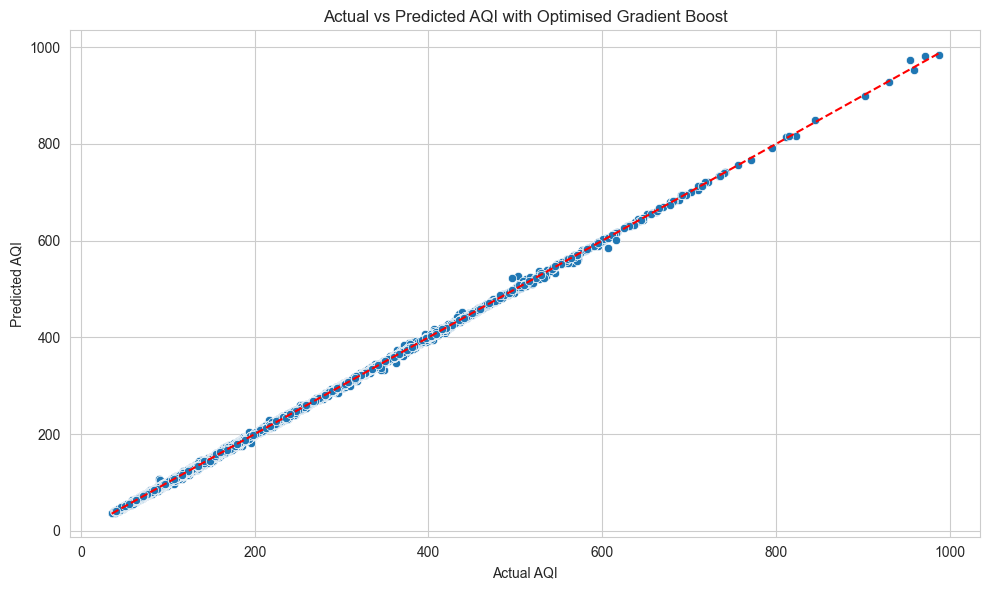

In [156]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_gbrtuned', data=results_df_gbrtuned)
plt.title('Actual vs Predicted AQI with Optimised Gradient Boost')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_gbrtuned.min().min(), results_df_gbrtuned.max().max()], [results_df_gbrtuned.min().min(), results_df_gbrtuned.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

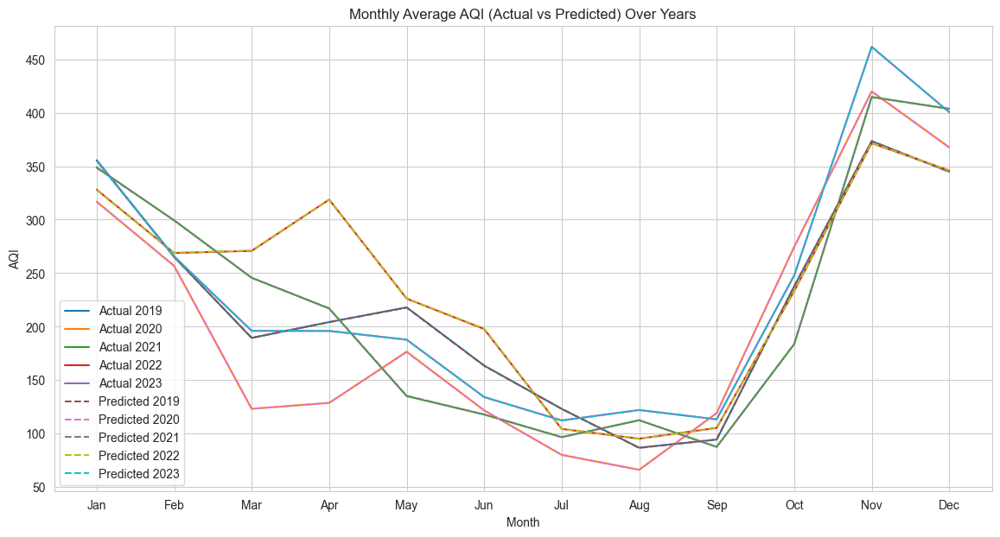

In [157]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_gbrtuned['Year'] = results_df_gbrtuned.index.year
results_df_gbrtuned['Month'] = results_df_gbrtuned.index.month

# Group by year and month and calculate the mean
monthly_mean_df_gbrtuned = results_df_gbrtuned.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_gbrtuned.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_gbrtuned.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_gbrtuned.pivot(index='Month', columns='Year', values='Predicted_gbrtuned')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

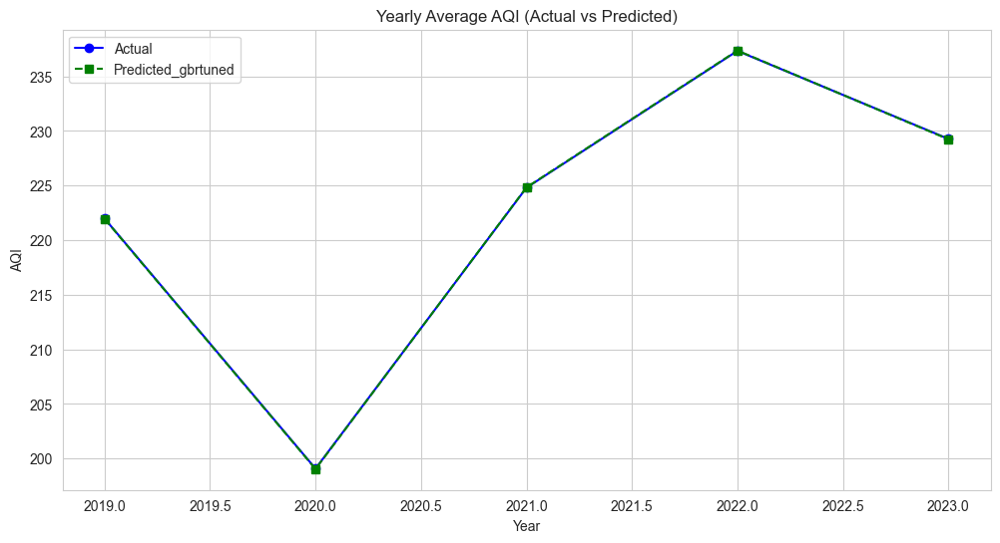

In [158]:
# Group by year and calculate the mean for each year
yearly_mean_df_gbrtuned = results_df_gbrtuned.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_gbrtuned.index, yearly_mean_df_gbrtuned['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_gbrtuned.index, yearly_mean_df_gbrtuned['Predicted_gbrtuned'], marker='s', linestyle='--', color='green', label='Predicted_gbrtuned')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()


### OPTIMISED eXTREME GRADIENT BOOSTING, HYPERPARAMETER TUNING

In [159]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Defining the parameter grid to search
param_distributions = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6, 7],
    'colsample_bytree': [0.3, 0.5, 0.7, 1.0],
    'subsample': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.5, 1, 2]
}

# Initialising the XGBoost Regressor
xgb_model = xgb.XGBRegressor()

# Initialising the RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=xgb_model, param_distributions=param_distributions, n_iter=100, cv=3, 
                                   verbose=2, random_state=42, n_jobs=-1, scoring='neg_mean_squared_error')

# Fitting the RandomizedSearchCV to the training data
random_search.fit(X_train_scaled, y_train)

# Printing the best parameters found
print("Best parameters found: ", random_search.best_params_)

# Using the best model to predict on the test data
y_pred_xgbtuned = random_search.predict(X_test_scaled)

# Calculating performance metrics
mae_xgb = mean_absolute_error(y_test, y_pred_xgbtuned)
mse_xgb = mean_squared_error(y_test, y_pred_xgbtuned)
rmse_xgb = np.sqrt(mse_xgb)
r2_xgb = r2_score(y_test, y_pred_xgbtuned)

# Printing the performance metrics
print(f"XGBoost Regressor - Mean Absolute Error (MAE): {mae_xgb:.2f}")
print(f"XGBoost Regressor - Mean Squared Error (MSE): {mse_xgb:.2f}")
print(f"XGBoost Regressor - Root Mean Squared Error (RMSE): {rmse_xgb:.2f}")
print(f"XGBoost Regressor - R-squared (R²): {r2_xgb:.4f}")

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters found:  {'subsample': 0.8, 'n_estimators': 400, 'max_depth': 7, 'learning_rate': 0.05, 'gamma': 1, 'colsample_bytree': 1.0}
XGBoost Regressor - Mean Absolute Error (MAE): 0.92
XGBoost Regressor - Mean Squared Error (MSE): 5.10
XGBoost Regressor - Root Mean Squared Error (RMSE): 2.26
XGBoost Regressor - R-squared (R²): 0.9997


In [218]:
# Calculating performance metrics
mae_xgb = mean_absolute_error(y_test, y_pred_xgbtuned)
mse_xgb = mean_squared_error(y_test, y_pred_xgbtuned)
rmse_xgb = np.sqrt(mse_xgb)
r2_xgb = r2_score(y_test, y_pred_xgbtuned)

# Printing the performance metrics
print(f"XGBoost Regressor - Mean Absolute Error (MAE): {mae_xgb:.2f}")
print(f"XGBoost Regressor - Mean Squared Error (MSE): {mse_xgb:.2f}")
print(f"XGBoost Regressor - Root Mean Squared Error (RMSE): {rmse_xgb:.2f}")
print(f"XGBoost Regressor - R-squared (R²): {r2_xgb:}")

XGBoost Regressor - Mean Absolute Error (MAE): 0.92
XGBoost Regressor - Mean Squared Error (MSE): 5.10
XGBoost Regressor - Root Mean Squared Error (RMSE): 2.26
XGBoost Regressor - R-squared (R²): 0.9997044168426802


In [160]:
# Creating a Series from the numpy array 'y_pred_xgbtuned' with the index matching 'y_test'
y_pred_series_xgbtuned = pd.Series(y_pred_xgbtuned, index=y_test.index, name='Predicted_xgbtuned')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_xgbtuned = pd.concat([y_test.rename('Actual'), y_pred_series_xgbtuned], axis=1)

results_df_xgbtuned.head()

,Actual,Predicted_xgbtuned
Timestamp,,
2019-05-05 08:00:00,156.660714,156.638840
2021-11-25 05:00:00,405.657051,405.136108
2021-11-08 12:00:00,419.735577,417.792694
2019-10-28 08:00:00,397.748397,398.937378
2019-06-04 12:00:00,164.652778,164.203537


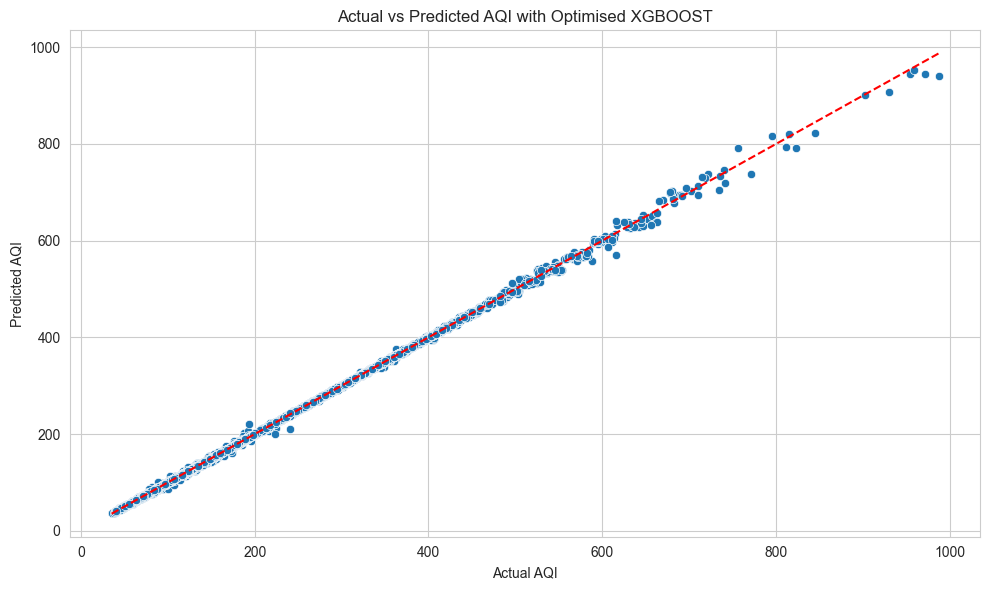

In [161]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_xgbtuned', data=results_df_xgbtuned)
plt.title('Actual vs Predicted AQI with Optimised XGBOOST')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_xgbtuned.min().min(), results_df_xgbtuned.max().max()], [results_df_xgbtuned.min().min(), results_df_xgbtuned.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

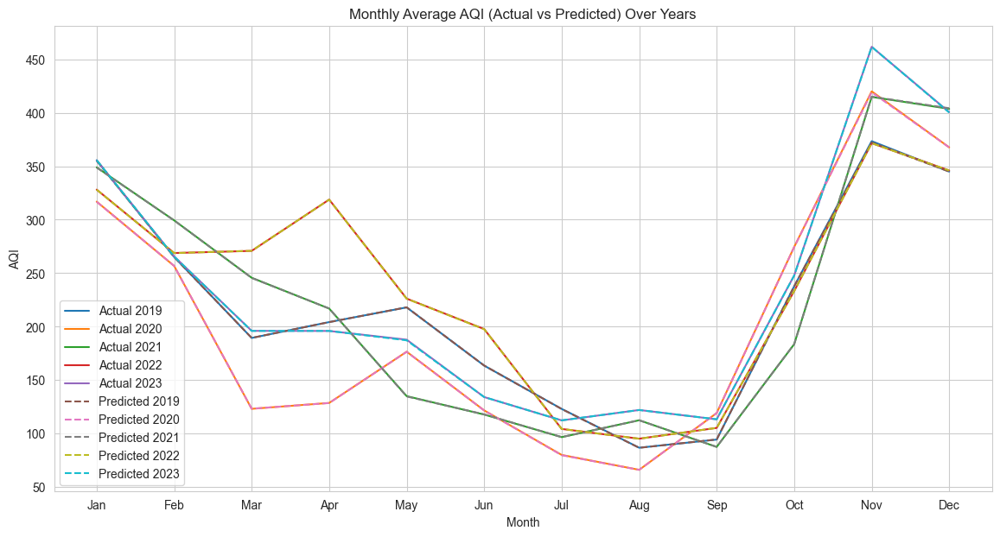

In [162]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_xgbtuned['Year'] = results_df_xgbtuned.index.year
results_df_xgbtuned['Month'] = results_df_xgbtuned.index.month

# Group by year and month and calculate the mean
monthly_mean_df_xgbtuned = results_df_xgbtuned.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_xgbtuned.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_xgbtuned.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_xgbtuned.pivot(index='Month', columns='Year', values='Predicted_xgbtuned')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

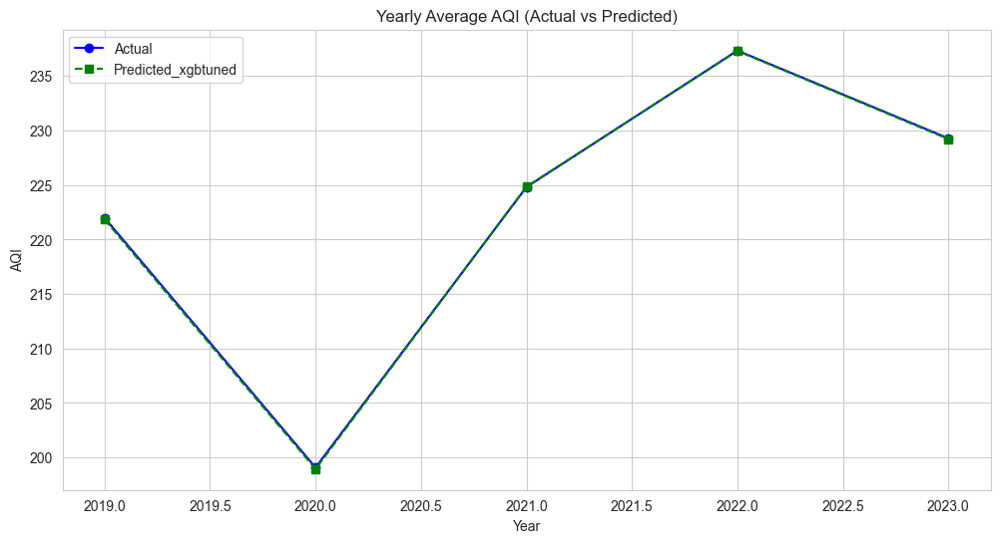

In [163]:
# Group by year and calculate the mean for each year
yearly_mean_df_xgbtuned = results_df_xgbtuned.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_xgbtuned.index, yearly_mean_df_xgbtuned['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_xgbtuned.index, yearly_mean_df_xgbtuned['Predicted_xgbtuned'], marker='s', linestyle='--', color='green', label='Predicted_xgbtuned')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()


#### OPTIMISED KNN, HYPERPARAMETER TUNING

In [164]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Defining the parameter grid to search
param_grid = {
    'n_neighbors': [3, 5, 7, 10, 15],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

# Initialising the KNN Regressor
knn_model = KNeighborsRegressor()

# Initialising the GridSearchCV
grid_search_knn = GridSearchCV(estimator=knn_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, 
                               scoring='neg_mean_squared_error')

# Fitting the GridSearchCV to the scaled training data
grid_search_knn.fit(X_train_scaled, y_train)

# Printing the best parameters found
print("Best parameters found: ", grid_search_knn.best_params_)

# Using the best model to predict on the scaled test data
y_pred_knntuned = grid_search_knn.predict(X_test_scaled)

# Calculating performance metrics
mae_knn = mean_absolute_error(y_test, y_pred_knntuned)
mse_knn = mean_squared_error(y_test, y_pred_knntuned)
rmse_knn = np.sqrt(mse_knn)
r2_knn = r2_score(y_test, y_pred_knntuned)

# Printing the performance metrics
print(f"KNN Regressor - Mean Absolute Error (MAE): {mae_knn:.2f}")
print(f"KNN Regressor - Mean Squared Error (MSE): {mse_knn:.2f}")
print(f"KNN Regressor - Root Mean Squared Error (RMSE): {rmse_knn:.2f}")
print(f"KNN Regressor - R-squared (R²): {r2_knn:.4f}")

Fitting 3 folds for each of 30 candidates, totalling 90 fits
Best parameters found:  {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
KNN Regressor - Mean Absolute Error (MAE): 6.96
KNN Regressor - Mean Squared Error (MSE): 143.55
KNN Regressor - Root Mean Squared Error (RMSE): 11.98
KNN Regressor - R-squared (R²): 0.9917


In [219]:
# Printing the performance metrics
print(f"KNN Regressor - Mean Absolute Error (MAE): {mae_knn:.2f}")
print(f"KNN Regressor - Mean Squared Error (MSE): {mse_knn:.2f}")
print(f"KNN Regressor - Root Mean Squared Error (RMSE): {rmse_knn:.2f}")
print(f"KNN Regressor - R-squared (R²): {r2_knn:}")

KNN Regressor - Mean Absolute Error (MAE): 6.96
KNN Regressor - Mean Squared Error (MSE): 143.55
KNN Regressor - Root Mean Squared Error (RMSE): 11.98
KNN Regressor - R-squared (R²): 0.9916768005142645


In [165]:
# Creating a Series from the numpy array 'y_pred_knntuned' with the index matching 'y_test'
y_pred_series_knntuned = pd.Series(y_pred_knntuned, index=y_test.index, name='Predicted_knntuned')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_knntuned = pd.concat([y_test.rename('Actual'), y_pred_series_knntuned], axis=1)

results_df_knntuned.head()

,Actual,Predicted_knntuned
Timestamp,,
2019-05-05 08:00:00,156.660714,156.974975
2021-11-25 05:00:00,405.657051,406.058969
2021-11-08 12:00:00,419.735577,420.279691
2019-10-28 08:00:00,397.748397,397.888655
2019-06-04 12:00:00,164.652778,169.124920


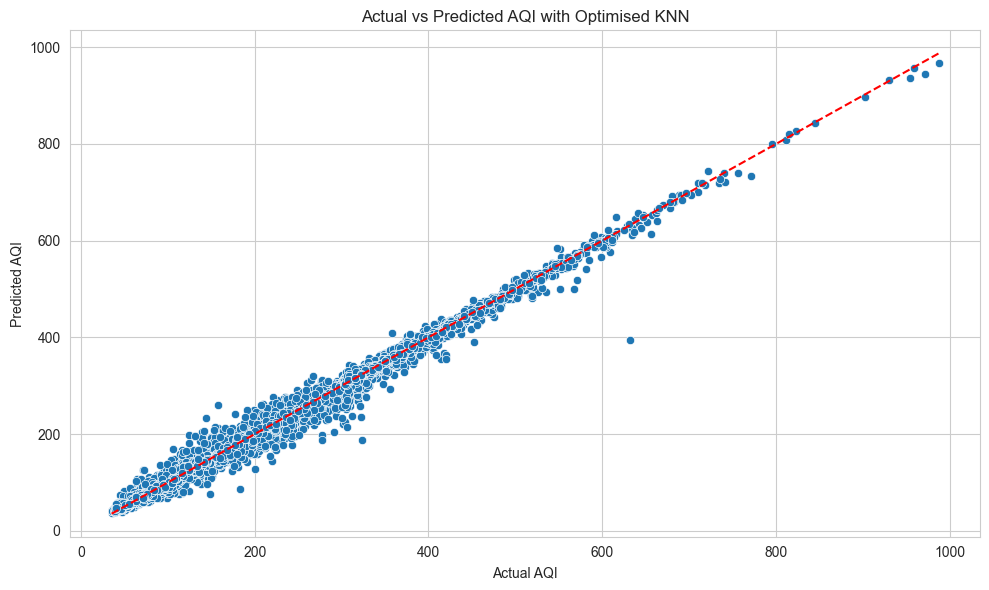

In [166]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_knntuned', data=results_df_knntuned)
plt.title('Actual vs Predicted AQI with Optimised KNN')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_knntuned.min().min(), results_df_knntuned.max().max()], [results_df_knntuned.min().min(), results_df_knntuned.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

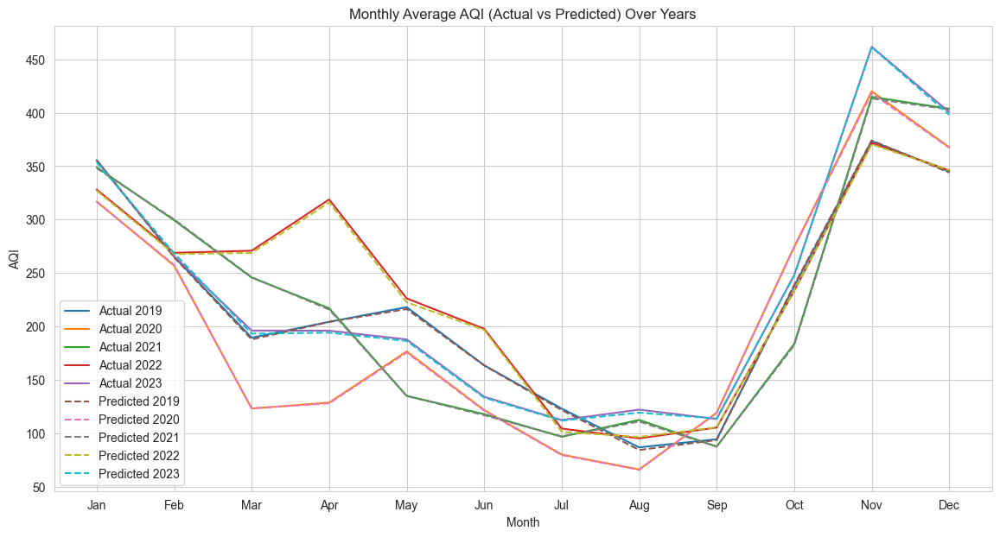

In [167]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_knntuned['Year'] = results_df_knntuned.index.year
results_df_knntuned['Month'] = results_df_knntuned.index.month

# Group by year and month and calculate the mean
monthly_mean_df_knntuned = results_df_knntuned.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_knntuned.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_knntuned.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_knntuned.pivot(index='Month', columns='Year', values='Predicted_knntuned')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

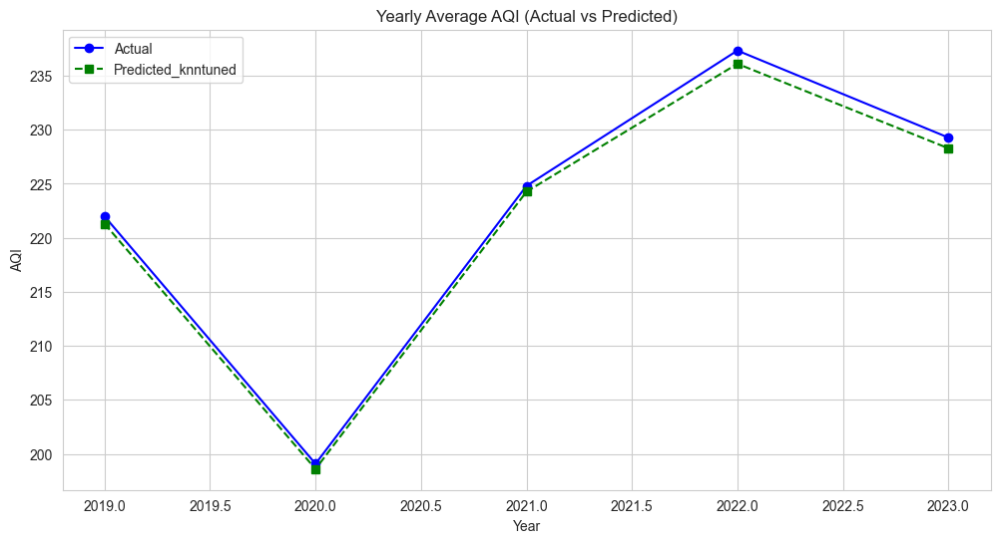

In [168]:
# Group by year and calculate the mean for each year
yearly_mean_df_knntuned = results_df_knntuned.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_knntuned.index, yearly_mean_df_knntuned['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_knntuned.index, yearly_mean_df_knntuned['Predicted_knntuned'], marker='s', linestyle='--', color='green', label='Predicted_knntuned')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

### OPTIMISED DECISION TREE, HYPERPARAMETER TUNING

In [169]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Defining the parameter grid to search
param_grid = {
    'max_depth': [None, 3, 5, 10, 20],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 5, 10],
    'criterion': ['mse', 'friedman_mse', 'mae']
}

# Initialising the Decision Tree Regressor
dt_reg = DecisionTreeRegressor(random_state=42)

# Initialising the GridSearchCV
grid_search_dt = GridSearchCV(estimator=dt_reg, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, 
                              scoring='neg_mean_squared_error')

# Fitting the GridSearchCV to the training data
grid_search_dt.fit(X_train_scaled, y_train)

# Printing the best parameters found
print("Best parameters found: ", grid_search_dt.best_params_)

# Using the best model to predict on the test data
y_pred_dttuned = grid_search_dt.predict(X_test_scaled)

# Calculating performance metrics
mae_dt = mean_absolute_error(y_test, y_pred_dttuned)
mse_dt = mean_squared_error(y_test, y_pred_dttuned)
rmse_dt = np.sqrt(mse_dt)
r2_dt = r2_score(y_test, y_pred_dttuned)

# Printing the performance metrics
print(f"Decision Tree Regressor - Mean Absolute Error (MAE): {mae_dt:.2f}")
print(f"Decision Tree Regressor - Mean Squared Error (MSE): {mse_dt:.2f}")
print(f"Decision Tree Regressor - Root Mean Squared Error (RMSE): {rmse_dt:.2f}")
print(f"Decision Tree Regressor - R-squared (R²): {r2_dt:}")


Fitting 3 folds for each of 240 candidates, totalling 720 fits
Best parameters found:  {'criterion': 'friedman_mse', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}
Decision Tree Regressor - Mean Absolute Error (MAE): 0.33
Decision Tree Regressor - Mean Squared Error (MSE): 2.72
Decision Tree Regressor - Root Mean Squared Error (RMSE): 1.65
Decision Tree Regressor - R-squared (R²): 0.9998


In [259]:
print(f"Decision Tree Regressor - R-squared (R²): {r2_dt:}")

Decision Tree Regressor - R-squared (R²): 0.9998423746504407


In [170]:
# Creating a Series from the numpy array 'y_pred_dttuned' with the index matching 'y_test'
y_pred_series_dttuned = pd.Series(y_pred_dttuned, index=y_test.index, name='Predicted_dttuned')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_dttuned = pd.concat([y_test.rename('Actual'), y_pred_series_dttuned], axis=1)

results_df_dttuned.head()

,Actual,Predicted_dttuned
Timestamp,,
2019-05-05 08:00:00,156.660714,156.625000
2021-11-25 05:00:00,405.657051,405.657051
2021-11-08 12:00:00,419.735577,419.700855
2019-10-28 08:00:00,397.748397,397.732372
2019-06-04 12:00:00,164.652778,164.673611


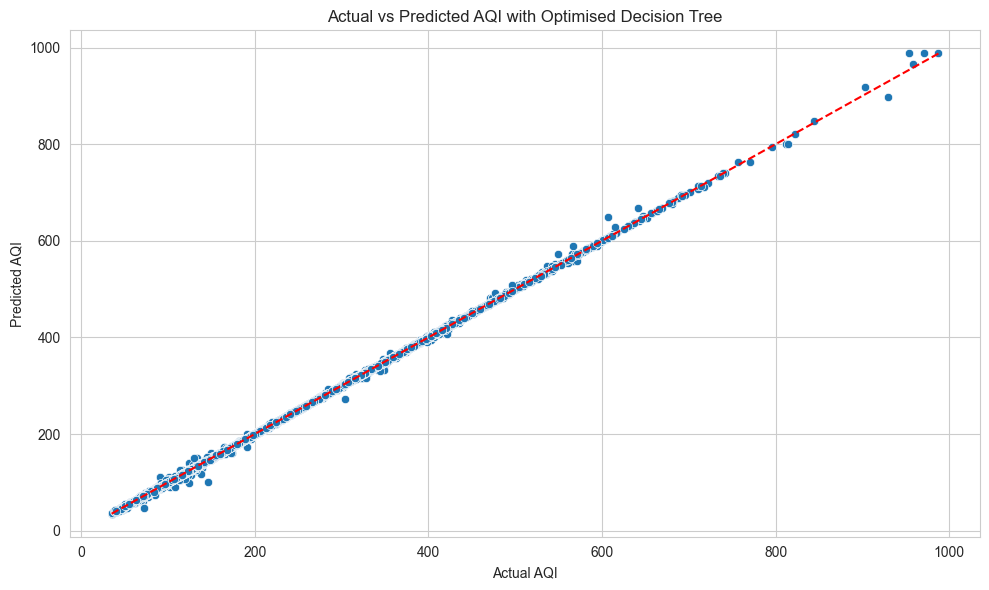

In [171]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_dttuned', data=results_df_dttuned)
plt.title('Actual vs Predicted AQI with Optimised Decision Tree')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_dttuned.min().min(), results_df_dttuned.max().max()], [results_df_dttuned.min().min(), results_df_dttuned.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

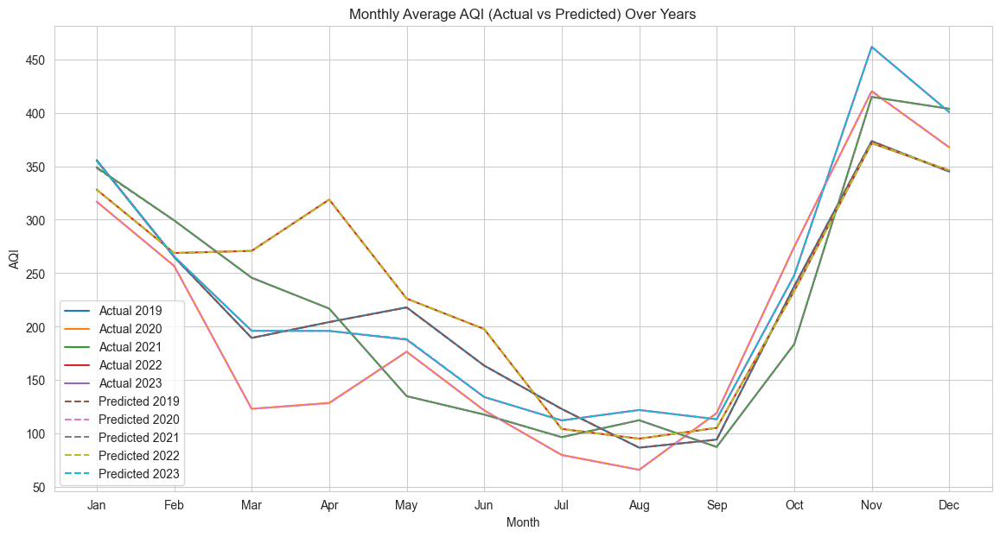

In [172]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_dttuned['Year'] = results_df_dttuned.index.year
results_df_dttuned['Month'] = results_df_dttuned.index.month

# Group by year and month and calculate the mean
monthly_mean_df_dttuned = results_df_dttuned.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_dttuned.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_dttuned.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_dttuned.pivot(index='Month', columns='Year', values='Predicted_dttuned')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

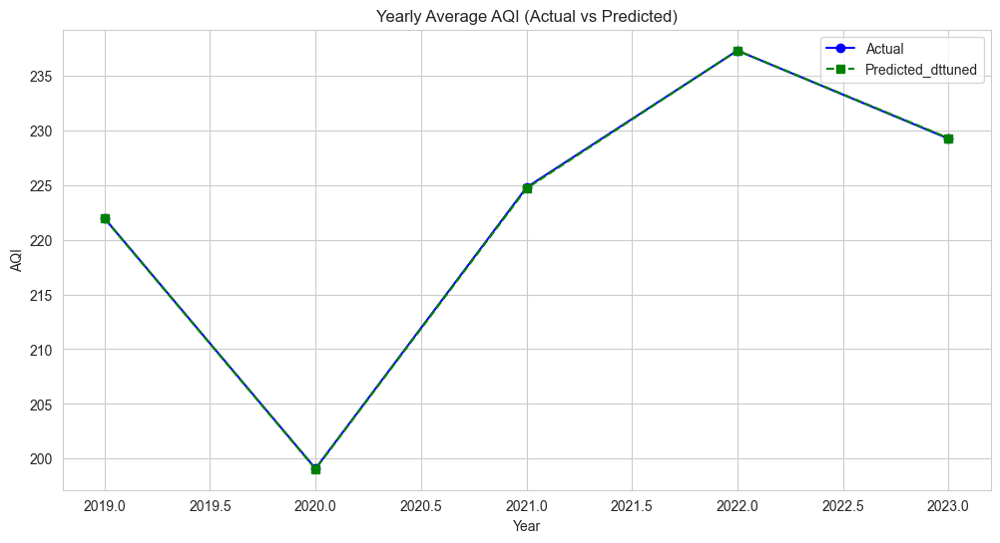

In [173]:
# Group by year and calculate the mean for each year
yearly_mean_df_dttuned = results_df_dttuned.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_dttuned.index, yearly_mean_df_dttuned['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_dttuned.index, yearly_mean_df_dttuned['Predicted_dttuned'], marker='s', linestyle='--', color='green', label='Predicted_dttuned')

plt.title('Yearly Average AQI (Actual vs Predicted)')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

#### OPTIMISED LSTM, HYPERPARAMETER TUNING

#### OPTIMISED GRU, HYPERPARAMETER TUNING

#### OPTIMISED MLP, HYPERPARAMETER TUNING

#### HYBRID MODELLING

In [186]:
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Assuming X_train_scaled, X_test_scaled, y_train, and y_test are already defined
# and scaled accordingly

# Define the base learners
estimators = [
    ('random_forest', RandomForestRegressor(n_estimators=300, max_depth=20, min_samples_split=2, min_samples_leaf=1, 
                                            bootstrap=True, random_state=42 )),
    ('gradient_boosting', GradientBoostingRegressor(n_estimators=300, learning_rate=0.1, max_depth=5, min_samples_split=10, 
                                                    min_samples_leaf=1, random_state=42 ))
]

# Initialize the Stacking Regressor with the base learners and a final regressor
stacking_regressor = StackingRegressor(
    estimators=estimators,
    final_estimator=RandomForestRegressor(random_state=42)
)


# Fit the model on the training data
stacking_regressor.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred_stacked = stacking_regressor.predict(X_test_scaled)

# Calculate performance metrics
mae = mean_absolute_error(y_test, y_pred_stacked)
mse = mean_squared_error(y_test, y_pred_stacked)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_stacked)

# Print the performance metrics
print(f"Hybrid Model - Mean Absolute Error (MAE): {mae:.2f}")
print(f"Hybrid Model - Mean Squared Error (MSE): {mse:.2f}")
print(f"Hybrid Model - Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Hybrid Model - R-squared (R²): {r2:.4f}")


Hybrid Model - Mean Absolute Error (MAE): 0.29
Hybrid Model - Mean Squared Error (MSE): 0.93
Hybrid Model - Root Mean Squared Error (RMSE): 0.96
Hybrid Model - R-squared (R²): 0.9999


In [187]:
# Calculate performance metrics
mae = mean_absolute_error(y_test, y_pred_stacked)
mse = mean_squared_error(y_test, y_pred_stacked)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_stacked)

# Print the performance metrics
print(f"Hybrid Model - Mean Absolute Error (MAE): {mae:.2f}")
print(f"Hybrid Model - Mean Squared Error (MSE): {mse:.2f}")
print(f"Hybrid Model - Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"Hybrid Model - R-squared (R²): {r2:}")

Hybrid Model - Mean Absolute Error (MAE): 0.29
Hybrid Model - Mean Squared Error (MSE): 0.93
Hybrid Model - Root Mean Squared Error (RMSE): 0.96
Hybrid Model - R-squared (R²): 0.9999463311664377


In [188]:
# Creating a Series from the numpy array 'y_pred_stacked' with the index matching 'y_test'
y_pred_series_stacked = pd.Series(y_pred_stacked, index=y_test.index, name='Predicted_stacked')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_stacked = pd.concat([y_test.rename('Actual'), y_pred_series_stacked], axis=1)

results_df_stacked.head()

,Actual,Predicted_stacked
Timestamp,,
2019-05-05 08:00:00,156.660714,156.584346
2021-11-25 05:00:00,405.657051,405.698878
2021-11-08 12:00:00,419.735577,419.742514
2019-10-28 08:00:00,397.748397,397.664183
2019-06-04 12:00:00,164.652778,164.561472


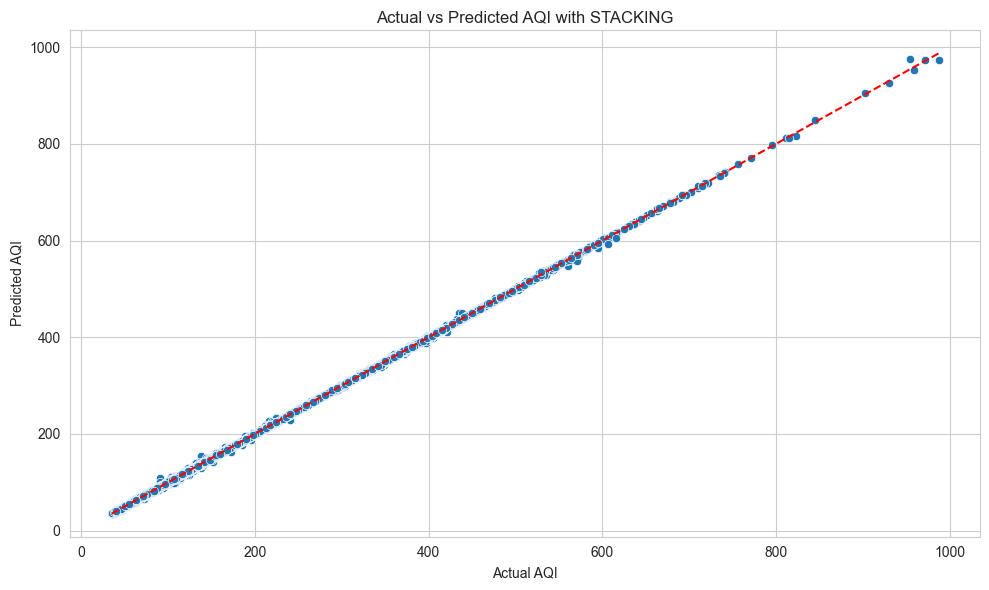

In [189]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_stacked', data=results_df_stacked)
plt.title('Actual vs Predicted AQI with STACKING')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_stacked.min().min(), results_df_stacked.max().max()], [results_df_stacked.min().min(), results_df_stacked.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()

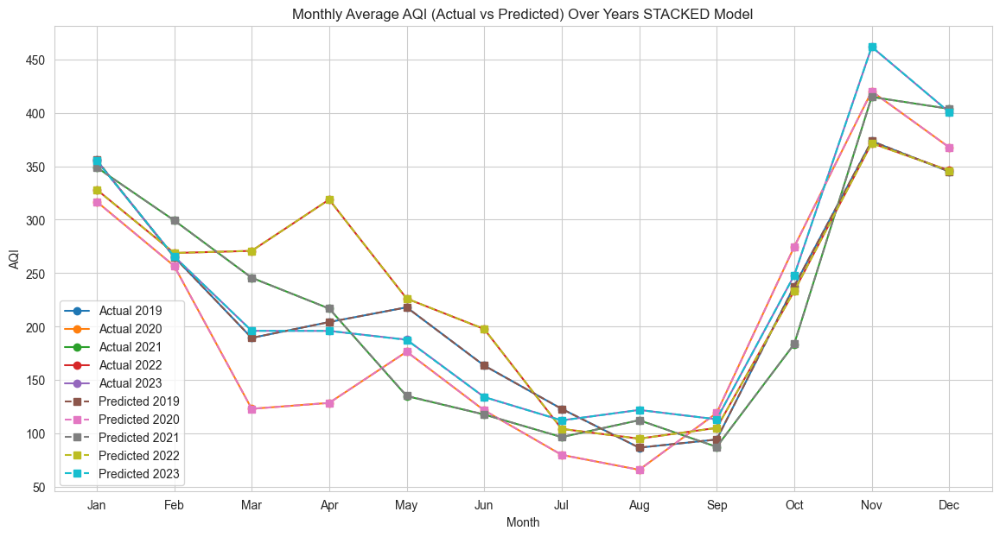

In [190]:
# Extract year and month from the index (which is the 'Timestamp')
results_df_stacked['Year'] = results_df_stacked.index.year
results_df_stacked['Month'] = results_df_stacked.index.month

# Group by year and month and calculate the mean
monthly_mean_df_stacked = results_df_stacked.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_stacked.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_stacked.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_stacked.pivot(index='Month', columns='Year', values='Predicted_stacked')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years STACKED Model')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

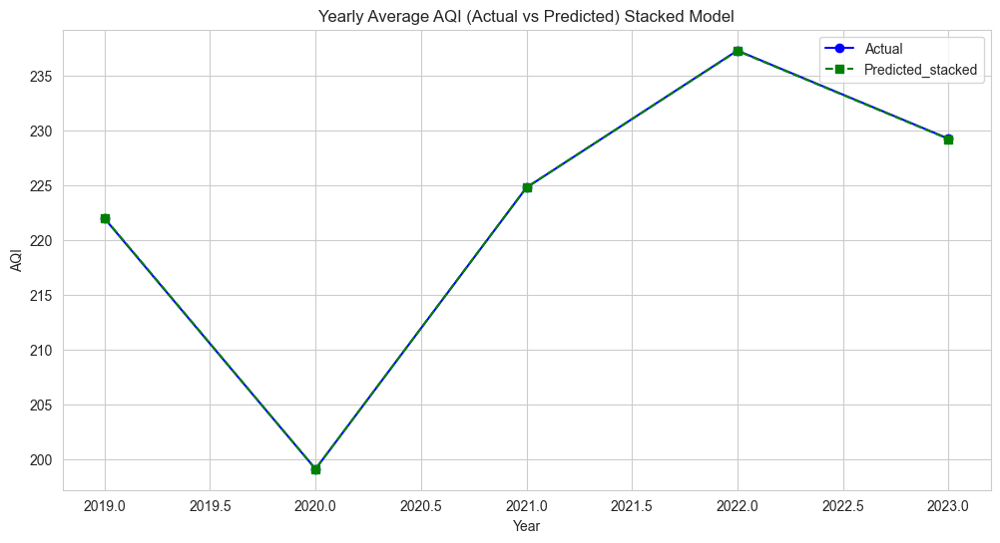

In [191]:
# Group by year and calculate the mean for each year
yearly_mean_df_stacked = results_df_stacked.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_stacked.index, yearly_mean_df_stacked['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_stacked.index, yearly_mean_df_stacked['Predicted_stacked'], marker='s', linestyle='--', color='green', label='Predicted_stacked')

plt.title('Yearly Average AQI (Actual vs Predicted) Stacked Model')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()


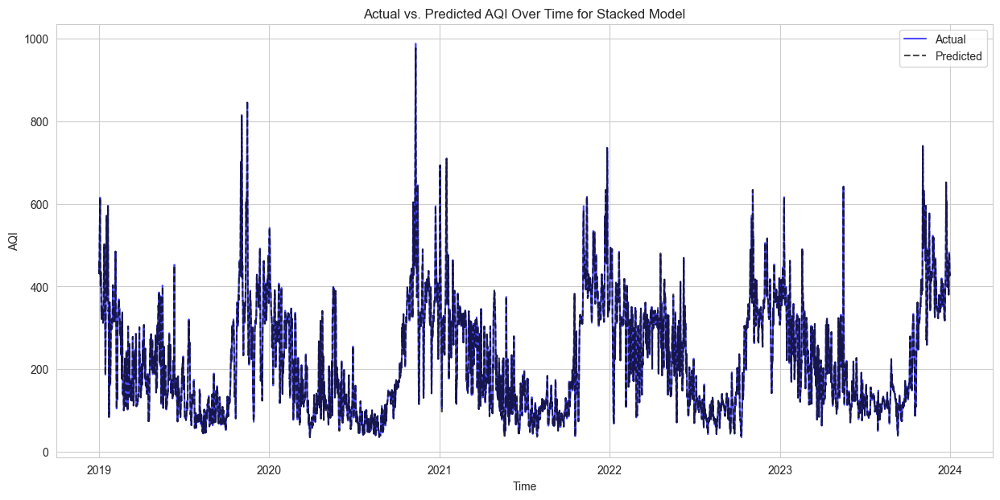

In [192]:
# Ensure the DataFrame is sorted by the datetime index
results_df_stacked.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_stacked.index, results_df_stacked['Actual'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_stacked.index, results_df_stacked['Predicted_stacked'], label='Predicted', color='black', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for Stacked Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()

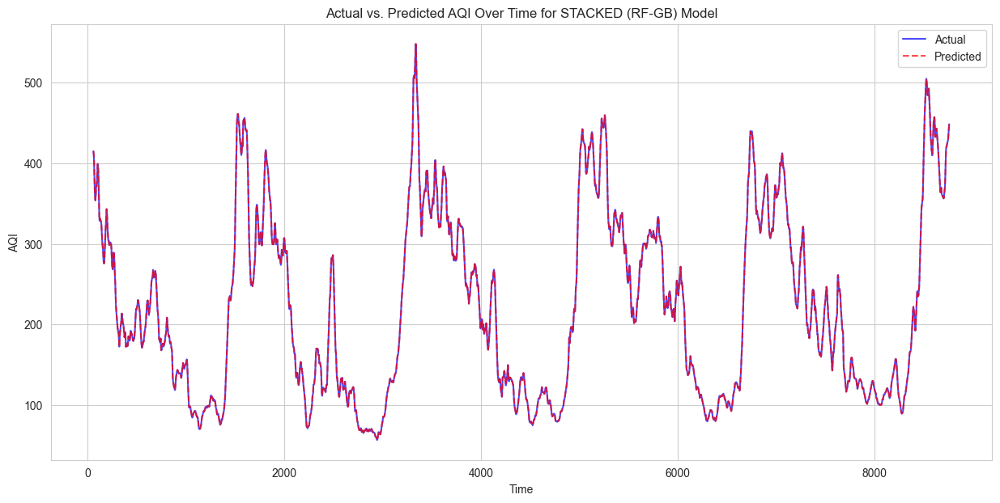

In [195]:
# Sort the DataFrame just in case the index is not in order.
results_df_stacked.sort_index(inplace=True)
results_df_stacked.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  # for example, a weekly rolling average
results_df_stacked['Actual_smooth'] = results_df_stacked['Actual'].rolling(window=rolling_window_size).mean()
results_df_stacked['Predicted_stacked_smooth'] = results_df_stacked['Predicted_stacked'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_stacked.index, results_df_stacked['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_stacked.index, results_df_stacked['Predicted_stacked_smooth'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for STACKED (RF-GB) Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


#### HYBRID LSTM AND RF

Start time: 2024-04-27 07:43:44
Epoch 1/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 11613.0957 - val_loss: 0.4505
Epoch 2/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.2132 - val_loss: 0.4679
Epoch 3/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.2688 - val_loss: 0.4094
Epoch 4/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.2538 - val_loss: 0.4723
Epoch 5/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.2779 - val_loss: 1.2093
Epoch 6/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.3691 - val_loss: 0.4242
Epoch 7/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3556 - val_loss: 0.6948
Epoch 8/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3595 - val_loss: 1.4636
Epoch 9/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6431 - val_loss: 0.4699
Epoch 10/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.8481 - val_loss: 0.4027
Epoch 11/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3942 - val_loss: 0.4008
Epoch

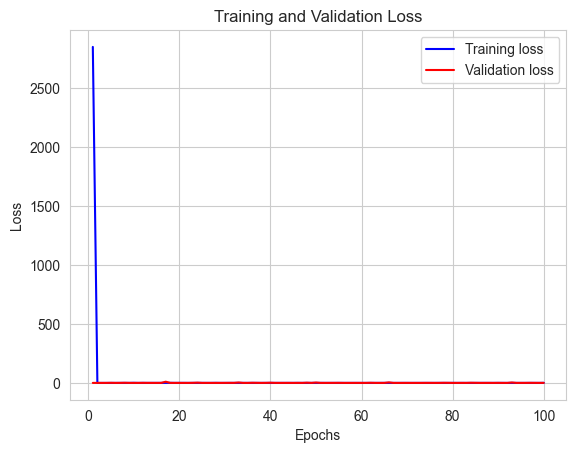

1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step

Evaluation Metrics for Hybrid RF-LSTM Model:
Training Set:
MSE: 0.5418589378532508
RMSE: 0.7361106831538656
MAE: 0.5165286325212683
R^2 score: 0.9999684771466031
Test Set:
MSE: 1.241672486228946
RMSE: 1.1143035879996734
MAE: 0.5924170937265596
R^2 score: 0.9999280054596578

End time: 2024-04-27 07:49:30
Total execution time: 346.20338010787964 seconds


In [169]:
import time
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from keras.models import Sequential
from keras.layers import LSTM, Dense

start_time = time.time()
print("Start time:", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(start_time)))
# Training Random Forest model
rf_model = RandomForestRegressor(n_estimators=300, max_depth=20, min_samples_split=2, min_samples_leaf=1, bootstrap=True,)
rf_model.fit(X_train_scaled, y_train)
# Make predictions using Random Forest model
rf_predictions_train = rf_model.predict(X_train_scaled)
rf_predictions_test = rf_model.predict(X_test_scaled)
# Concatenate original features with RF predictions
X_train_LSTM_RF = np.concatenate((X_train_scaled, rf_predictions_train.reshape(-1, 1)), axis=1)
X_test_LSTM_RF = np.concatenate((X_test_scaled, rf_predictions_test.reshape(-1, 1)), axis=1)
# Reshape input data for LSTM
X_train_RF_LSTM = X_train_LSTM_RF.reshape((X_train_LSTM_RF.shape[0], 1, X_train_LSTM_RF.shape[1]))
X_test_RF_LSTM = X_test_LSTM_RF.reshape((X_test_LSTM_RF.shape[0], 1, X_test_LSTM_RF.shape[1]))

## Building LSTM Model
LSTM_model = Sequential()
LSTM_model.add(LSTM(units=64, activation='relu', return_sequences=True, input_shape=(X_train_RF_LSTM.shape[1], 
                                                                                     X_train_RF_LSTM.shape[2])))
LSTM_model.add(LSTM(units=128, activation='relu', return_sequences=True))
LSTM_model.add(LSTM(units=32, activation='relu'))
LSTM_model.add(Dense(1))

# Compiling the LSTM model
LSTM_model.compile(optimizer='adam', loss='mean_squared_error')

import matplotlib.pyplot as plt

# Training the LSTM model and storing the history
history = LSTM_model.fit(X_train_RF_LSTM, y_train, epochs=100, batch_size=32, verbose=1, validation_split=0.2)
# Extracting loss values from the history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(train_loss) + 1)

# Plotting the training and validation loss
plt.plot(epochs, train_loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()
# Making predictions with LSTM model
LSTM_predictions_train = LSTM_model.predict(X_train_RF_LSTM)
LSTM_predictions_test = LSTM_model.predict(X_test_RF_LSTM)

# Performance Metrics of RF_LSTM Model
RF_LSTM_mse_train = mean_squared_error(y_train, LSTM_predictions_train)
RF_LSTM_rmse_train = np.sqrt(RF_LSTM_mse_train)
RF_LSTM_mae_train = mean_absolute_error(y_train, LSTM_predictions_train)
RF_LSTM_r2_train = r2_score(y_train, LSTM_predictions_train)

RF_LSTM_mse_test = mean_squared_error(y_test, LSTM_predictions_test)
RF_LSTM_rmse_test = np.sqrt(RF_LSTM_mse_test)
RF_LSTM_mae_test = mean_absolute_error(y_test, LSTM_predictions_test)
RF_LSTM_r2_test = r2_score(y_test, LSTM_predictions_test)

print("\nEvaluation Metrics for Hybrid RF-LSTM Model:")
print("Training Set:")
print("MSE:", RF_LSTM_mse_train)
print("RMSE:", RF_LSTM_rmse_train)
print("MAE:", RF_LSTM_mae_train)
print("R^2 score:", RF_LSTM_r2_train)
print("Test Set:")
print("MSE:", RF_LSTM_mse_test)
print("RMSE:", RF_LSTM_rmse_test)
print("MAE:", RF_LSTM_mae_test)
print("R^2 score:", RF_LSTM_r2_test)

# End time
end_time = time.time()
print("\nEnd time:", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end_time)))

# Total execution time
execution_time = end_time - start_time
print("Total execution time:", execution_time, "seconds")


In [170]:
# Creating a Series from the numpy array 'y_pred_mlp' with the index matching 'y_test'
y_pred_series_RF_LSTM = pd.Series(LSTM_predictions_test.flatten(), index=y_test.index, name='Predicted_rflstm')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_RF_LSTM = pd.concat([y_test.rename('Actual'), y_pred_series_RF_LSTM], axis=1)

results_df_RF_LSTM.head()


,Actual,Predicted_rflstm
Timestamp,,
2019-05-05 08:00:00,156.660714,156.401810
2021-11-25 05:00:00,405.657051,404.852417
2021-11-08 12:00:00,419.735577,418.782806
2019-10-28 08:00:00,397.748397,396.861176
2019-06-04 12:00:00,164.652778,164.270020


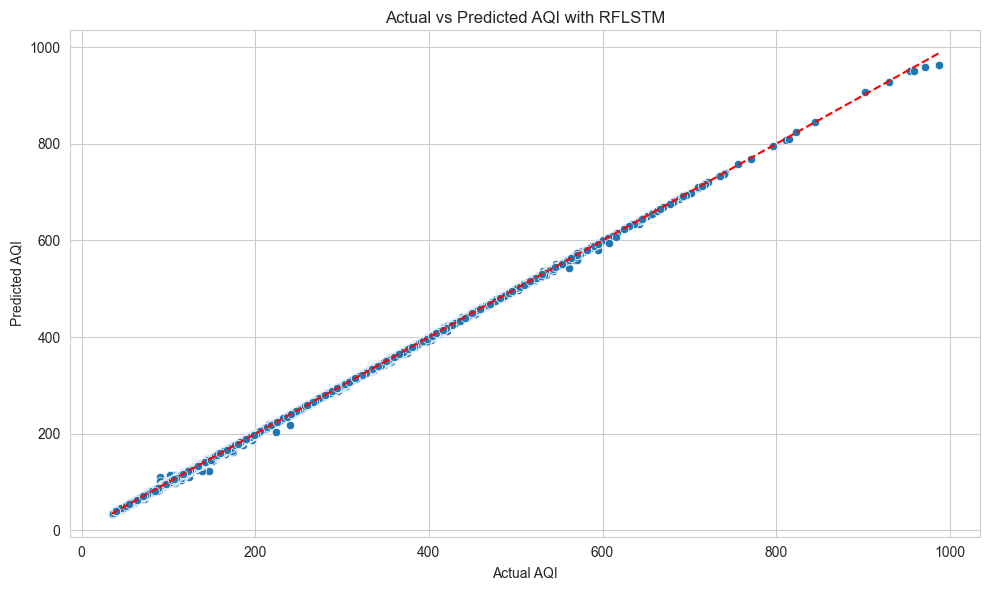

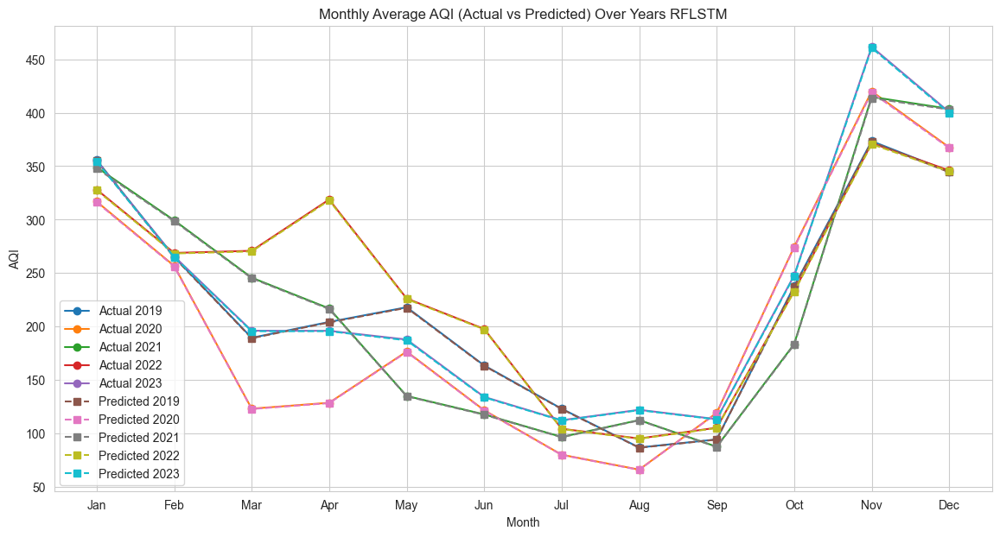

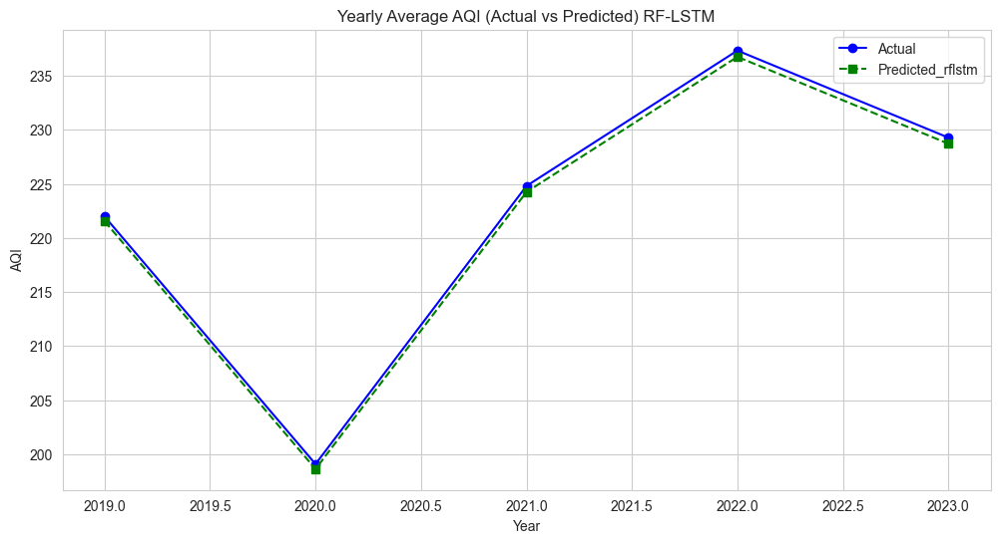

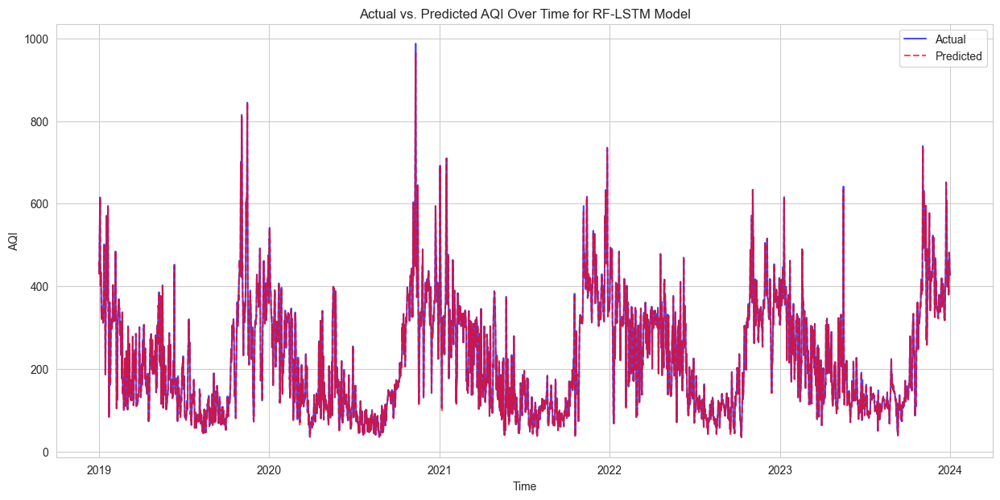

In [171]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_rflstm', data=results_df_RF_LSTM)
plt.title('Actual vs Predicted AQI with RFLSTM')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_RF_LSTM.min().min(), results_df_RF_LSTM.max().max()], [results_df_RF_LSTM.min().min(), results_df_RF_LSTM.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()
# Extract year and month from the index (which is the 'Timestamp')
results_df_RF_LSTM['Year'] = results_df_RF_LSTM.index.year
results_df_RF_LSTM['Month'] = results_df_RF_LSTM.index.month

# Group by year and month and calculate the mean
monthly_mean_df_RFlstm = results_df_RF_LSTM.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_RFlstm.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_RFlstm.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_RFlstm.pivot(index='Month', columns='Year', values='Predicted_rflstm')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years RFLSTM')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()
# Group by year and calculate the mean for each year
yearly_mean_df_RFlstm = results_df_RF_LSTM.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_RFlstm.index, yearly_mean_df_RFlstm['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_RFlstm.index, yearly_mean_df_RFlstm['Predicted_rflstm'], marker='s', linestyle='--', color='green', label='Predicted_rflstm')

plt.title('Yearly Average AQI (Actual vs Predicted) RF-LSTM')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()
# Ensure the DataFrame is sorted by the datetime index
results_df_RF_LSTM.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_RF_LSTM.index, results_df_RF_LSTM['Actual'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_RF_LSTM.index, results_df_RF_LSTM['Predicted_rflstm'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for RF-LSTM Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()

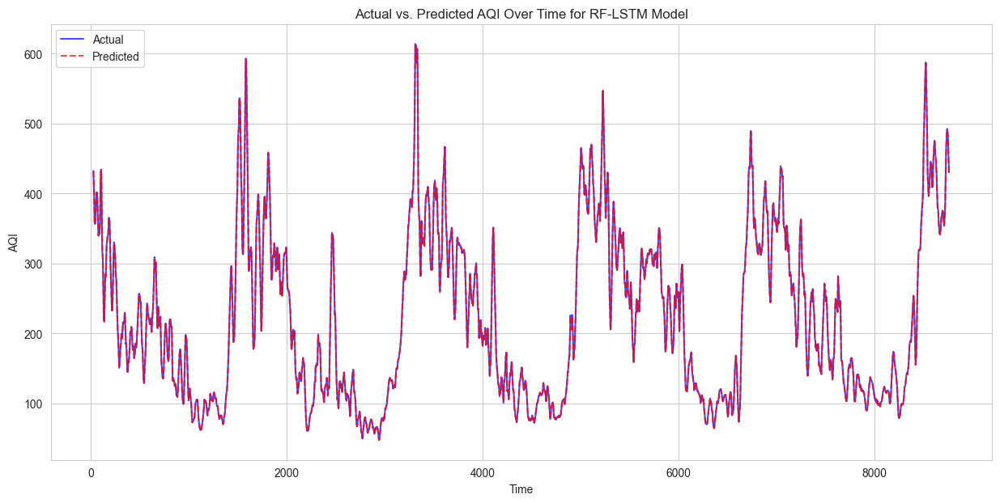

In [172]:
# Sort the DataFrame just in case the index is not in order.
results_df_RF_LSTM.sort_index(inplace=True)
results_df_RF_LSTM.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 30  # for example, a weekly rolling average
results_df_RF_LSTM['Actual_smooth'] = results_df_RF_LSTM['Actual'].rolling(window=rolling_window_size).mean()
results_df_RF_LSTM['Predicted_rflstm_smooth'] = results_df_RF_LSTM['Predicted_rflstm'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_RF_LSTM.index, results_df_RF_LSTM['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_RF_LSTM.index, results_df_RF_LSTM['Predicted_rflstm_smooth'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for RF-LSTM Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


### HYBRID RF AND GRU

Start time: 2024-04-27 11:47:24
Epoch 1/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 9061.0371 - val_loss: 0.5020
Epoch 2/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.2795 - val_loss: 0.3998
Epoch 3/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.2080 - val_loss: 0.3815
Epoch 4/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.2944 - val_loss: 0.5313
Epoch 5/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.2822 - val_loss: 0.3737
Epoch 6/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3159 - val_loss: 0.4164
Epoch 7/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3135 - val_loss: 1.2103
Epoch 8/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.9060 - val_loss: 0.4427
Epoch 9/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4892 - val_loss: 0.3729
Epoch 10/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.7752 - val_loss: 62.8057
Epoch 11/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 4.2637 - val_loss: 1.4419
Epoc

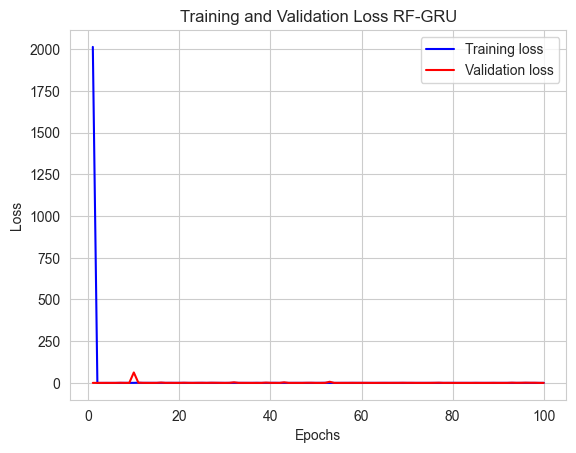

1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

Evaluation Metrics for Hybrid RF-GRU Model:
Training Set:
MSE: 0.24342816863396288
RMSE: 0.4933844025037302
MAE: 0.19904043165598692
R^2 score: 0.9999858384720884
Test Set:
MSE: 0.887299066506858
RMSE: 0.9419655336087717
MAE: 0.2961536104377493
R^2 score: 0.9999485527068146

End time: 2024-04-27 11:53:57
Total execution time: 392.35671639442444 seconds


In [196]:
import time
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from keras.models import Sequential
from keras.layers import LSTM, Dense
# Start time
start_time = time.time()
print("Start time:", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(start_time)))
# Training Random Forest model
rf_model = RandomForestRegressor(n_estimators=300, max_depth=20, min_samples_split=2, min_samples_leaf=1, bootstrap=True,)
rf_model.fit(X_train_scaled, y_train)
# Predictions using Random Forest model
rf_predictions_train = rf_model.predict(X_train_scaled)
rf_predictions_test = rf_model.predict(X_test_scaled)
# Concatenate original features with RF predictions
X_train_GRU_RF = np.concatenate((X_train_scaled, rf_predictions_train.reshape(-1, 1)), axis=1)
X_test_GRU_RF = np.concatenate((X_test_scaled, rf_predictions_test.reshape(-1, 1)), axis=1)
# Reshape input data for GRU
X_train_RF_GRU = X_train_GRU_RF.reshape((X_train_GRU_RF.shape[0], 1, X_train_GRU_RF.shape[1]))
X_test_RF_GRU = X_test_GRU_RF.reshape((X_test_GRU_RF.shape[0], 1, X_test_GRU_RF.shape[1]))
## Building GRU Model
GRU_model = Sequential()
GRU_model.add(GRU(units=64, activation='relu', return_sequences=True, input_shape=(X_train_RF_GRU.shape[1], 
                                                                                   X_train_RF_GRU.shape[2])))
GRU_model.add(GRU(units=128, activation='relu', return_sequences=True))
GRU_model.add(GRU(units=32, activation='relu'))
GRU_model.add(Dense(1))
# Compiling the GRU model
GRU_model.compile(optimizer='adam', loss='mean_squared_error')

# Training the GRU model
history=GRU_model.fit(X_train_RF_GRU, y_train, epochs=100, batch_size=32, verbose=1, validation_split=0.2)
# Extracting loss values from the history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(train_loss) + 1)

# Plotting the training and validation loss
plt.plot(epochs, train_loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation Loss RF-GRU')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Making predictions with GRU model
GRU_predictions_train = GRU_model.predict(X_train_RF_GRU)
GRU_predictions_test = GRU_model.predict(X_test_RF_GRU)

# Performance Metrics of RF_GRU Model
RF_GRU_mse_train = mean_squared_error(y_train, GRU_predictions_train)
RF_GRU_rmse_train = np.sqrt(RF_GRU_mse_train)
RF_GRU_mae_train = mean_absolute_error(y_train, GRU_predictions_train)
RF_GRU_r2_train = r2_score(y_train, GRU_predictions_train)

RF_GRU_mse_test = mean_squared_error(y_test, GRU_predictions_test)
RF_GRU_rmse_test = np.sqrt(RF_GRU_mse_test)
RF_GRU_mae_test = mean_absolute_error(y_test, GRU_predictions_test)
RF_GRU_r2_test = r2_score(y_test, GRU_predictions_test)

print("\nEvaluation Metrics for Hybrid RF-GRU Model:")
print("Training Set:")
print("MSE:", RF_GRU_mse_train)
print("RMSE:", RF_GRU_rmse_train)
print("MAE:", RF_GRU_mae_train)
print("R^2 score:", RF_GRU_r2_train)
print("Test Set:")
print("MSE:", RF_GRU_mse_test)
print("RMSE:", RF_GRU_rmse_test)
print("MAE:", RF_GRU_mae_test)
print("R^2 score:", RF_GRU_r2_test)

# End time
end_time = time.time()
print("\nEnd time:", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end_time)))

# Total execution time
execution_time = end_time - start_time
print("Total execution time:", execution_time, "seconds")

In [174]:
# Creating a Series from the numpy array 'y_pred_mlp' with the index matching 'y_test'
y_pred_series_RF_GRU = pd.Series(GRU_predictions_test.flatten(), index=y_test.index, name='Predicted_rfgru')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_RF_GRU = pd.concat([y_test.rename('Actual'), y_pred_series_RF_GRU], axis=1)

results_df_RF_GRU.head()



,Actual,Predicted_rfgru
Timestamp,,
2019-05-05 08:00:00,156.660714,155.494492
2021-11-25 05:00:00,405.657051,402.550690
2021-11-08 12:00:00,419.735577,416.585968
2019-10-28 08:00:00,397.748397,394.679504
2019-06-04 12:00:00,164.652778,163.548965


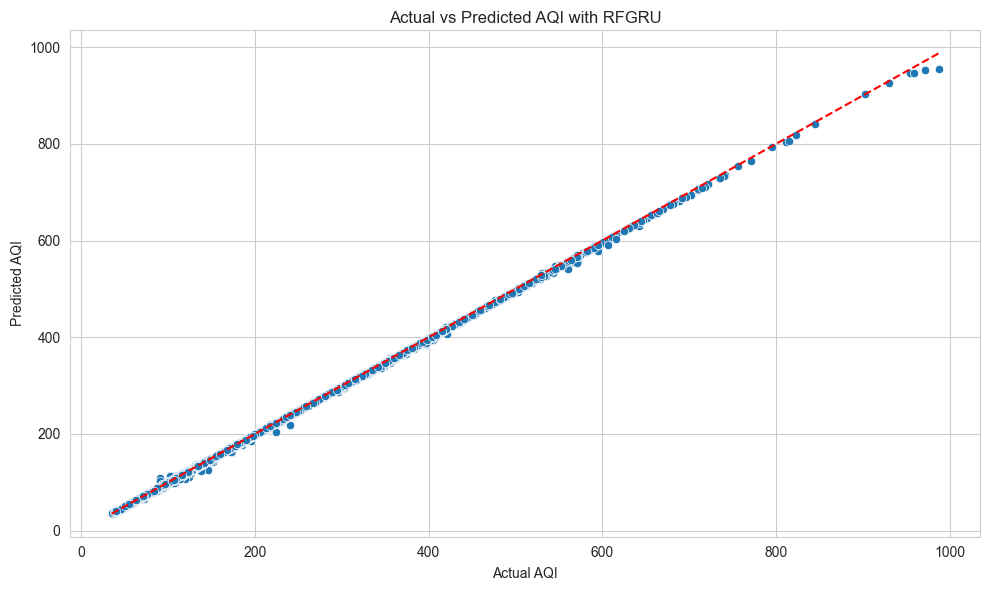

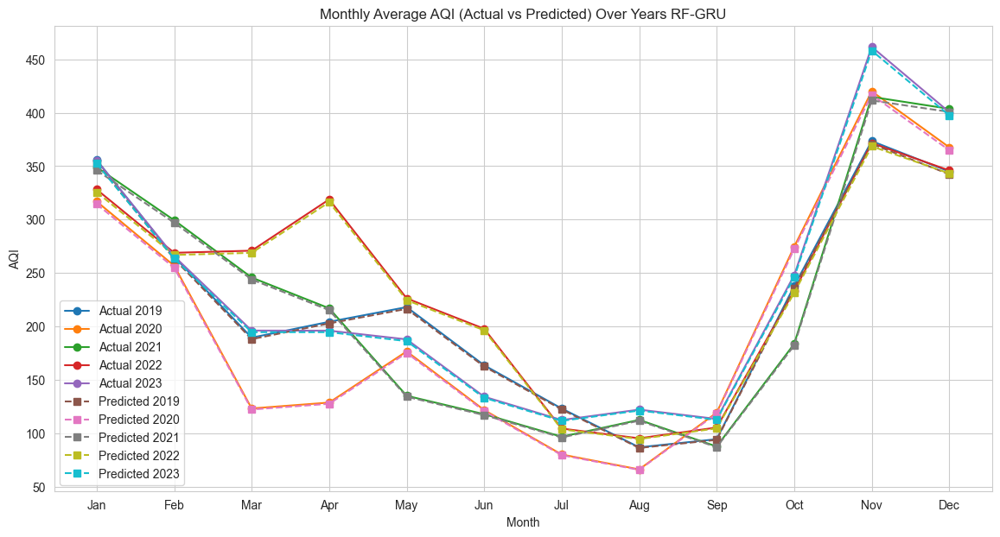

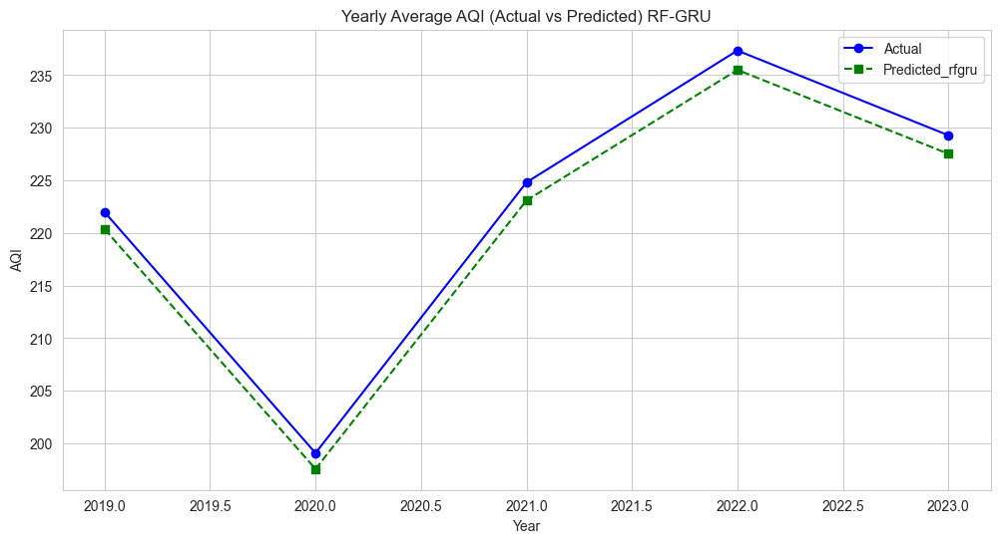

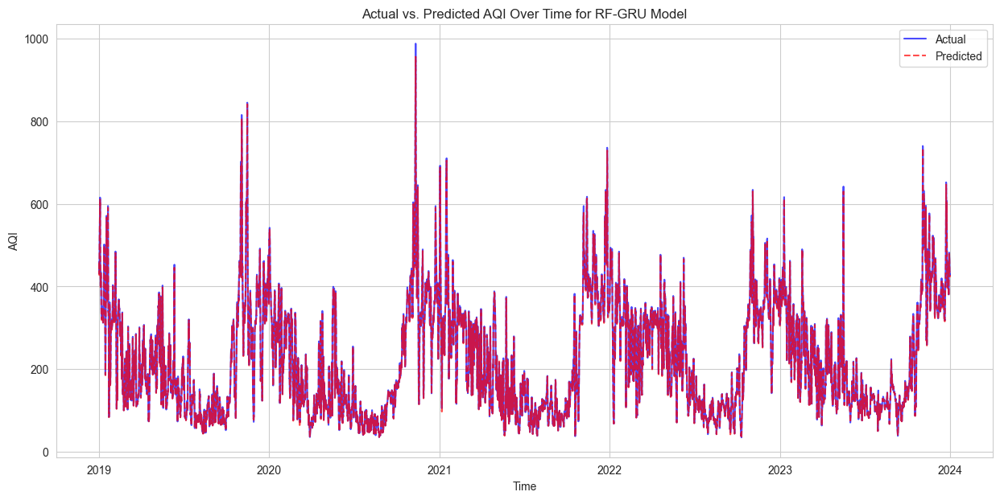

In [175]:
import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_rfgru', data=results_df_RF_GRU)
plt.title('Actual vs Predicted AQI with RFGRU')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_RF_GRU.min().min(), results_df_RF_GRU.max().max()], [results_df_RF_GRU.min().min(), results_df_RF_GRU.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()
# Extract year and month from the index (which is the 'Timestamp')
results_df_RF_GRU['Year'] = results_df_RF_GRU.index.year
results_df_RF_GRU['Month'] = results_df_RF_GRU.index.month

# Group by year and month and calculate the mean
monthly_mean_df_RFgru = results_df_RF_GRU.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_RFgru.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_RFgru.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_RFgru.pivot(index='Month', columns='Year', values='Predicted_rfgru')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years RF-GRU')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()
# Group by year and calculate the mean for each year
yearly_mean_df_RFgru = results_df_RF_GRU.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_RFgru.index, yearly_mean_df_RFgru['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_RFgru.index, yearly_mean_df_RFgru['Predicted_rfgru'], marker='s', linestyle='--', color='green', label='Predicted_rfgru')

plt.title('Yearly Average AQI (Actual vs Predicted) RF-GRU')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()
# Ensure the DataFrame is sorted by the datetime index
results_df_RF_GRU.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_RF_GRU.index, results_df_RF_GRU['Actual'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_RF_GRU.index, results_df_RF_GRU['Predicted_rfgru'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for RF-GRU Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()

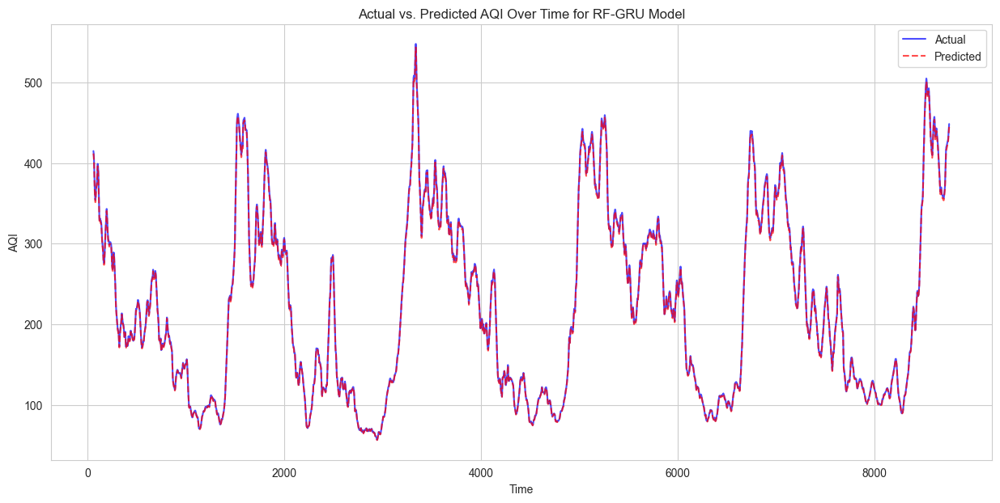

In [182]:
# Sort the DataFrame just in case the index is not in order.
results_df_RF_GRU.sort_index(inplace=True)
results_df_RF_GRU.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  # for example, a weekly rolling average
results_df_RF_GRU['Actual_smooth'] = results_df_RF_GRU['Actual'].rolling(window=rolling_window_size).mean()
results_df_RF_GRU['Predicted_rfgru_smooth'] = results_df_RF_GRU['Predicted_rfgru'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_RF_GRU.index, results_df_RF_GRU['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_RF_GRU.index, results_df_RF_GRU['Predicted_rfgru_smooth'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for RF-GRU Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


### RF-MLP

In [243]:
import time
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input

# Start time
start_time = time.time()
print("Start time:", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(start_time)))

# Instantiate a Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=300, max_depth=20, min_samples_split=2, min_samples_leaf=1, bootstrap=True)

# Fit the Random Forest model
rf_model.fit(X_train_scaled, y_train)

# Predictions using Random Forest model
rf_predictions_train = rf_model.predict(X_train_scaled)
rf_predictions_test = rf_model.predict(X_test_scaled)

# Concatenate original features with RF predictions
X_train_RF_MLP = np.concatenate((X_train_scaled, rf_predictions_train.reshape(-1, 1)), axis=1)
X_test_RF_MLP = np.concatenate((X_test_scaled, rf_predictions_test.reshape(-1, 1)), axis=1)

# Define an MLP model
mlp_model_rf = Sequential([
    Dense(64, activation='relu', input_shape=(X_train_RF_MLP.shape[1],)),
    Dense(128, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)
])

# Compile the MLP model
mlp_model_rf.compile(optimizer='adam', loss='mean_squared_error')

# Train the MLP model
mlp_model_rf.fit(X_train_RF_MLP, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

# Make predictions using MLP model
mlp_predictions_train = mlp_model_rf.predict(X_train_RF_MLP)
mlp_predictions_test = mlp_model_rf.predict(X_test_RF_MLP)

# Performance Metrics of RF-MLP Model
RF_MLP_mse_train = mean_squared_error(y_train, mlp_predictions_train)
RF_MLP_rmse_train = np.sqrt(RF_MLP_mse_train)
RF_MLP_mae_train = mean_absolute_error(y_train, mlp_predictions_train)
RF_MLP_r2_train = r2_score(y_train, mlp_predictions_train)

RF_MLP_mse_test = mean_squared_error(y_test, mlp_predictions_test)
RF_MLP_rmse_test = np.sqrt(RF_MLP_mse_test)
RF_MLP_mae_test = mean_absolute_error(y_test, mlp_predictions_test)
RF_MLP_r2_test = r2_score(y_test, mlp_predictions_test)

print("\nEvaluation Metrics for Hybrid RF-MLP Model:")
print("Training Set:")
print("MSE:", RF_MLP_mse_train)
print("RMSE:", RF_MLP_rmse_train)
print("MAE:", RF_MLP_mae_train)
print("R^2 score:", RF_MLP_r2_train)
print("Test Set:")
print("MSE:", RF_MLP_mse_test)
print("RMSE:", RF_MLP_rmse_test)
print("MAE:", RF_MLP_mae_test)
print("R^2 score:", RF_MLP_r2_test)

# End time
end_time = time.time()
print("\nEnd time:", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end_time)))

# Total execution time
execution_time = end_time - start_time
print("Total execution time:", execution_time, "seconds")


Start time: 2024-04-24 08:55:31
Epoch 1/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 3910.8164 - val_loss: 0.4332
Epoch 2/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2269 - val_loss: 0.3970
Epoch 3/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 936us/step - loss: 0.2229 - val_loss: 0.3683
Epoch 4/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.1865 - val_loss: 0.3682
Epoch 5/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 942us/step - loss: 0.2052 - val_loss: 0.3862
Epoch 6/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.2663 - val_loss: 0.4423
Epoch 7/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 986us/step - loss: 0.4153 - val_loss: 0.3731
Epoch 8/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 932us/step - loss: 0.4954 - val_loss: 7.6605
Epoch 9/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 912us/step - loss: 1.0815 - val_loss: 0.3831
Epoch 10/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 984us/step - loss: 0.6916 - val_loss: 0.8497
Epoch 11/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 1s 875us/step - loss: 0.9006 - val_loss:

### HYBRID OF TCN AND RF

In [224]:
import time
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError

start_time = time.time()
print("Start time:", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(start_time)))
# Training Random Forest model
rf_model = RandomForestRegressor(n_estimators=300, max_depth=20, min_samples_split=2, min_samples_leaf=1, bootstrap=True,)
rf_model.fit(X_train_scaled, y_train)
# Make predictions using Random Forest model
rf_predictions_train = rf_model.predict(X_train_scaled)
rf_predictions_test = rf_model.predict(X_test_scaled)

# Concatenate original features with RF predictions
X_train_hybrid = np.concatenate((X_train_scaled, rf_predictions_train.reshape(-1, 1)), axis=1)
X_test_hybrid = np.concatenate((X_test_scaled, rf_predictions_test.reshape(-1, 1)), axis=1)
# Reshape input data for TCN
X_train_hybrid_tcn = X_train_hybrid.reshape((X_train_hybrid.shape[0], X_train_hybrid.shape[1], 1))
X_test_hybrid_tcn = X_test_hybrid.reshape((X_test_hybrid.shape[0], X_test_hybrid.shape[1], 1))
# Define TCN Model
def build_tcn_model(input_shape):
    model = Sequential([
        Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=input_shape),
        Conv1D(filters=64, kernel_size=3, activation='relu'),
        Flatten(),
        Dense(32, activation='relu'),
        Dense(1, activation='linear')
    ])
    return model

tcn_model_hyb = build_tcn_model(input_shape=(X_train_hybrid_tcn.shape[1], 1))
tcn_model_hyb.compile(optimizer=Adam(), loss=MeanSquaredError(), metrics=['mae', 'mse'])

# Train TCN model
tcn_model_hyb.fit(X_train_hybrid_tcn, y_train, epochs=100, validation_split=0.2, verbose=1)

# Evaluate TCN model
test_loss, test_mae, test_mse = tcn_model_hyb.evaluate(X_test_hybrid_tcn, y_test, verbose=1)
y_pred_tcn_hyb = tcn_model_hyb.predict(X_test_hybrid_tcn)

# Performance Metrics of Hybrid TCN-RF Model
hyb_tcn_mae = mean_absolute_error(y_test, y_pred_tcn_hyb)
hyb_tcn_mse = mean_squared_error(y_test, y_pred_tcn_hyb)
hyb_tcn_rmse = np.sqrt(tcn_mse)
hyb_tcn_r2 = r2_score(y_test, y_pred_tcn_hyb)

print("\nEvaluation Metrics for Hybrid TCN-RF Model:")
print("MAE:", hyb_tcn_mae)
print("MSE:", hyb_tcn_mse)
print("RMSE:", hyb_tcn_rmse)
print("R^2 score:", hyb_tcn_r2)

# End time
end_time = time.time()
print("\nEnd time:", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end_time)))

# Total execution time
execution_time = end_time - start_time
print("Total execution time:", execution_time, "seconds")


Start time: 2024-04-24 06:53:53
Epoch 1/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 9085.3330 - mae: 41.0788 - mse: 9085.3369 - val_loss: 0.9589 - val_mae: 0.6246 - val_mse: 0.9630
Epoch 2/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.6077 - mae: 0.5162 - mse: 0.6077 - val_loss: 0.9295 - val_mae: 0.6275 - val_mse: 0.9321
Epoch 3/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3322 - mae: 0.3245 - mse: 0.3322 - val_loss: 0.4340 - val_mae: 0.2674 - val_mse: 0.4352
Epoch 4/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.3597 - mae: 0.3006 - mse: 0.3597 - val_loss: 0.4496 - val_mae: 0.3020 - val_mse: 0.4509
Epoch 5/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4147 - mae: 0.3218 - mse: 0.4147 - val_loss: 1.0782 - val_mae: 0.8174 - val_mse: 1.0779
Epoch 6/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.4237 - mae: 0.3590 - mse: 0.4237 - val_loss: 0.3873 - val_mae: 0.1820 - val_mse: 0.3889
Epoch 7/100
877/877 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - 

### RF-BILSTM

In [247]:
import time
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Start time
start_time_rf_bilstm = time.time()
print("Start time (RF-BiLSTM):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(start_time_rf_bilstm)))

# Training Random Forest model
rf_model = RandomForestRegressor(n_estimators=300, max_depth=20, random_state=42)
rf_model.fit(X_train_scaled, y_train)
# Make predictions with Random Forest
rf_predictions_train = rf_model.predict(X_train_scaled)
rf_predictions_test = rf_model.predict(X_test_scaled)

# Reshape data for BiLSTM input
X_train_scaled_shaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_scaled_shaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# Concatenate RF predictions with the scaled features for BiLSTM input
X_train_bilstm_input = np.concatenate((X_train_scaled_shaped, rf_predictions_train[:, None, None]), axis=2)
X_test_bilstm_input = np.concatenate((X_test_scaled_shaped, rf_predictions_test[:, None, None]), axis=2)

# Build BiLSTM Model
bilstm_model = Sequential()
bilstm_model.add(Bidirectional(LSTM(units=64, activation='relu', return_sequences=True), input_shape=(X_train_bilstm_input.shape[1], X_train_bilstm_input.shape[2])))
bilstm_model.add(Bidirectional(LSTM(units=128, activation='relu', return_sequences=True)))
bilstm_model.add(Bidirectional(LSTM(units=32, activation='relu')))
bilstm_model.add(Dense(1))
bilstm_model.compile(optimizer='adam', loss='mean_squared_error')


# Train BiLSTM Model
bilstm_model.fit(X_train_bilstm_input, y_train, epochs=50, batch_size=32, verbose=1)

# Predict with BiLSTM
y_pred_bilstm = bilstm_model.predict(X_test_bilstm_input)

# Performance Metrics
mse_bilstm = mean_squared_error(y_test, y_pred_bilstm)
rmse_bilstm = np.sqrt(mse_bilstm)
mae_bilstm = mean_absolute_error(y_test, y_pred_bilstm)
r2_bilstm = r2_score(y_test, y_pred_bilstm)

print(f"Mean Absolute Error (MAE) of RF-BiLSTM: {mae_bilstm:.2f}")
print(f"Mean Squared Error (MSE) of RF-BiLSTM: {mse_bilstm:.2f}")
print(f"Root Mean Squared Error (RMSE) of RF-BiLSTM: {rmse_bilstm:.2f}")
print(f"R-squared (R²) of RF-BiLSTM: {r2_bilstm:.4f}")

# End time
end_time_rf_bilstm = time.time()
print("End time (RF-BiLSTM):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end_time_rf_bilstm)))

# Total execution time
execution_time_rf_bilstm = end_time_rf_bilstm - start_time_rf_bilstm
print("Total execution time (RF-BiLSTM):", execution_time_rf_bilstm, "seconds")


Start time (RF-BiLSTM): 2024-04-24 09:20:48
Epoch 1/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - loss: 4370.3638
Epoch 2/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.3760
Epoch 3/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.3095
Epoch 4/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.7846
Epoch 5/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.6454
Epoch 6/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.0192
Epoch 7/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.9276
Epoch 8/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.0859
Epoch 9/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.4206
Epoch 10/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.9186
Epoch 11/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.1585
Epoch 12/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 1.6939
Epoch 13/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.5946
Epoch 14/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/s

#### LSTMGRU

In [193]:
import time
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Start time
start_time = time.time()
print("Start time:", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(start_time)))

# Assuming X_train_scaled and y_train are already defined and scaled
# Reshape input to be 3D [samples, timesteps, features] for LSTM
X_train_scaled_shaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_scaled_shaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# Build LSTM Model
lstm_model = Sequential()
lstm_model.add(LSTM(units=64, activation='relu', return_sequences=True, input_shape=(1, X_train_scaled_shaped.shape[2])))
lstm_model.add(LSTM(units=32, activation='relu', return_sequences=False))  # Set return_sequences=False here
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mean_squared_error')
lstm_model.fit(X_train_scaled_shaped, y_train, epochs=50, batch_size=32, verbose=1)

# Predict with LSTM
lstm_predictions_train = lstm_model.predict(X_train_scaled_shaped)
lstm_predictions_test = lstm_model.predict(X_test_scaled_shaped)

# Reshape LSTM predictions to add as a feature for the GRU input
lstm_predictions_train = lstm_predictions_train.reshape(-1, 1, 1)
lstm_predictions_test = lstm_predictions_test.reshape(-1, 1, 1)

# Concatenate LSTM predictions with original features for GRU input
X_train_gru_input = np.concatenate((X_train_scaled_shaped, lstm_predictions_train), axis=2)
X_test_gru_input = np.concatenate((X_test_scaled_shaped, lstm_predictions_test), axis=2)

# Build GRU Model
gru_model = Sequential()
gru_model.add(GRU(units=128, activation='relu', input_shape=(1, X_train_gru_input.shape[2])))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mean_squared_error')
gru_model.fit(X_train_gru_input, y_train, epochs=50, batch_size=32, verbose=1)

# Predict with GRU
gru_predictions_train = gru_model.predict(X_train_gru_input)
gru_predictions_test = gru_model.predict(X_test_gru_input)

# Performance Metrics
mse_train = mean_squared_error(y_train, gru_predictions_train)
rmse_train = np.sqrt(mse_train)
mae_train = mean_absolute_error(y_train, gru_predictions_train)
r2_train = r2_score(y_train, gru_predictions_train)

mse_test = mean_squared_error(y_test, gru_predictions_test)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, gru_predictions_test)
r2_test = r2_score(y_test, gru_predictions_test)

print("\nEvaluation Metrics for Sequential LSTM-GRU Model:")
print("Training Set:")
print("MSE:", mse_train)
print("RMSE:", rmse_train)
print("MAE:", mae_train)
print("R^2 score:", r2_train)
print("Test Set:")
print("MSE:", mse_test)
print("RMSE:", rmse_test)
print("MAE:", mae_test)
print("R^2 score:", r2_test)

# End time
end_time = time.time()
print("\nEnd time:", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end_time)))

# Total execution time
execution_time = end_time - start_time
print("Total execution time:", execution_time, "seconds")


Start time: 2024-04-23 14:43:03
Epoch 1/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 29559.5664
Epoch 2/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 1004.7882
Epoch 3/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 525.7515
Epoch 4/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 345.9606
Epoch 5/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 248.7587
Epoch 6/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 181.9091
Epoch 7/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 136.8231
Epoch 8/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 96.9357
Epoch 9/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 67.5966
Epoch 10/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 44.1740
Epoch 11/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 32.6321
Epoch 12/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 23.9346
Epoch 13/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 19.3130
Epoch 14/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2

### BILSTMGRU

Start time (BiLSTM-GRU): 2024-04-27 08:16:38
Epoch 1/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - loss: 25703.2969
Epoch 2/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 740.2857
Epoch 3/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 397.3673
Epoch 4/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 234.5165
Epoch 5/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 156.5510
Epoch 6/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 111.2795
Epoch 7/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 78.9397
Epoch 8/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 52.8642
Epoch 9/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 33.2636
Epoch 10/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 26.2313
Epoch 11/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 19.7506
Epoch 12/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 16.7334
Epoch 13/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 14.8306
Epoch 14/50
1096/1096 ━━━━━━━━━━━

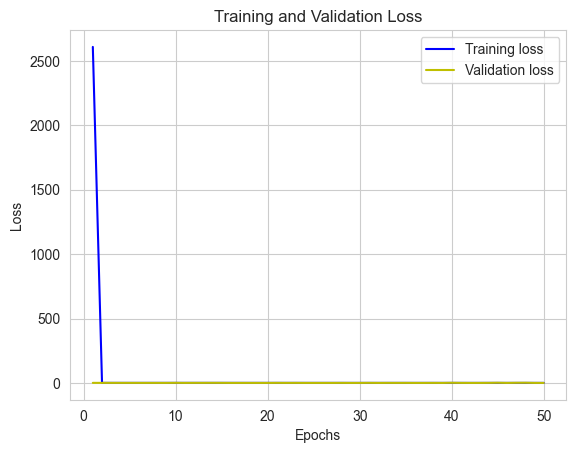

1096/1096 ━━━━━━━━━━━━━━━━━━━━ 1s 888us/step
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 714us/step

Evaluation Metrics for Cascading BiLSTM-GRU Model:
Training Set:
MSE: 0.9526135993776365
RMSE: 0.9760192617861783
MAE: 0.7249998637878662
R^2 score: 0.999944581335216
Test Set:
MSE: 1.2904680713682943
RMSE: 1.1359877074019307
MAE: 0.8088719381960596
R^2 score: 0.9999251761985105
End time (BiLSTM-GRU): 2024-04-27 08:19:34
Total execution time (BiLSTM-GRU): 175.92697668075562 seconds


In [177]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, GRU, Dense
import time
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Start time
start_time_bilstm_gru = time.time()
print("Start time (BiLSTM-GRU):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(start_time_bilstm_gru)))

# Assuming X_train_scaled and y_train are already defined and scaled
# Reshape input to be 3D [samples, timesteps, features] for BiLSTM
X_train_scaled_shaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_scaled_shaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# Build BiLSTM Model
bilstm_model = Sequential()
bilstm_model.add(Bidirectional(LSTM(units=64, activation='relu', return_sequences=True), input_shape=(1, X_train_scaled_shaped.shape[2])))
bilstm_model.add(Bidirectional(LSTM(units=32, activation='relu', return_sequences=False)))  # Ensuring output from BiLSTM feeds into GRU
bilstm_model.add(Dense(1))  # Optional: intermediary output
bilstm_model.compile(optimizer='adam', loss='mean_squared_error')
bilstm_model.fit(X_train_scaled_shaped, y_train, epochs=50, batch_size=32, verbose=1)

# Predict with BiLSTM
bilstm_predictions_train = bilstm_model.predict(X_train_scaled_shaped)
bilstm_predictions_test = bilstm_model.predict(X_test_scaled_shaped)

# Concatenate BiLSTM predictions with original features for GRU input
X_train_gru_input = np.concatenate((X_train_scaled_shaped.squeeze(), bilstm_predictions_train), axis=1).reshape(-1, 1, X_train_scaled_shaped.shape[2] + 1)
X_test_gru_input = np.concatenate((X_test_scaled_shaped.squeeze(), bilstm_predictions_test), axis=1).reshape(-1, 1, X_test_scaled_shaped.shape[2] + 1)

# Build GRU Model
gru_model = Sequential()
gru_model.add(GRU(units=128, activation='relu', input_shape=(1, X_train_gru_input.shape[2])))
gru_model.add(Dense(1))
gru_model.compile(optimizer='adam', loss='mean_squared_error')
history=gru_model.fit(X_train_gru_input, y_train, epochs=50, batch_size=32, verbose=1, validation_split=0.2)
# Extracting loss values from the history
train_loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(train_loss) + 1)

# Plotting the training and validation loss
plt.plot(epochs, train_loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'y', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Predict with GRU
gru_predictions_train = gru_model.predict(X_train_gru_input)
gru_predictions_test = gru_model.predict(X_test_gru_input)

# Performance Metrics
mse_train = mean_squared_error(y_train, gru_predictions_train)
rmse_train = np.sqrt(mse_train)
mae_train = mean_absolute_error(y_train, gru_predictions_train)
r2_train = r2_score(y_train, gru_predictions_train)

mse_test = mean_squared_error(y_test, gru_predictions_test)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, gru_predictions_test)
r2_test = r2_score(y_test, gru_predictions_test)

print("\nEvaluation Metrics for Cascading BiLSTM-GRU Model:")
print("Training Set:")
print("MSE:", mse_train)
print("RMSE:", rmse_train)
print("MAE:", mae_train)
print("R^2 score:", r2_train)
print("Test Set:")
print("MSE:", mse_test)
print("RMSE:", rmse_test)
print("MAE:", mae_test)
print("R^2 score:", r2_test)

# End time
end_time_bilstm_gru = time.time()
print("End time (BiLSTM-GRU):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end_time_bilstm_gru)))

# Total execution time
execution_time_bilstm_gru = end_time_bilstm_gru - start_time_bilstm_gru
print("Total execution time (BiLSTM-GRU):", execution_time_bilstm_gru, "seconds")


In [178]:
# Creating a Series from the numpy array 'y_pred_mlp' with the index matching 'y_test'
y_pred_series_BiLSTM_GRU = pd.Series(GRU_predictions_test.flatten(), index=y_test.index, name='Predicted_BiLSTMgru')

# Now concatenating 'y_test' and 'y_pred_series' to form a DataFrame
results_df_BiLSTM_GRU = pd.concat([y_test.rename('Actual'), y_pred_series_BiLSTM_GRU], axis=1)

results_df_BiLSTM_GRU.head()

,Actual,Predicted_BiLSTMgru
Timestamp,,
2019-05-05 08:00:00,156.660714,155.494492
2021-11-25 05:00:00,405.657051,402.550690
2021-11-08 12:00:00,419.735577,416.585968
2019-10-28 08:00:00,397.748397,394.679504
2019-06-04 12:00:00,164.652778,163.548965


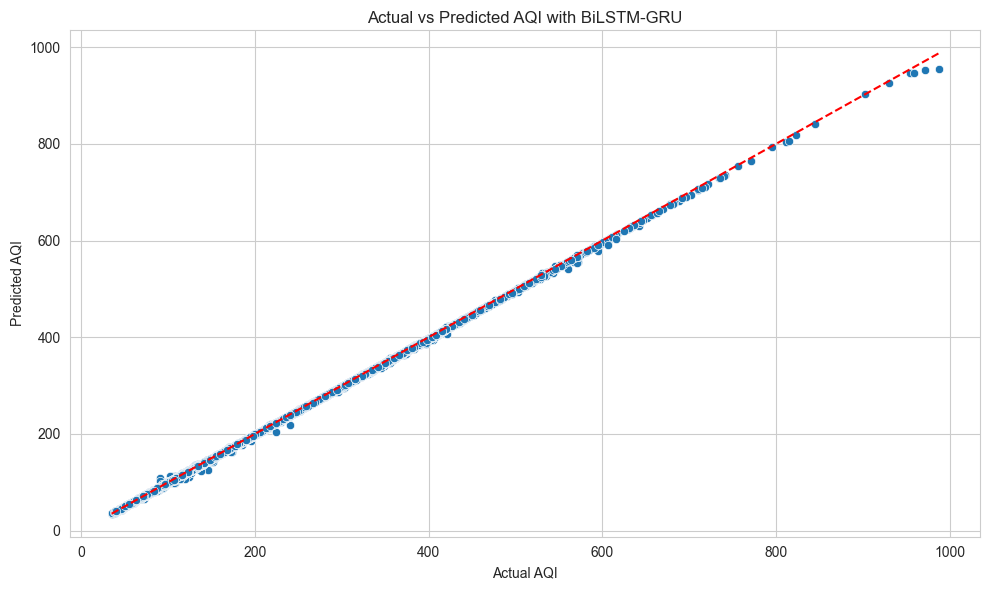

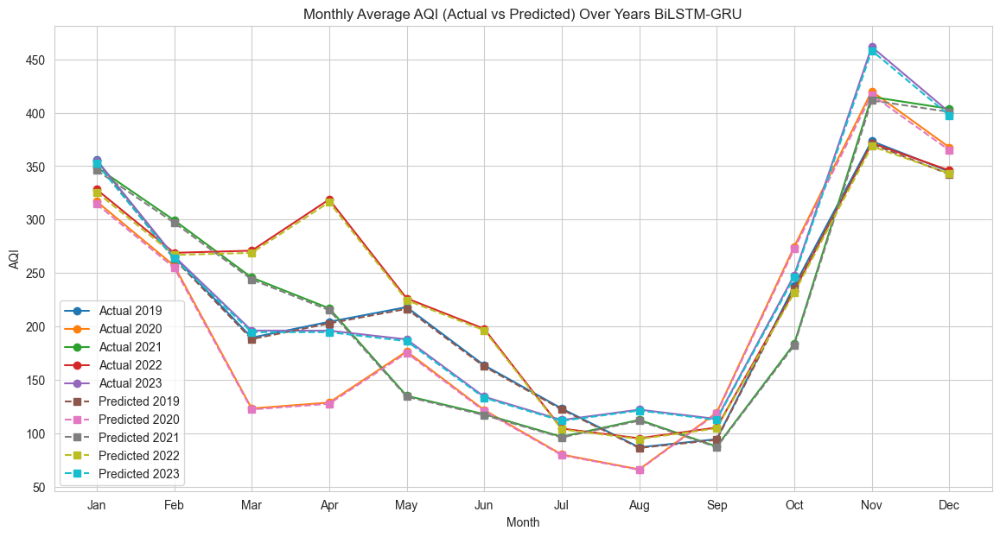

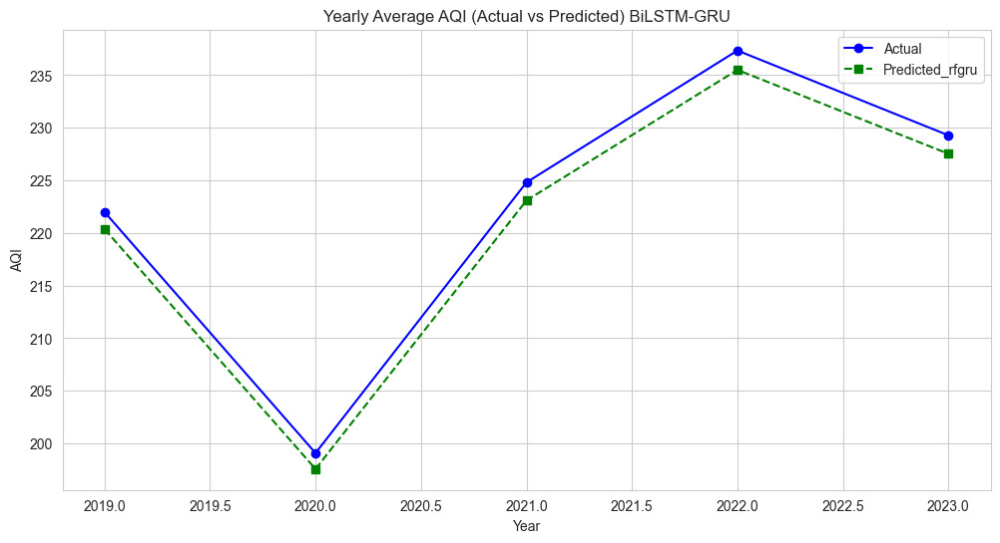

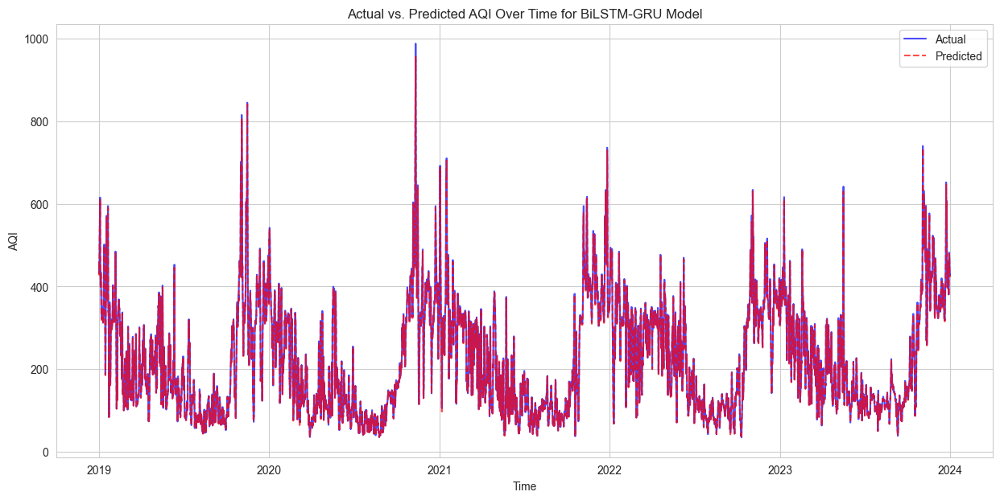

In [179]:

import pandas as pd
import matplotlib.pyplot as plt

# Plotting Predicted vs Actual values
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Actual', y='Predicted_BiLSTMgru', data=results_df_BiLSTM_GRU)
plt.title('Actual vs Predicted AQI with BiLSTM-GRU')
plt.xlabel('Actual AQI')
plt.ylabel('Predicted AQI')
plt.plot([results_df_BiLSTM_GRU.min().min(), results_df_BiLSTM_GRU.max().max()], [results_df_BiLSTM_GRU.min().min(), results_df_BiLSTM_GRU.max().max()], color='red', linestyle='--')  # Diagonal line
plt.tight_layout()
plt.show()
# Extract year and month from the index (which is the 'Timestamp')
results_df_BiLSTM_GRU['Year'] = results_df_BiLSTM_GRU.index.year
results_df_BiLSTM_GRU['Month'] = results_df_BiLSTM_GRU.index.month

# Group by year and month and calculate the mean
monthly_mean_df_BiLSTMgru = results_df_BiLSTM_GRU.groupby(['Year', 'Month']).mean()

# Since the result will have a MultiIndex, let's reset it so we can easily plot
monthly_mean_df_BiLSTMgru.reset_index(inplace=True)

# Now create a pivot table for actual and predicted AQI with years as columns and months as rows
pivot_actual = monthly_mean_df_BiLSTMgru.pivot(index='Month', columns='Year', values='Actual')
pivot_predicted = monthly_mean_df_BiLSTMgru.pivot(index='Month', columns='Year', values='Predicted_BiLSTMgru')

# Plotting
plt.figure(figsize=(14, 7))

# Plot actual AQI
for column in pivot_actual.columns:
    plt.plot(pivot_actual.index, pivot_actual[column], marker='o', linestyle='-', label=f'Actual {column}')

# Plot predicted AQI
for column in pivot_predicted.columns:
    plt.plot(pivot_predicted.index, pivot_predicted[column], marker='s', linestyle='--', label=f'Predicted {column}')

plt.title('Monthly Average AQI (Actual vs Predicted) Over Years BiLSTM-GRU')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()
# Group by year and calculate the mean for each year
yearly_mean_df_BiLSTMgru = results_df_BiLSTM_GRU.groupby('Year').mean()

# Plotting the yearly means for actual and predicted AQI
plt.figure(figsize=(12, 6))

# Plot actual AQI
plt.plot(yearly_mean_df_BiLSTMgru.index, yearly_mean_df_BiLSTMgru['Actual'], marker='o', linestyle='-', color='blue', label='Actual')

# Plot predicted AQI
plt.plot(yearly_mean_df_BiLSTMgru.index, yearly_mean_df_BiLSTMgru['Predicted_BiLSTMgru'], marker='s', linestyle='--', color='green', label='Predicted_rfgru')

plt.title('Yearly Average AQI (Actual vs Predicted) BiLSTM-GRU')
plt.xlabel('Year')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()
# Ensure the DataFrame is sorted by the datetime index
results_df_BiLSTM_GRU.sort_index(inplace=True)
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
plt.plot(results_df_BiLSTM_GRU.index, results_df_BiLSTM_GRU['Actual'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_BiLSTM_GRU.index, results_df_BiLSTM_GRU['Predicted_BiLSTMgru'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for BiLSTM-GRU Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()

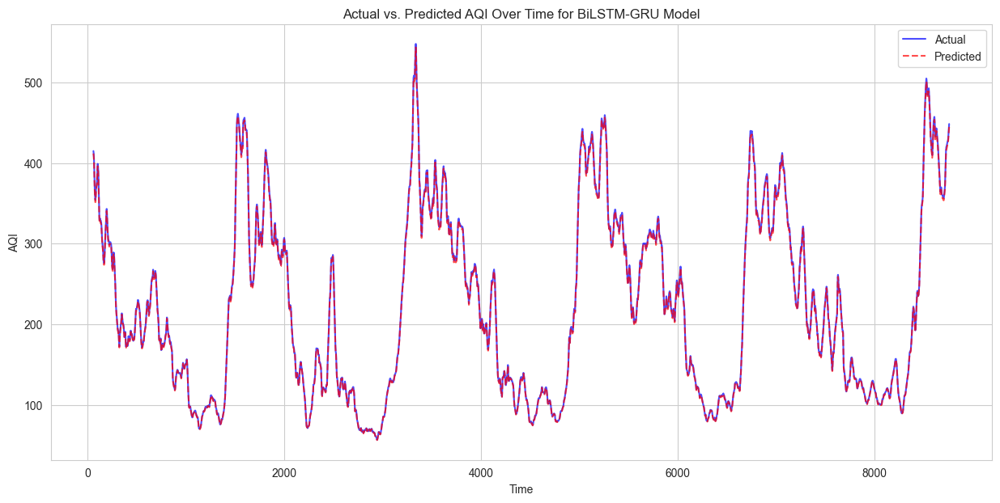

In [181]:
# Sort the DataFrame just in case the index is not in order.
results_df_BiLSTM_GRU.sort_index(inplace=True)
results_df_BiLSTM_GRU.reset_index(drop=True, inplace=True)

# Calculate the rolling average with a window (this window size can be changed as needed).
rolling_window_size = 60  # for example, a weekly rolling average
results_df_BiLSTM_GRU['Actual_smooth'] = results_df_BiLSTM_GRU['Actual'].rolling(window=rolling_window_size).mean()
results_df_BiLSTM_GRU['Predicted_BiLSTMgru_smooth'] = results_df_BiLSTM_GRU['Predicted_BiLSTMgru'].rolling(window=rolling_window_size).mean()

# Plotting the smoothed data
plt.figure(figsize=(15, 7))
plt.plot(results_df_BiLSTM_GRU.index, results_df_BiLSTM_GRU['Actual_smooth'], label='Actual', color='blue', alpha=0.7)
plt.plot(results_df_BiLSTM_GRU.index, results_df_BiLSTM_GRU['Predicted_BiLSTMgru_smooth'], label='Predicted', color='red', alpha=0.7, linestyle='--')
plt.title('Actual vs. Predicted AQI Over Time for BiLSTM-GRU Model')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.legend()
plt.show()


### GRU-MLP

In [254]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
import time

# Start time
start_time_gru_mlp = time.time()
print("Start time (GRU-MLP):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(start_time_gru_mlp)))

X_train_scaled_shaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_scaled_shaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))


# Build GRU Model
hyb_gru_model = Sequential()
hyb_gru_model.add(GRU(units=64, activation='relu', return_sequences=True, input_shape=(X_train_scaled_shaped.shape[1], X_train_scaled_shaped.shape[2])))
hyb_gru_model.add(GRU(units=128, activation='relu', return_sequences=True))
hyb_gru_model.add(GRU(units=32, activation='relu'))
hyb_gru_model.add(Dense(1))
hyb_gru_model.compile(optimizer='adam', loss='mean_squared_error')

# Train the GRU model
hyb_gru_model.fit(X_train_scaled_shaped, y_train, epochs=50, batch_size=32, verbose=1)

# Predict with GRU
hyb_gru_predictions_train = hyb_gru_model.predict(X_train_scaled_shaped)
hyb_gru_predictions_test = hyb_gru_model.predict(X_test_scaled_shaped)

# Reshape predictions to add a timestep dimension
hyb_gru_predictions_train_shaped = hyb_gru_predictions_train.reshape(-1, 1, 1)
hyb_gru_predictions_test_shaped = hyb_gru_predictions_test.reshape(-1, 1, 1)

# Concatenate reshaped predictions with original features for MLP input
X_train_mlp_input = np.concatenate((X_train_scaled_shaped, hyb_gru_predictions_train_shaped), axis=2)
X_test_mlp_input = np.concatenate((X_test_scaled_shaped, hyb_gru_predictions_test_shaped), axis=2)

# Flatten the GRU output to remove the time step dimension
X_train_mlp_input = X_train_mlp_input.reshape(X_train_mlp_input.shape[0], -1)
X_test_mlp_input = X_test_mlp_input.reshape(X_test_mlp_input.shape[0], -1)

# Update the build_mlp_model function to expect a flat input
def build_mlp_model(input_shape):
    model = Sequential([
        Dense(64, activation='relu', input_shape=(input_shape,)),  # `input_shape` is now a single integer
        Dense(128, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1, activation='linear')
    ])
    return model

# Use the updated shape when building the model
mlp_model_gru = build_mlp_model(input_shape=X_train_mlp_input.shape[1])

# Now the rest of your code for compiling, training, and evaluating the model should work as expected
mlp_model_gru.compile(optimizer=Adam(), loss=MeanSquaredError(), metrics=['mae', 'mse'])

# Training the MLP model
history_mlp_gru = mlp_model_gru.fit(X_train_mlp_input, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the MLP model on the test set
test_loss_mlp, test_mae_mlp, test_mse_mlp = mlp_model_gru.evaluate(X_test_mlp_input, y_test, verbose=1)
print(f"Test Loss (MLP-GRU): {test_loss_mlp}, Test MAE (MLP-GRU): {test_mae_mlp}, Test MSE (MLP-GRU): {test_mse_mlp}")

# Making predictions with MLP model
y_pred_mlp_gru = mlp_model_gru.predict(X_test_mlp_input)

# Performance metrics
mae_mlp_gru = mean_absolute_error(y_test, y_pred_mlp_gru)
mse_mlp_gru = mean_squared_error(y_test, y_pred_mlp_gru)
rmse_mlp_gru = np.sqrt(mse_mlp_gru)
r2_mlp_gru = r2_score(y_test, y_pred_mlp_gru)

print(f"Mean Absolute Error (MAE) of MLP-GRU: {mae_mlp_gru:.2f}")
print(f"Mean Squared Error (MSE) of MLP-GRU: {mse_mlp_gru:.2f}")
print(f"Root Mean Squared Error (RMSE) of MLP-GRU: {rmse_mlp_gru:.2f}")
print(f"R-squared (R²) of MLP-GRU: {r2_mlp_gru:}")

# End time
end_time_gru_mlp = time.time()
print("End time (GRU-MLP):", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end_time_gru_mlp)))

# Total execution time
execution_time_gru_mlp = end_time_gru_mlp - start_time_gru_mlp
print("Total execution time (GRU-MLP):", execution_time_gru_mlp, "seconds")


Start time (GRU-MLP): 2024-04-24 10:50:45
Epoch 1/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 18679.3008
Epoch 2/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 385.2588
Epoch 3/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 207.6774
Epoch 4/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 135.7378
Epoch 5/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 77.4520
Epoch 6/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 39.4777
Epoch 7/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 25.5200
Epoch 8/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 16.9764
Epoch 9/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 14.5540
Epoch 10/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 11.8592
Epoch 11/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 10.3538
Epoch 12/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 8.5871
Epoch 13/50
1096/1096 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 8.7525
Epoch 14/50
1096/1096 ━━━━━━━━━━━━━━━━━━

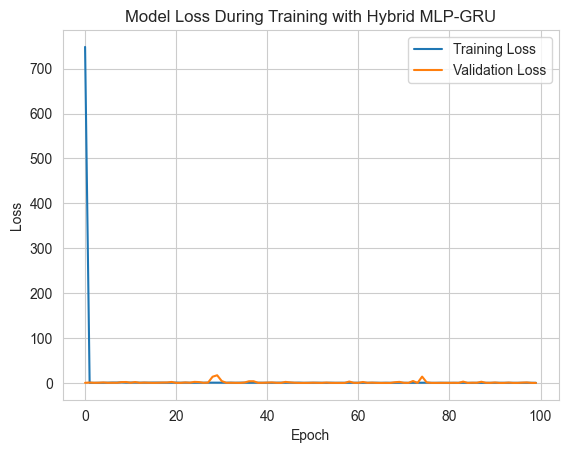

In [256]:
import matplotlib.pyplot as plt

# Plot the training loss and the validation loss
plt.plot(history_mlp_gru.history['loss'], label='Training Loss')
plt.plot(history_mlp_gru.history['val_loss'], label='Validation Loss')
plt.title('Model Loss During Training with Hybrid MLP-GRU')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


#### METRICS

In [263]:
# First, we need to extract the data from the provided text as we can't directly read the uploaded image for data.
# Since the user wants horizontal bar charts, we need to adjust the plotting function.

# Let's assume the data is the same as provided earlier in the text.
data = {
    'Model': ['Random Forest', 'Gradient Boosting', 'XGBoost', 'Decision Tree', 'LSTM', 'GRU', 'BiLSTM', 'MLP', 'TCN',
        'RF-GB Stacked Ensemble', 'Hybrid RF-GRU', 'Hybrid BiLSTM-GRU'
    ],
    'MSE': [ 1, 2.87, 5.1, 2.72, 2.04, 1.49, 1.9, 3.63, 2.5,0.93,0.85, 1.51],
    'RMSE': [1, 1.69, 2.26, 1.65, 1.43, 1.22, 1.38, 1.9, 1.58,0.96, 0.92, 1.23],
    'MAE': [0.22, 0.99, 0.92, 0.33, 1.05, 0.92, 1.03, 1.4, 1.15,0.29,0.26,0.85],
    'R2': [0.999941936, 0.999833766, 0.999704417, 0.999842375,0.999876703, 0.999911854,0.999929964,
           0.999765345,0.999853781,0.999946331,0.99995097,0.999912603]
}

# Convert to DataFrame
results_df = pd.DataFrame(data)
results_df

,Model,MSE,RMSE,MAE,R2
0,Random Forest,1.00,1.00,0.22,0.999942
1,Gradient Boosting,2.87,1.69,0.99,0.999834
2,XGBoost,5.10,2.26,0.92,0.999704
3,Decision Tree,2.72,1.65,0.33,0.999842
4,LSTM,2.04,1.43,1.05,0.999877
5,GRU,1.49,1.22,0.92,0.999912
6,BiLSTM,1.90,1.38,1.03,0.999930
7,MLP,3.63,1.90,1.40,0.999765
8,TCN,2.50,1.58,1.15,0.999854
9,RF-GB Stacked Ensemble,0.93,0.96,0.29,0.999946


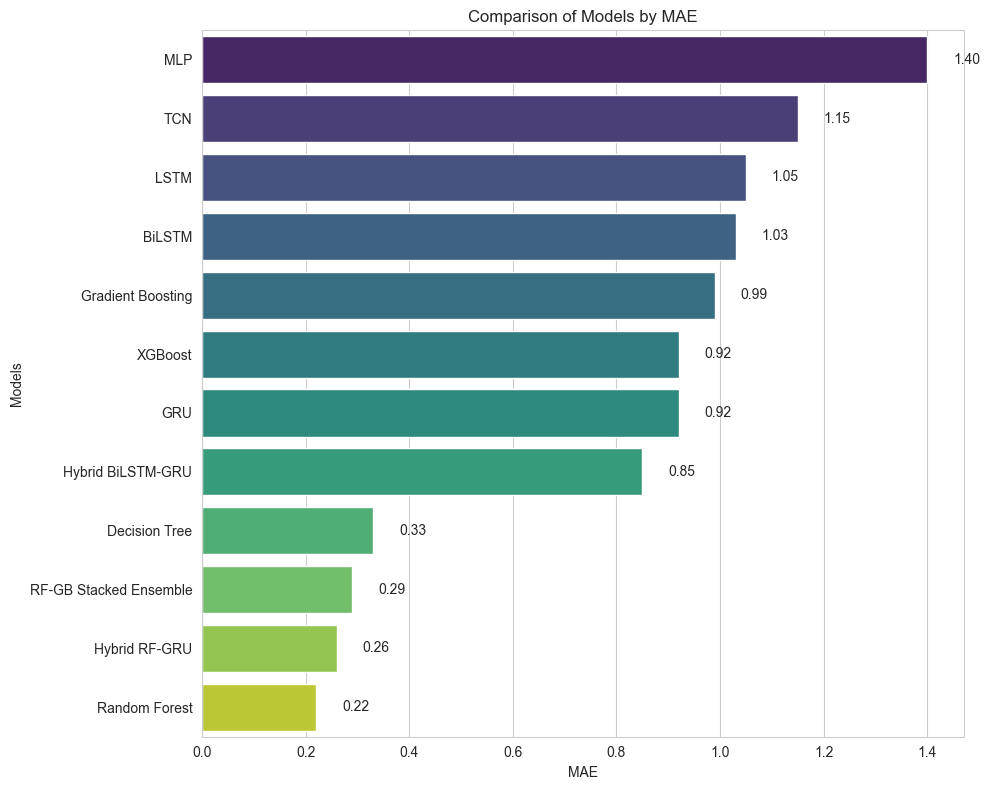

In [264]:
###MAE
# Sorting the data based on the RMSE for horizontal bar chart
results_df_sorted_rmse = results_df.sort_values('MAE', ascending=False)
# Re-plotting the RMSE horizontal bar chart with the values annotated just outside each bar
plt.figure(figsize=(10, 8))

# Create the horizontal bar plot with Seaborn for RMSE
ax = sns.barplot(x='MAE', y='Model', data=results_df_sorted_rmse, palette='viridis')

# Title and labels
plt.title('Comparison of Models by MAE')
plt.xlabel('MAE')
plt.ylabel('Models')

# Annotate the RMSE values on the bars, just outside of the bar end
for p in ax.patches:
    width = p.get_width()  # get the width of the bar
    plt.text(width + 0.05,  # add a little space to the right of the bar
             p.get_y() + p.get_height() / 2,  # get the vertical position
             '{:1.2f}'.format(width),  # the text to display
             va = 'center')  # center the text vertically

plt.tight_layout()
plt.show()

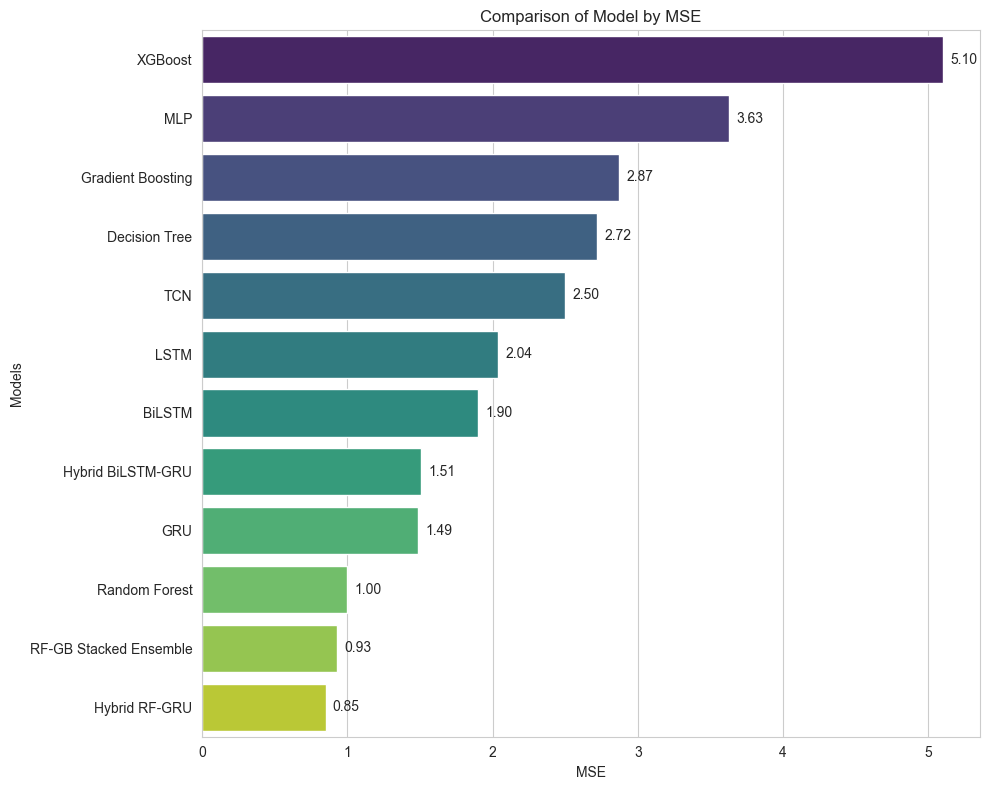

In [265]:
###MSE
# Sorting the data based on the RMSE for horizontal bar chart
results_df_sorted_rmse = results_df.sort_values('MSE', ascending=False)
# Re-plotting the RMSE horizontal bar chart with the values annotated just outside each bar
plt.figure(figsize=(10, 8))

# Create the horizontal bar plot with Seaborn for RMSE
ax = sns.barplot(x='MSE', y='Model', data=results_df_sorted_rmse, palette='viridis')

# Title and labels
plt.title('Comparison of Model by MSE')
plt.xlabel('MSE')
plt.ylabel('Models')

# Annotate the RMSE values on the bars, just outside of the bar end
for p in ax.patches:
    width = p.get_width()  # get the width of the bar
    plt.text(width + 0.05,  # add a little space to the right of the bar
             p.get_y() + p.get_height() / 2,  # get the vertical position
             '{:1.2f}'.format(width),  # the text to display
             va = 'center')  # center the text vertically

plt.tight_layout()
plt.show()

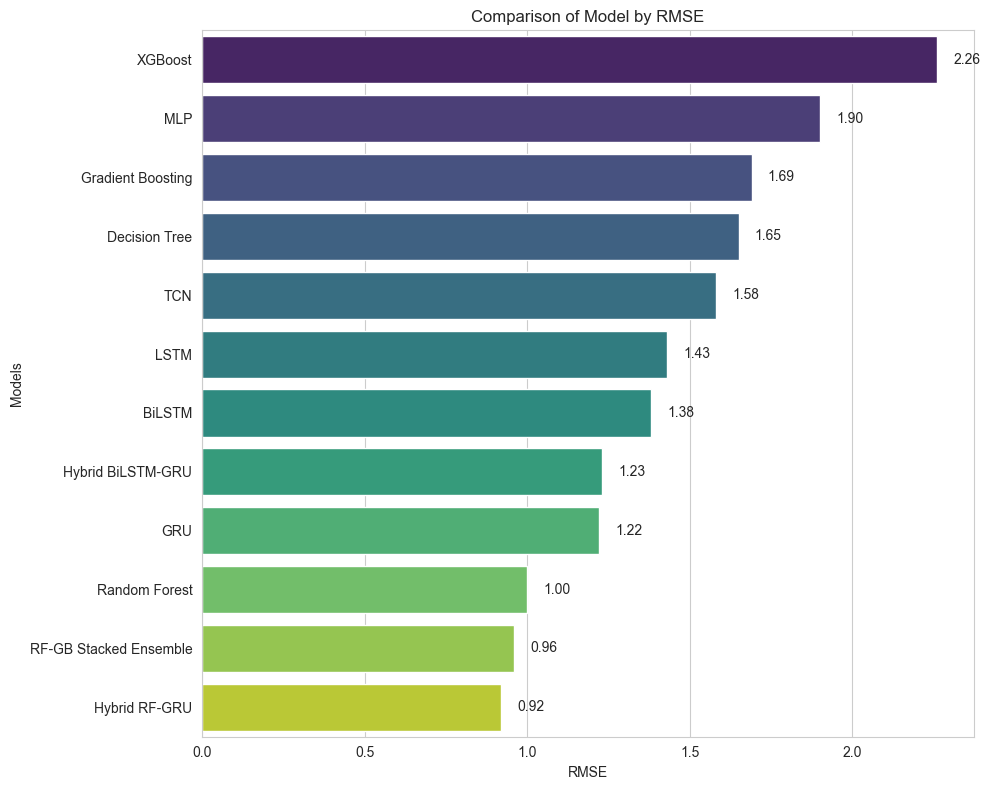

In [266]:

###RMSE
# Sorting the data based on the RMSE for horizontal bar chart
results_df_sorted_rmse = results_df.sort_values('RMSE', ascending=False)
plt.figure(figsize=(10, 8))
# Creating the horizontal bar plot with Seaborn for RMSE
ax = sns.barplot(x='RMSE', y='Model', data=results_df_sorted_rmse, palette='viridis')
# Title and labels
plt.title('Comparison of Model by RMSE')
plt.xlabel('RMSE')
plt.ylabel('Models')
# Annotate the RMSE values on the bars, just outside of the bar end
for p in ax.patches:
    width = p.get_width()  
    plt.text(width + 0.05,  
             p.get_y() + p.get_height() / 2,  
             '{:1.2f}'.format(width),  
             va = 'center')  
plt.tight_layout()
plt.show()

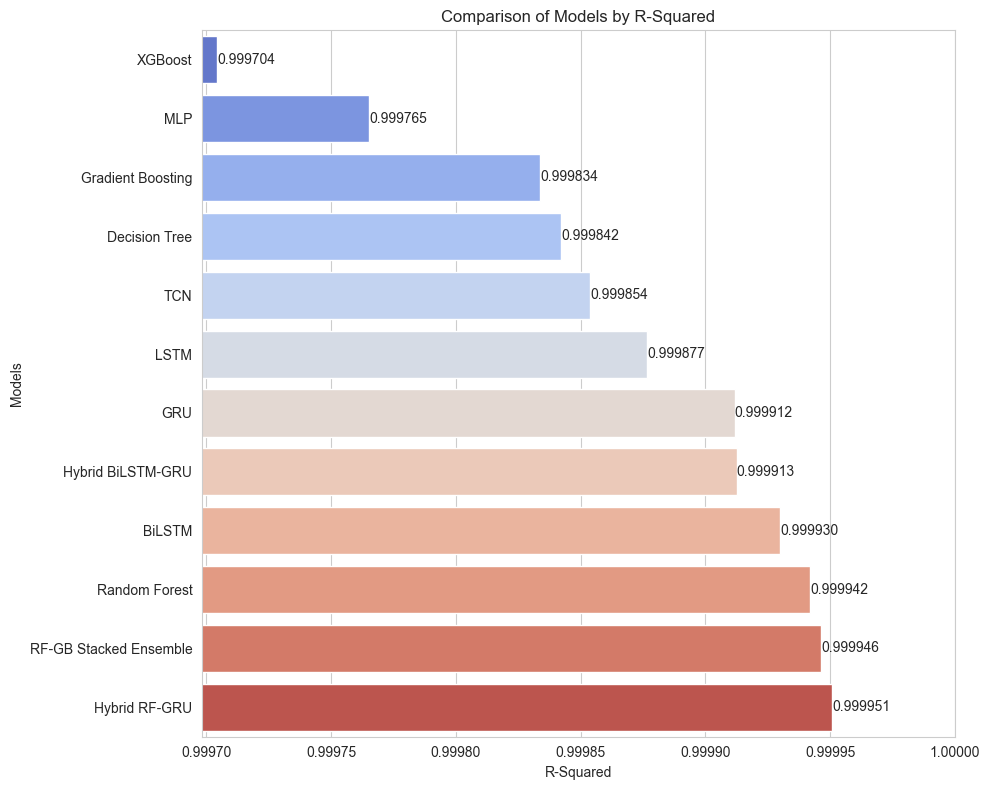

In [269]:
# Extracting the R-squared values to find the minimum value
r2_values = results_df_sorted_r2['R2']
min_r2_value = r2_values.min()
# Adding a small buffer to the minimum value for plotting (e.g., the difference to the next higher value in the data)
buffer = (r2_values - min_r2_value).sort_values().iloc[1] / 10
plot_start = min_r2_value - buffer

# Plotting the R-squared horizontal bar chart with the x-axis starting from plot_start
plt.figure(figsize=(10, 8))

# Create the horizontal bar plot with Seaborn for R-squared, starting the x-axis closer to the minimum value
ax = sns.barplot(x='R2', y='Model', data=results_df_sorted_r2, palette='coolwarm')
plt.xlim(plot_start, 1)  # Set the x-axis to start from plot_start

# Title and labels
plt.title('Comparison of Models by R-Squared')
plt.xlabel('R-Squared')
plt.ylabel('Models')

# Annotating the R-squared values on the bars, just outside of the bar end
for p in ax.patches:
    width = p.get_width()
    plt.text(width,  
             p.get_y() + p.get_height() / 2,  
             '{:.6f}'.format(width), 
             va='center') 

plt.tight_layout()
plt.show()
